### Explanatory Data Analysis

* Null Values Counts
* Distributions ,Skewness ,outliers (Continous)
* Categorical Counts (Nominal, Categorical)
* ScatterPlots and Correlation Plots (Continous)
* Boxplots against target variable (Nominal, Categorical)
* distribution of target with  respect to (Nominal, Categorical)
* Summary

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#import scipy.stats
from scipy import stats
from scipy.stats import skew, boxcox_normmax, norm
from scipy.special import boxcox1p

In [2]:
import fuzzywuzzy
from fuzzywuzzy import process
import chardet

C:\ProgramData\Anaconda3\lib\site-packages\fuzzywuzzy\fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [134]:
# Set Matplotlib defaults
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True)
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)

In [2]:
train = pd.read_csv('train.csv')
print(train.shape)
train.head().T

(1460, 81)


,0,1,2,3,4
Id,1,2,3,4,5
MSSubClass,60,20,60,70,60
MSZoning,RL,RL,RL,RL,RL
LotFrontage,65.0,80.0,68.0,60.0,84.0
LotArea,8450,9600,11250,9550,14260
...,...,...,...,...,...
MoSold,2,5,9,2,12
YrSold,2008,2007,2008,2006,2008
SaleType,WD,WD,WD,WD,WD
SaleCondition,Normal,Normal,Normal,Abnorml,Normal


In [3]:
test = pd.read_csv('test.csv')
print(test.shape)
test.head().T

(1459, 80)


,0,1,2,3,4
Id,1461,1462,1463,1464,1465
MSSubClass,20,20,60,60,120
MSZoning,RH,RL,RL,RL,RL
LotFrontage,80.0,81.0,74.0,78.0,43.0
LotArea,11622,14267,13830,9978,5005
...,...,...,...,...,...
MiscVal,0,12500,0,0,0
MoSold,6,6,3,6,1
YrSold,2010,2010,2010,2010,2010
SaleType,WD,WD,WD,WD,WD


In [6]:
train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [3]:
train.info()

NameError: name 'train' is not defined

In [8]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

### data contains missing value .. Lets check

### get numerical and categorical features

In [21]:
cats_train = train.select_dtypes(include='object').columns
cats_test = test.select_dtypes(include='object').columns
print('No of train cat_cols : ',len(cats_train))
print('No of test cat_cols : ',len(cats_test))

No of train cat_cols :  43
No of test cat_cols :  43


In [15]:
nums_train = train.select_dtypes(exclude='object').columns
nums_test = test.select_dtypes(exclude='object').columns
print('No of train cat_cols : ',len(nums_train))
print('No of test cat_cols : ',len(nums_test))

No of train cat_cols :  38
No of test cat_cols :  37


### Number of unique categorical features and value_counts

In [11]:
for col in cats_train:
    print('=============================================')
    print(col)
    print('length of unique : ',len(train[col].unique()))
    print(train[col].value_counts())

MSZoning
length of unique :  5
RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64
Street
length of unique :  2
Pave    1454
Grvl       6
Name: Street, dtype: int64
Alley
length of unique :  3
Grvl    50
Pave    41
Name: Alley, dtype: int64
LotShape
length of unique :  4
Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64
LandContour
length of unique :  4
Lvl    1311
Bnk      63
HLS      50
Low      36
Name: LandContour, dtype: int64
Utilities
length of unique :  2
AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64
LotConfig
length of unique :  5
Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64
LandSlope
length of unique :  3
Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64
Neighborhood
length of unique :  25
NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer     

### sometimes some category maybe in train and not in test vice versa

In [12]:
def check_subset(train,test,column_list):
    false_list=[]
    for col in column_list:
        boolean = set(test[col].unique()).issubset(set(train[col].unique()))
        if boolean== False:
            print("column : ",col)
            print("test is a subset: ",boolean)
            print("====================")
            false_list.append(col)
    return false_list

check_subset(train,test,cats_train)

column :  MSZoning
test is a subset:  False
column :  Utilities
test is a subset:  False
column :  Exterior1st
test is a subset:  False
column :  Exterior2nd
test is a subset:  False
column :  KitchenQual
test is a subset:  False
column :  Functional
test is a subset:  False
column :  SaleType
test is a subset:  False


['MSZoning',
 'Utilities',
 'Exterior1st',
 'Exterior2nd',
 'KitchenQual',
 'Functional',
 'SaleType']

### the na was treated as a new category

### merging of train and test

In [11]:
merged = pd.concat([train,test],axis=0)

In [8]:
target = train.SalePrice

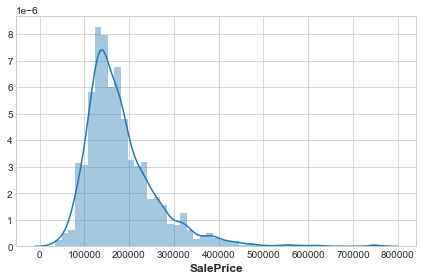

In [33]:
sns.distplot(target,kde=True)

#### the price uniform distribution i.e bell curve

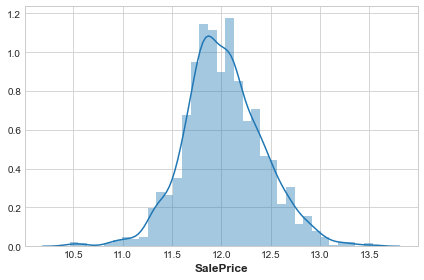

In [10]:
sns.distplot(np.log1p(target),kde=True)

#### the logged_target values gives a better distribution

### lets check the number of missing values and the percentage in train,test,and merged dataframe

In [29]:
def missing_values(train,test,merged,column_list):
    row_train = train.shape[0]; row_test = test.shape[0] ; row_merged = merged.shape[0]
    train_null = train[column_list].isna().sum()
    missing = train_null[train_null>0]
    missing.sort_values(inplace=True)
    test_null = test[column_list].isna().sum()
    merged_null = merged[column_list].isna().sum() ; merged_null = merged_null.sort_values(ascending=False)
    train_perc = train_null / row_train ; test_perc = test_null / row_test
    merge_perc = merged_null/ row_merged
    idx = merged_null.index.to_list()
    null_df = pd.concat([merged_null,train_null,test_null,merge_perc,train_perc,test_perc],axis=1,keys=idx)
    null_df.columns= ['merged_null','train_null','test_null','merge_perc','train_perc','test_perc']
    null_df_out = null_df.query(' merged_null > 0 and train_null > 0 and test_null> 0 and merge_perc> 0 and train_perc> 0 and test_perc > 0' )
    
    missing.plot.bar()
    return null_df_out
       

#### categorical features

,merged_null,train_null,test_null,merge_perc,train_perc,test_perc
PoolQC,2909,1453,1456,0.996574,0.995205,0.997944
MiscFeature,2814,1406,1408,0.964029,0.963014,0.965045
Alley,2721,1369,1352,0.932169,0.937671,0.926662
Fence,2348,1179,1169,0.804385,0.807534,0.801234
FireplaceQu,1420,690,730,0.486468,0.472603,0.500343
GarageCond,159,81,78,0.054471,0.055479,0.053461
GarageQual,159,81,78,0.054471,0.055479,0.053461
GarageFinish,159,81,78,0.054471,0.055479,0.053461
GarageType,157,81,76,0.053786,0.055479,0.052090
BsmtExposure,82,38,44,0.028092,0.026027,0.030158


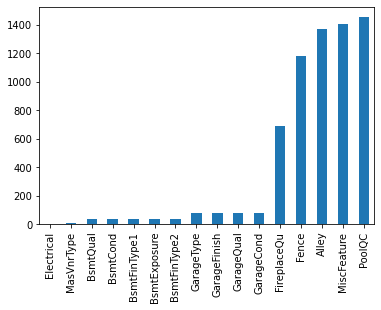

In [30]:
missing_values(train,test,merged,cats_test) 

* features like PoolQC,MiscFeature,ALley,Fence have more than 80%  null values..And its consistent across train,test and merged

* the remaining categorical feature will the filled as 'empty' or 'missing'

### lets look further into this features before dropping them if the rows are consistent

In [17]:
missing_values(train,test,merged,cats_test).index

Index(['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu', 'GarageCond',
       'GarageQual', 'GarageFinish', 'GarageType', 'BsmtCond', 'BsmtExposure',
       'BsmtQual', 'BsmtFinType2', 'BsmtFinType1', 'MasVnrType'],
      dtype='object')

In [ ]:
max_null_col =['PoolQC', 'MiscFeature', 'Alley', 'Fence','FireplaceQu']  # 1077 rows

In [22]:
condition = (train['PoolQC'].isna()) & (train['MiscFeature'].isna()) & (train['Alley'].isna()) & (train['Fence'].isna())
#location_null = train.loc[:,]
train[condition]#train['PoolQC'].isna()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1452,1453,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2006,WD,Normal,145000
1453,1454,20,RL,90.0,17217,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2006,WD,Abnorml,84500
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [29]:
def get_number_of_similar_rows_with_null(df):
    df_def = df.copy() # best practice to use a copy of the df instead of the original df for roll_back purposes
    condition1 = (df_def['PoolQC'].isna()) & (df_def['MiscFeature'].isna()) & (df_def['Alley'].isna()) & (df_def['Fence'].isna()) & (df_def['FireplaceQu'].isna())
    condition2 = (df_def['PoolQC'].isna()) & (df_def['MiscFeature'].isna()) & (df_def['Alley'].isna()) & (df_def['Fence'].isna())
    condition3 = (df_def['PoolQC'].isna() & df_def['MiscFeature'].isna() & df_def['Alley'].isna())
    
    all5_null = df_def[condition1].shape[0]
    all4_null = df_def[condition2].shape[0]
    all3_null = df_def[condition3].shape[0]
    
    print('Total number of rows : ',df_def.shape[0])
    print('all5_null number of rows : ',all5_null)
    print('all4_null number of rows : ',all4_null)
    print('all3_null number of rows : ',all3_null)
    

In [30]:
get_number_of_similar_rows_with_null(df=train)

Total number of rows :  1460
all5_null number of rows :  471
all4_null number of rows :  1077
all3_null number of rows :  1313


In [31]:
get_number_of_similar_rows_with_null(df=test)

Total number of rows :  1459
all5_null number of rows :  492
all4_null number of rows :  1047
all3_null number of rows :  1302


### The missing values were consist across all rows with the missing value i.e Fence,Alley etc.
### lets see if it affects the price

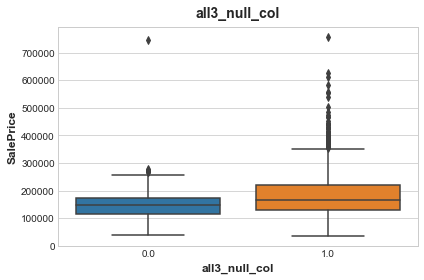

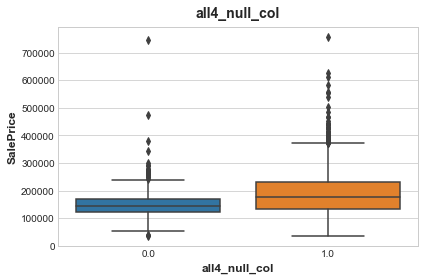

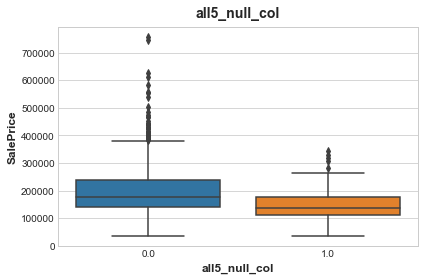

In [39]:
def get_number_of_similar_rows_with_null(df):
    df_def = df.copy() # best practice to use a copy of the df instead of the original df for roll_back purposes
    condition1 = (df_def['PoolQC'].isna()) & (df_def['MiscFeature'].isna()) & (df_def['Alley'].isna()) & (df_def['Fence'].isna()) & (df_def['FireplaceQu'].isna())
    condition2 = (df_def['PoolQC'].isna()) & (df_def['MiscFeature'].isna()) & (df_def['Alley'].isna()) & (df_def['Fence'].isna())
    condition3 = (df_def['PoolQC'].isna() & df_def['MiscFeature'].isna() & df_def['Alley'].isna())
    
    all5_null = df_def[condition1]
    all4_null = df_def[condition2]
    all3_null = df_def[condition3]
    #print(all3_null.index)
    df_def.loc[all3_null.index,'all3_null_col'] = 1 #there is abetter way
    df_def.loc[all4_null.index,'all4_null_col'] = 1
    df_def.loc[all5_null.index,'all5_null_col'] = 1
    
    df_def['all3_null_col'].fillna(0,inplace=True)
    df_def['all4_null_col'].fillna(0,inplace=True)
    df_def['all5_null_col'].fillna(0,inplace=True)
    
    for col in ['all3_null_col','all4_null_col','all5_null_col']:
        sns.boxplot(y='SalePrice', x=col, data=df_def)
        plt.title(col)
        plt.show();
    
    #print(df_def['all3_null_col'].value_counts())
get_number_of_similar_rows_with_null(df=train)

* all3null : houses with the 3 null values have higher median price  than houses without all 3 null
* all4null : houses with the 4 null values have higher median price  than houses without all 4 null
* all5null : houses with the 5 null values have lesser median price  than houses without all 5 null

#### numerical features

In [16]:
missing_values(train,test,merged,nums_test)

,merged_null,train_null,test_null,merge_perc,train_perc,test_perc
LotFrontage,486,259,227,0.166495,0.177397,0.155586
GarageYrBlt,159,81,78,0.054471,0.055479,0.053461
MasVnrArea,23,8,15,0.007879,0.005479,0.010281


### the numerical features have less number of null values, with 16% as highest percentage of null values

* we may use median , mean or -999

### the target variable

In [53]:
target.describe(percentiles = [0,0.25,0.5,0.75,0.8,0.85,0.9,0.95,1])

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
0%        34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
80%      230000.000000
85%      250000.000000
90%      278000.000000
95%      326100.000000
100%     755000.000000
max      755000.000000
Name: SalePrice, dtype: float64

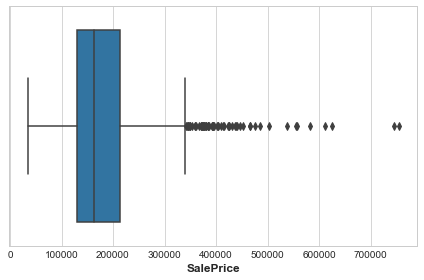

In [54]:
sns.boxplot(target)

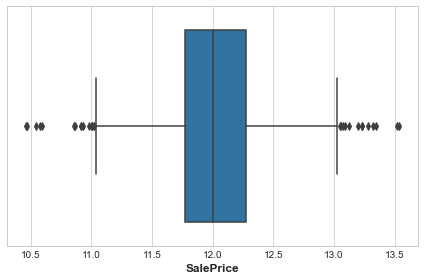

In [11]:
sns.boxplot(np.log1p(target))

size :  1375


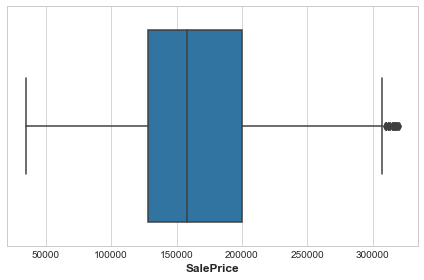

In [62]:
print("size : ",len(target[target<320000]))
sns.boxplot(target[target<320000])

size :  1375


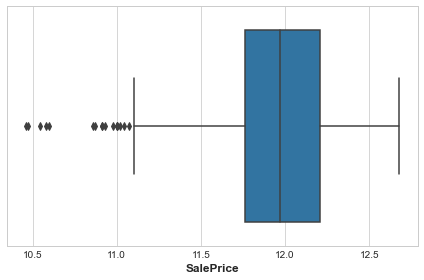

In [12]:
print("size : ",len(target[target<320000]))
sns.boxplot(np.log1p(target[target<320000]))

In [63]:
#drop
1460-1375

85

### numerical variable

In [9]:
def numeric_distribution_plot(df,merged):
    """
     Description : Plot countplot for all categorical features 
    present in the dataframe passed
    
    Argument : Dataframe
    """
    nums_train = df.select_dtypes(exclude='object').columns
    for col in nums_train:
        print(df[col].describe())
        plt.figure(figsize=(12,10))
        fig,axes = plt.subplots(1,2)
        plt.title("Distribution of "+col)
        sns.distplot(df[col].dropna(),ax=axes[0],axlabel='train',fit=scipy.stats.norm)
        sns.distplot(merged[col].dropna(),ax=axes[1],axlabel='merged',fit=scipy.stats.norm)
        plt.tight_layout()
        plt.show()

count    1460.000000
mean      730.500000
std       421.610009
min         1.000000
25%       365.750000
50%       730.500000
75%      1095.250000
max      1460.000000
Name: Id, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

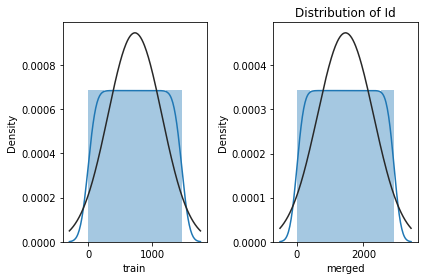

count    1460.000000
mean       56.897260
std        42.300571
min        20.000000
25%        20.000000
50%        50.000000
75%        70.000000
max       190.000000
Name: MSSubClass, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

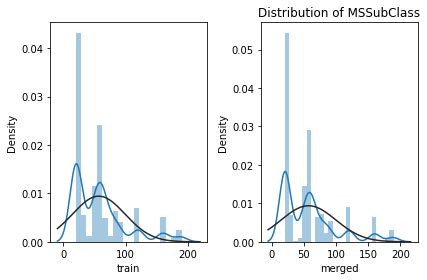

count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

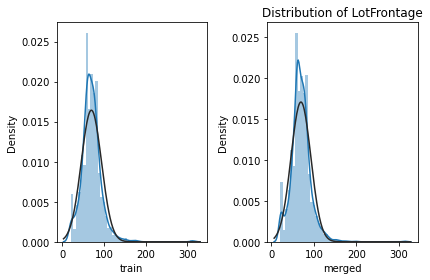

count      1460.000000
mean      10516.828082
std        9981.264932
min        1300.000000
25%        7553.500000
50%        9478.500000
75%       11601.500000
max      215245.000000
Name: LotArea, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

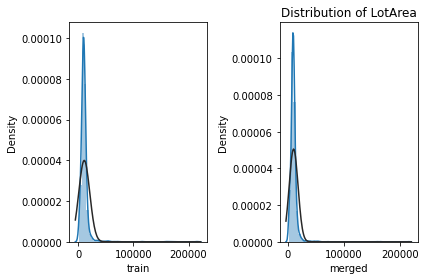

count    1460.000000
mean        6.099315
std         1.382997
min         1.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        10.000000
Name: OverallQual, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

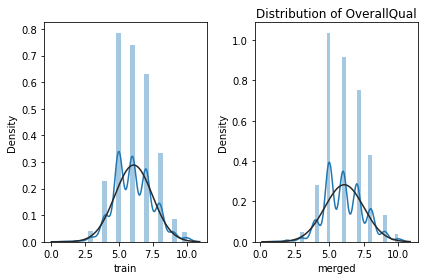

count    1460.000000
mean        5.575342
std         1.112799
min         1.000000
25%         5.000000
50%         5.000000
75%         6.000000
max         9.000000
Name: OverallCond, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

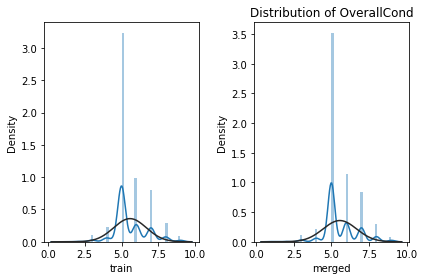

count    1460.000000
mean     1971.267808
std        30.202904
min      1872.000000
25%      1954.000000
50%      1973.000000
75%      2000.000000
max      2010.000000
Name: YearBuilt, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

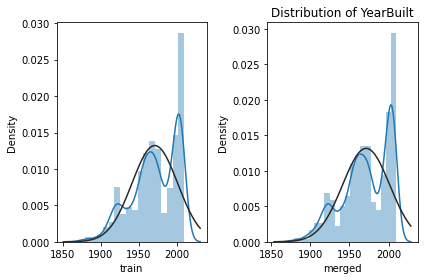

count    1460.000000
mean     1984.865753
std        20.645407
min      1950.000000
25%      1967.000000
50%      1994.000000
75%      2004.000000
max      2010.000000
Name: YearRemodAdd, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

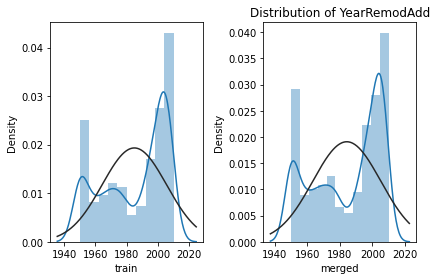

count    1452.000000
mean      103.685262
std       181.066207
min         0.000000
25%         0.000000
50%         0.000000
75%       166.000000
max      1600.000000
Name: MasVnrArea, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

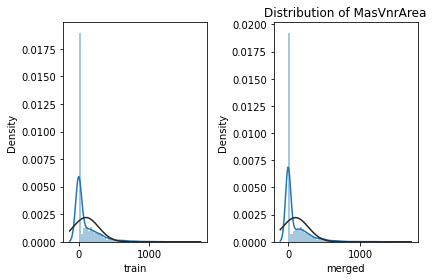

count    1460.000000
mean      443.639726
std       456.098091
min         0.000000
25%         0.000000
50%       383.500000
75%       712.250000
max      5644.000000
Name: BsmtFinSF1, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

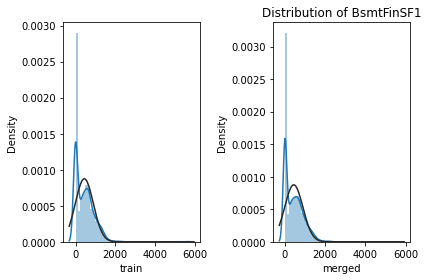

count    1460.000000
mean       46.549315
std       161.319273
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max      1474.000000
Name: BsmtFinSF2, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

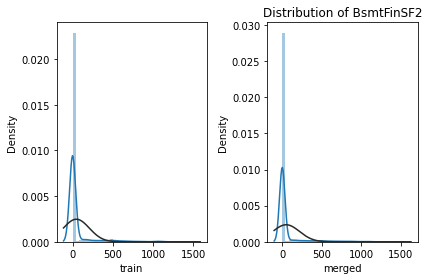

count    1460.000000
mean      567.240411
std       441.866955
min         0.000000
25%       223.000000
50%       477.500000
75%       808.000000
max      2336.000000
Name: BsmtUnfSF, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

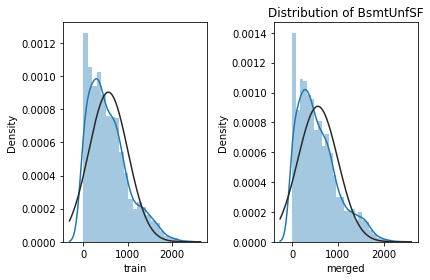

count    1460.000000
mean     1057.429452
std       438.705324
min         0.000000
25%       795.750000
50%       991.500000
75%      1298.250000
max      6110.000000
Name: TotalBsmtSF, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

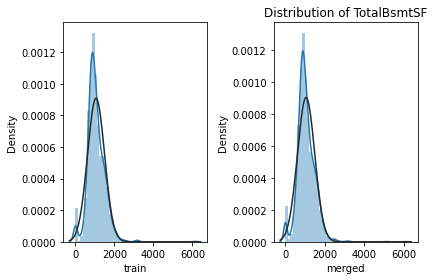

count    1460.000000
mean     1162.626712
std       386.587738
min       334.000000
25%       882.000000
50%      1087.000000
75%      1391.250000
max      4692.000000
Name: 1stFlrSF, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

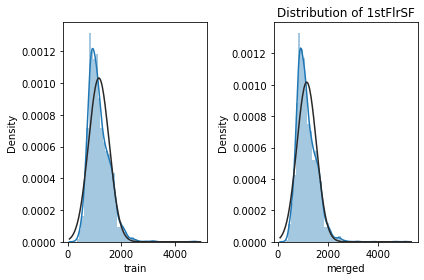

count    1460.000000
mean      346.992466
std       436.528436
min         0.000000
25%         0.000000
50%         0.000000
75%       728.000000
max      2065.000000
Name: 2ndFlrSF, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

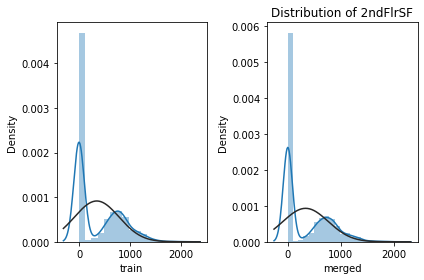

count    1460.000000
mean        5.844521
std        48.623081
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       572.000000
Name: LowQualFinSF, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

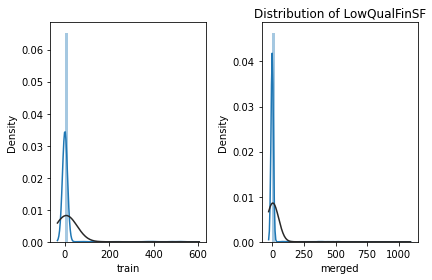

count    1460.000000
mean     1515.463699
std       525.480383
min       334.000000
25%      1129.500000
50%      1464.000000
75%      1776.750000
max      5642.000000
Name: GrLivArea, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

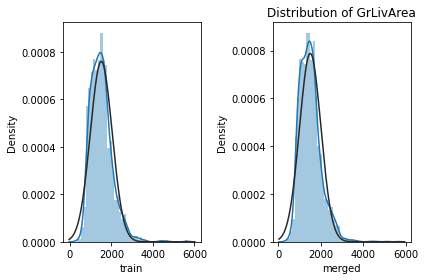

count    1460.000000
mean        0.425342
std         0.518911
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         3.000000
Name: BsmtFullBath, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

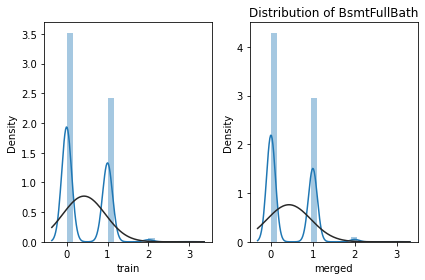

count    1460.000000
mean        0.057534
std         0.238753
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         2.000000
Name: BsmtHalfBath, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

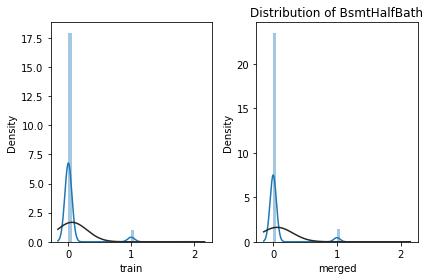

count    1460.000000
mean        1.565068
std         0.550916
min         0.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         3.000000
Name: FullBath, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

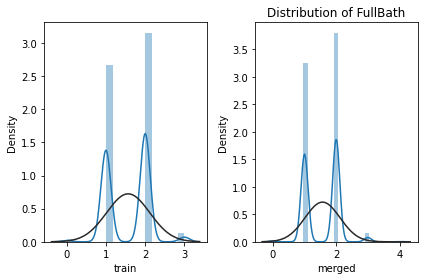

count    1460.000000
mean        0.382877
std         0.502885
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         2.000000
Name: HalfBath, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

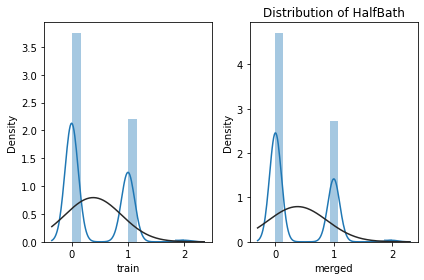

count    1460.000000
mean        2.866438
std         0.815778
min         0.000000
25%         2.000000
50%         3.000000
75%         3.000000
max         8.000000
Name: BedroomAbvGr, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

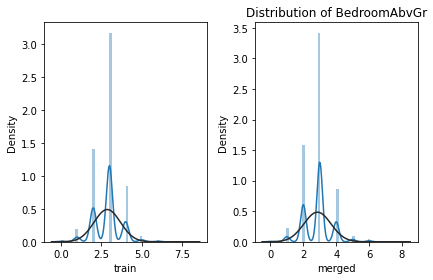

count    1460.000000
mean        1.046575
std         0.220338
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         3.000000
Name: KitchenAbvGr, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

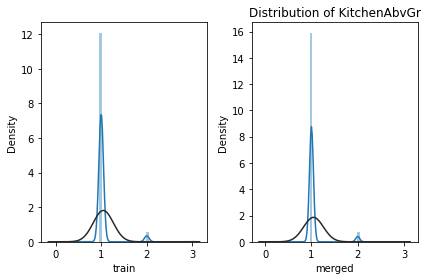

count    1460.000000
mean        6.517808
std         1.625393
min         2.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        14.000000
Name: TotRmsAbvGrd, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

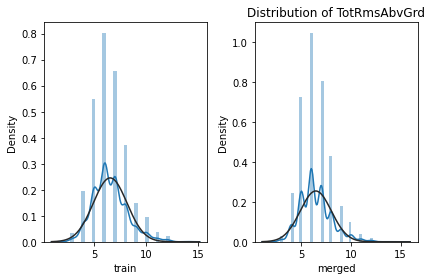

count    1460.000000
mean        0.613014
std         0.644666
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         3.000000
Name: Fireplaces, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

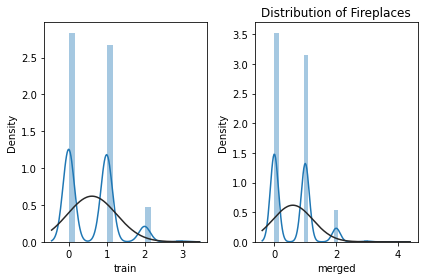

count    1379.000000
mean     1978.506164
std        24.689725
min      1900.000000
25%      1961.000000
50%      1980.000000
75%      2002.000000
max      2010.000000
Name: GarageYrBlt, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

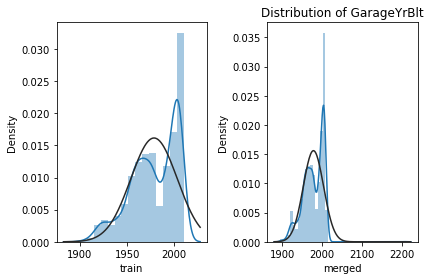

count    1460.000000
mean        1.767123
std         0.747315
min         0.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         4.000000
Name: GarageCars, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

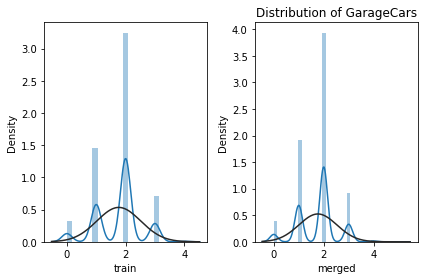

count    1460.000000
mean      472.980137
std       213.804841
min         0.000000
25%       334.500000
50%       480.000000
75%       576.000000
max      1418.000000
Name: GarageArea, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

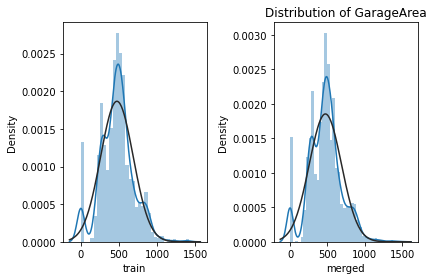

count    1460.000000
mean       94.244521
std       125.338794
min         0.000000
25%         0.000000
50%         0.000000
75%       168.000000
max       857.000000
Name: WoodDeckSF, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

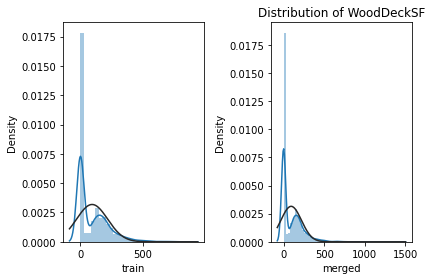

count    1460.000000
mean       46.660274
std        66.256028
min         0.000000
25%         0.000000
50%        25.000000
75%        68.000000
max       547.000000
Name: OpenPorchSF, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

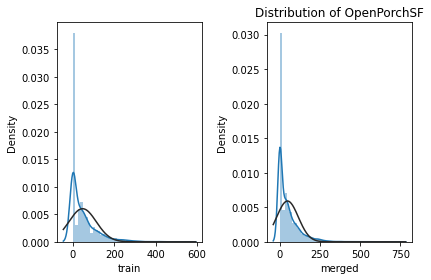

count    1460.000000
mean       21.954110
std        61.119149
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       552.000000
Name: EnclosedPorch, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

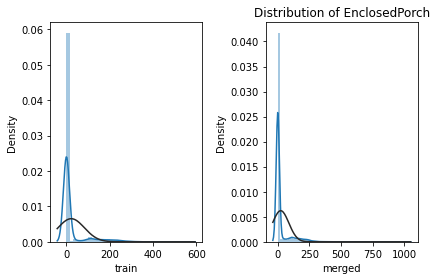

count    1460.000000
mean        3.409589
std        29.317331
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       508.000000
Name: 3SsnPorch, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

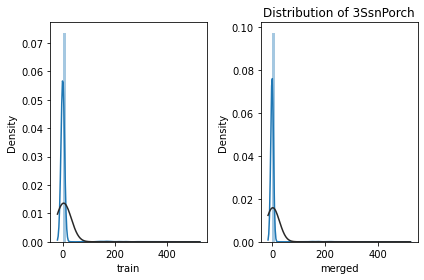

count    1460.000000
mean       15.060959
std        55.757415
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       480.000000
Name: ScreenPorch, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

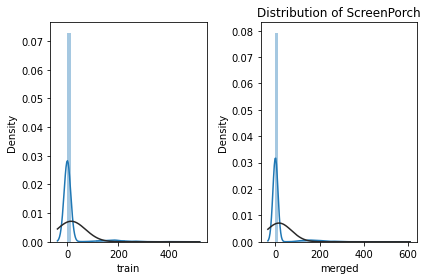

count    1460.000000
mean        2.758904
std        40.177307
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       738.000000
Name: PoolArea, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

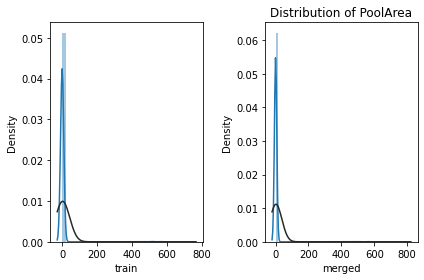

count     1460.000000
mean        43.489041
std        496.123024
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max      15500.000000
Name: MiscVal, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

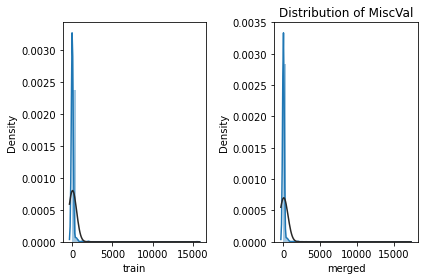

count    1460.000000
mean        6.321918
std         2.703626
min         1.000000
25%         5.000000
50%         6.000000
75%         8.000000
max        12.000000
Name: MoSold, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

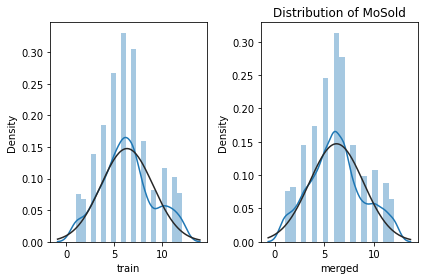

count    1460.000000
mean     2007.815753
std         1.328095
min      2006.000000
25%      2007.000000
50%      2008.000000
75%      2009.000000
max      2010.000000
Name: YrSold, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

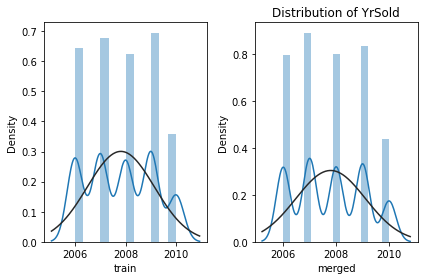

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 864x720 with 0 Axes>

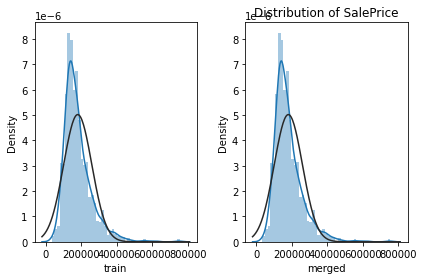

In [12]:
numeric_distribution_plot(df=train,merged=merged)

In [8]:
skew_df = pd.DataFrame(train.select_dtypes(np.number).columns, columns=['Feature'])
skew_df['Skew'] = skew_df['Feature'].apply(lambda feature: scipy.stats.skew(train[feature].dropna()))
skew_df['Absolute Skew'] = skew_df['Skew'].apply(abs)
skew_df['Skewed'] = skew_df['Absolute Skew'].apply(lambda x: True if x >= 0.5 else False)
skew_df

,Feature,Skew,Absolute Skew,Skewed
0,Id,0.000000,0.000000,False
1,MSSubClass,1.406210,1.406210,True
2,LotFrontage,2.160866,2.160866,True
3,LotArea,12.195142,12.195142,True
4,OverallQual,0.216721,0.216721,False
5,OverallCond,0.692355,0.692355,True
6,YearBuilt,-0.612831,0.612831,True
7,YearRemodAdd,-0.503044,0.503044,True
8,MasVnrArea,2.666326,2.666326,True
9,BsmtFinSF1,1.683771,1.683771,True


### from the plot we are having some numerical features as categorical variable

In [17]:


num_cat = ['MSSubClass','OverallQual','OverallCond','BsmtFullBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr',
           'TotRmsAbvGrd','Fireplaces','GarageCars','MoSold','YrSold',]

### lets look at the distribution of the continous variable

count    1460.000000
mean      730.500000
std       421.610009
min         1.000000
25%       365.750000
50%       730.500000
75%      1095.250000
max      1460.000000
Name: Id, dtype: float64


<Figure size 864x720 with 0 Axes>

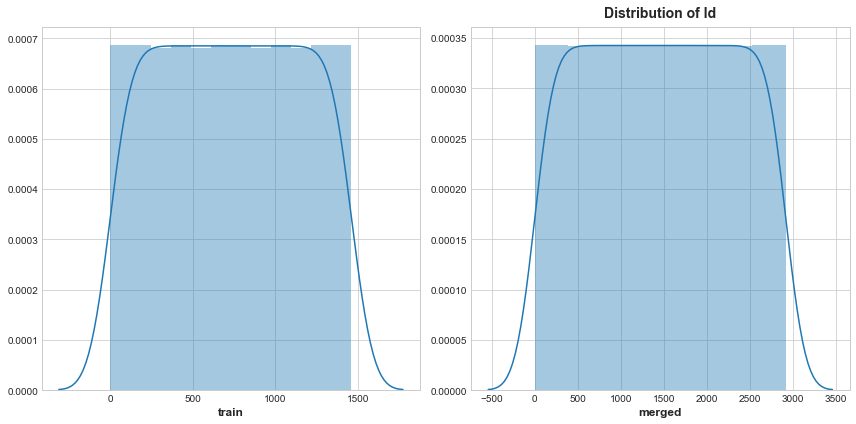

count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64


<Figure size 864x720 with 0 Axes>

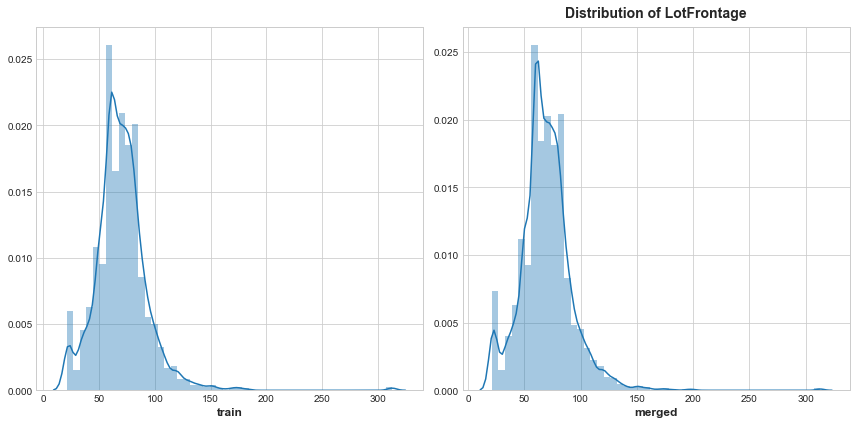

count      1460.000000
mean      10516.828082
std        9981.264932
min        1300.000000
25%        7553.500000
50%        9478.500000
75%       11601.500000
max      215245.000000
Name: LotArea, dtype: float64


<Figure size 864x720 with 0 Axes>

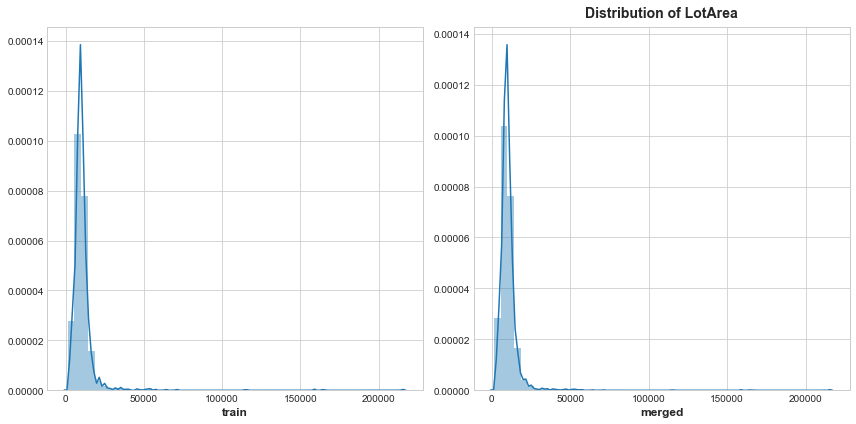

count    1460.000000
mean     1971.267808
std        30.202904
min      1872.000000
25%      1954.000000
50%      1973.000000
75%      2000.000000
max      2010.000000
Name: YearBuilt, dtype: float64


<Figure size 864x720 with 0 Axes>

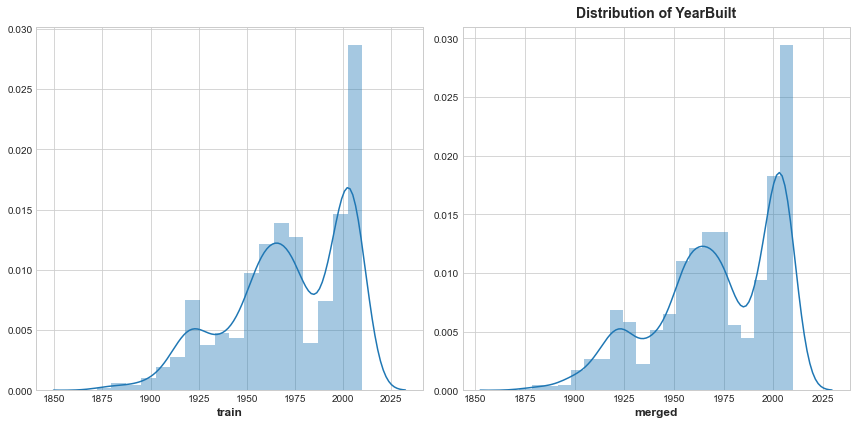

count    1460.000000
mean     1984.865753
std        20.645407
min      1950.000000
25%      1967.000000
50%      1994.000000
75%      2004.000000
max      2010.000000
Name: YearRemodAdd, dtype: float64


<Figure size 864x720 with 0 Axes>

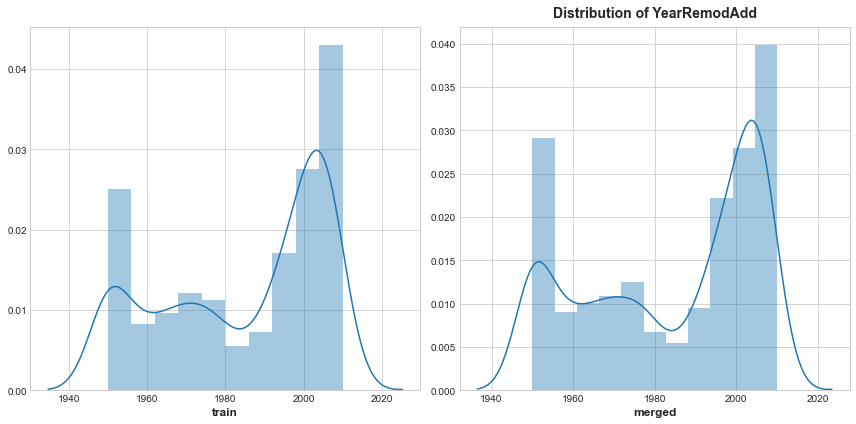

count    1452.000000
mean      103.685262
std       181.066207
min         0.000000
25%         0.000000
50%         0.000000
75%       166.000000
max      1600.000000
Name: MasVnrArea, dtype: float64


<Figure size 864x720 with 0 Axes>

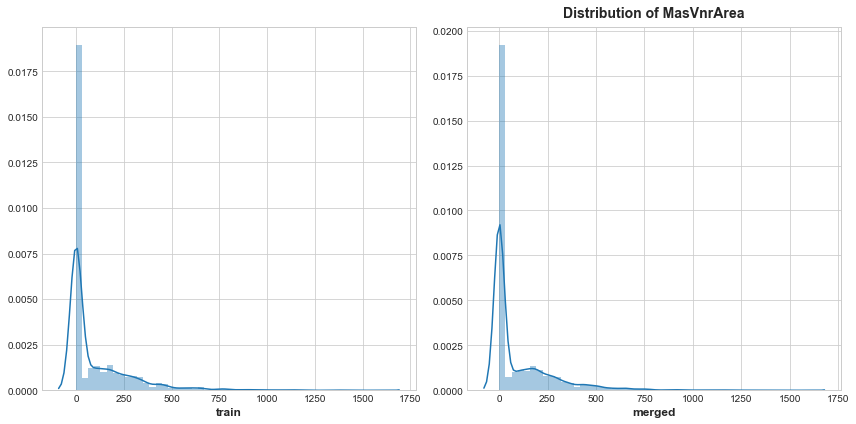

count    1460.000000
mean      443.639726
std       456.098091
min         0.000000
25%         0.000000
50%       383.500000
75%       712.250000
max      5644.000000
Name: BsmtFinSF1, dtype: float64


<Figure size 864x720 with 0 Axes>

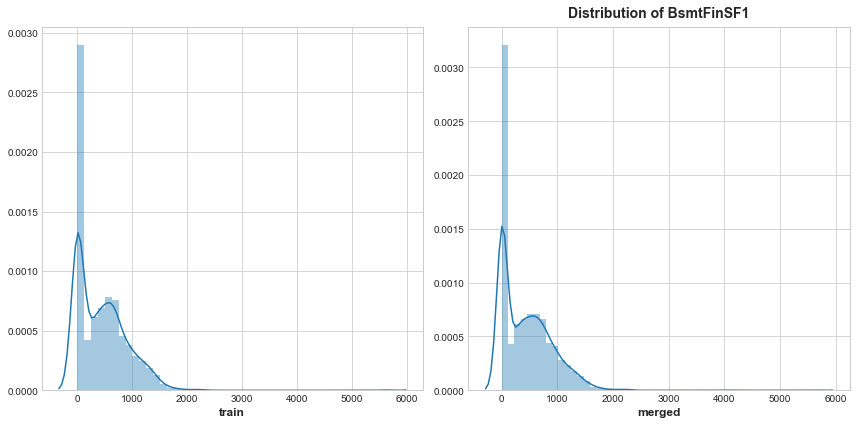

count    1460.000000
mean       46.549315
std       161.319273
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max      1474.000000
Name: BsmtFinSF2, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


<Figure size 864x720 with 0 Axes>

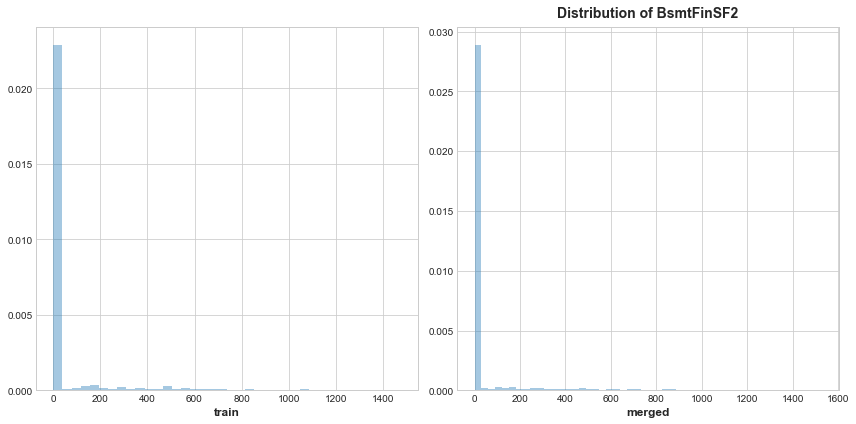

count    1460.000000
mean      567.240411
std       441.866955
min         0.000000
25%       223.000000
50%       477.500000
75%       808.000000
max      2336.000000
Name: BsmtUnfSF, dtype: float64


<Figure size 864x720 with 0 Axes>

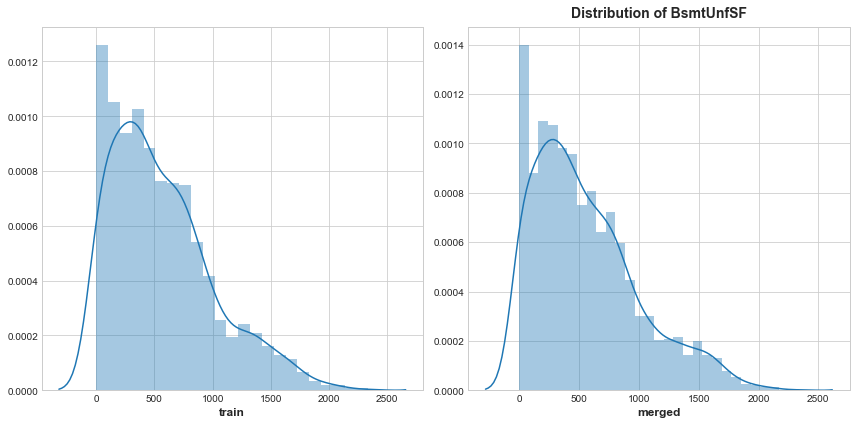

count    1460.000000
mean     1057.429452
std       438.705324
min         0.000000
25%       795.750000
50%       991.500000
75%      1298.250000
max      6110.000000
Name: TotalBsmtSF, dtype: float64


<Figure size 864x720 with 0 Axes>

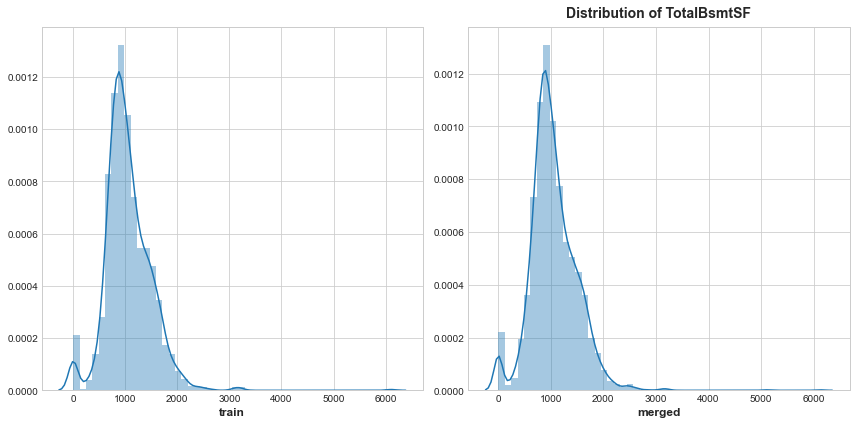

count    1460.000000
mean     1162.626712
std       386.587738
min       334.000000
25%       882.000000
50%      1087.000000
75%      1391.250000
max      4692.000000
Name: 1stFlrSF, dtype: float64


<Figure size 864x720 with 0 Axes>

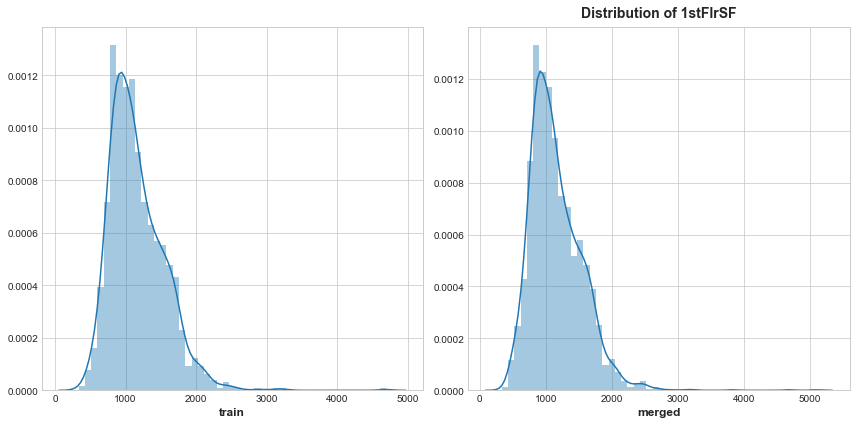

count    1460.000000
mean      346.992466
std       436.528436
min         0.000000
25%         0.000000
50%         0.000000
75%       728.000000
max      2065.000000
Name: 2ndFlrSF, dtype: float64


<Figure size 864x720 with 0 Axes>

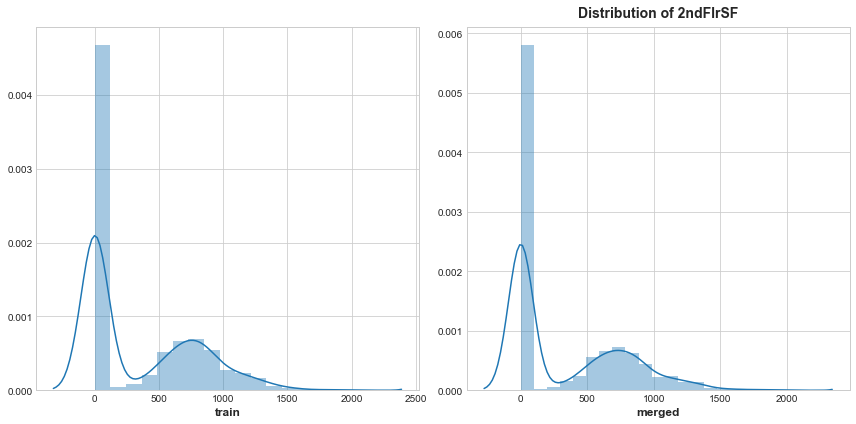

count    1460.000000
mean        5.844521
std        48.623081
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       572.000000
Name: LowQualFinSF, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


<Figure size 864x720 with 0 Axes>

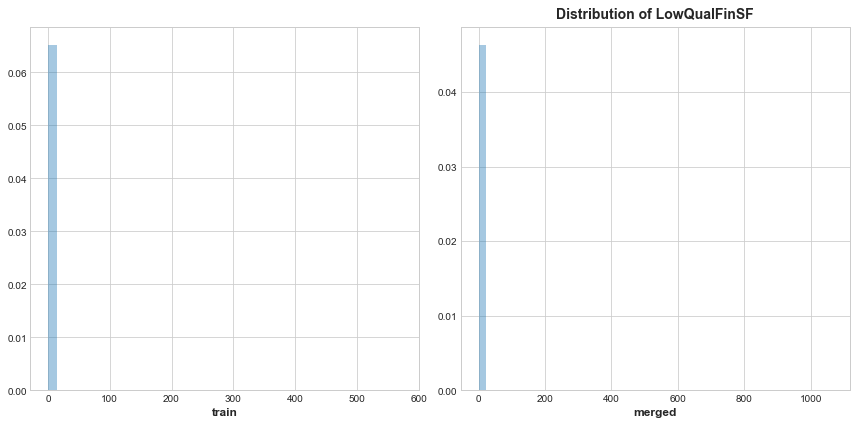

count    1460.000000
mean     1515.463699
std       525.480383
min       334.000000
25%      1129.500000
50%      1464.000000
75%      1776.750000
max      5642.000000
Name: GrLivArea, dtype: float64


<Figure size 864x720 with 0 Axes>

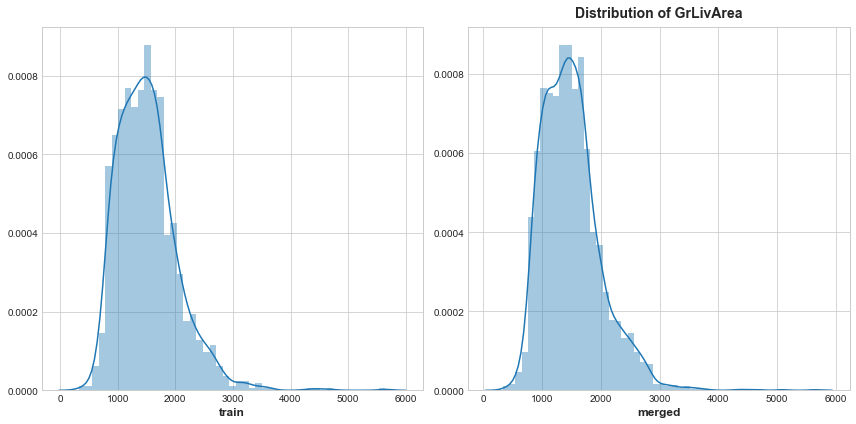

count    1460.000000
mean        0.057534
std         0.238753
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         2.000000
Name: BsmtHalfBath, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


<Figure size 864x720 with 0 Axes>

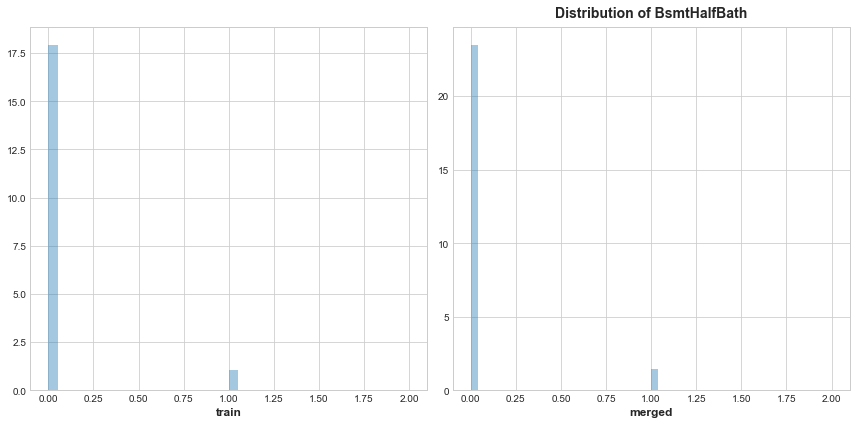

count    1379.000000
mean     1978.506164
std        24.689725
min      1900.000000
25%      1961.000000
50%      1980.000000
75%      2002.000000
max      2010.000000
Name: GarageYrBlt, dtype: float64


<Figure size 864x720 with 0 Axes>

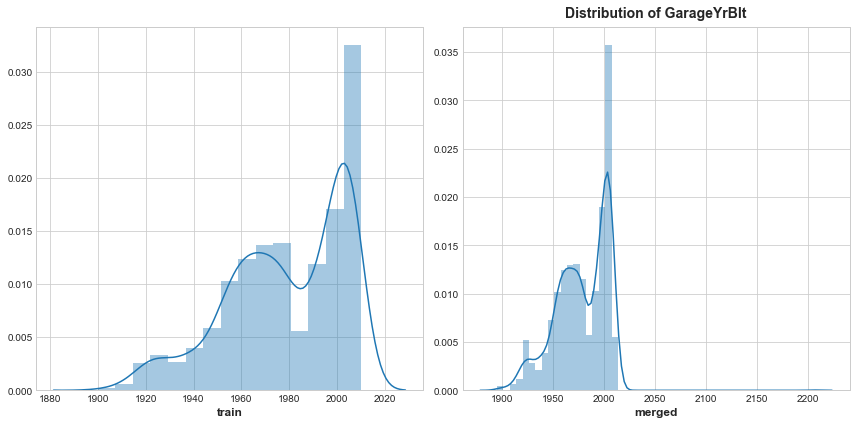

count    1460.000000
mean      472.980137
std       213.804841
min         0.000000
25%       334.500000
50%       480.000000
75%       576.000000
max      1418.000000
Name: GarageArea, dtype: float64


<Figure size 864x720 with 0 Axes>

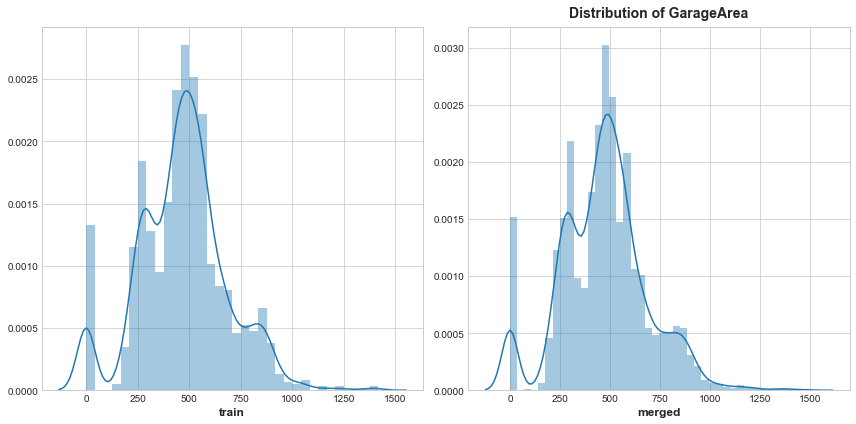

count    1460.000000
mean       94.244521
std       125.338794
min         0.000000
25%         0.000000
50%         0.000000
75%       168.000000
max       857.000000
Name: WoodDeckSF, dtype: float64


<Figure size 864x720 with 0 Axes>

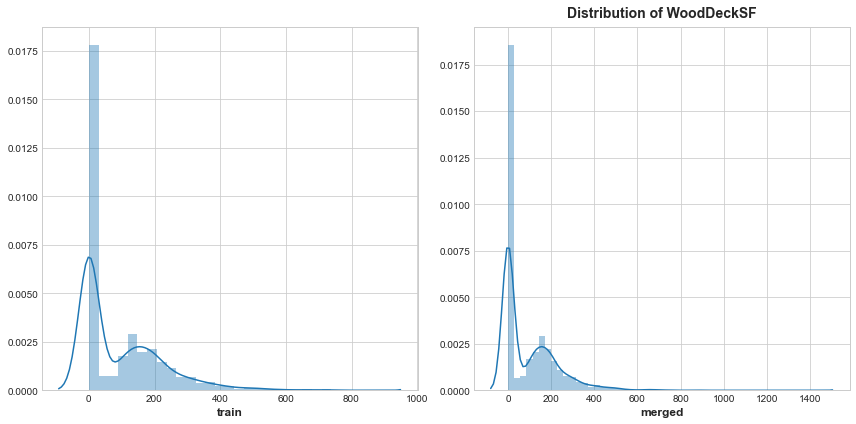

count    1460.000000
mean       46.660274
std        66.256028
min         0.000000
25%         0.000000
50%        25.000000
75%        68.000000
max       547.000000
Name: OpenPorchSF, dtype: float64


<Figure size 864x720 with 0 Axes>

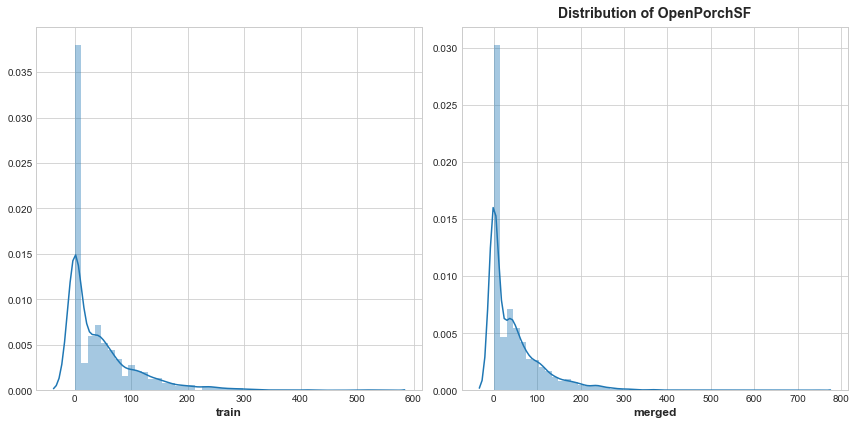

count    1460.000000
mean       21.954110
std        61.119149
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       552.000000
Name: EnclosedPorch, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


<Figure size 864x720 with 0 Axes>

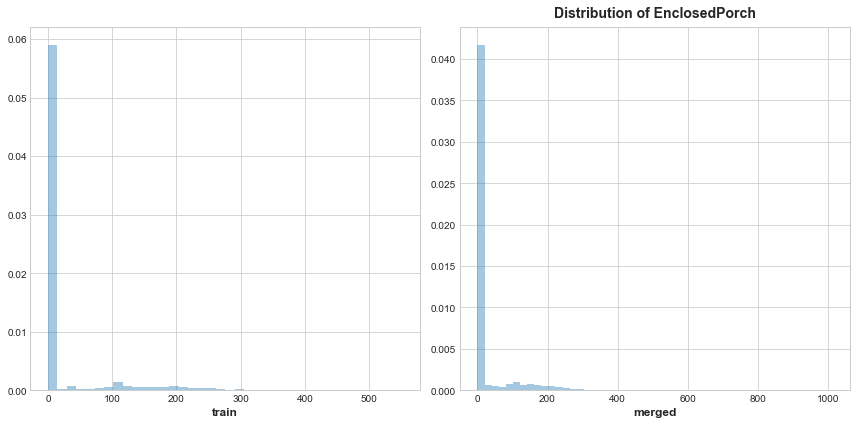

count    1460.000000
mean        3.409589
std        29.317331
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       508.000000
Name: 3SsnPorch, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


<Figure size 864x720 with 0 Axes>

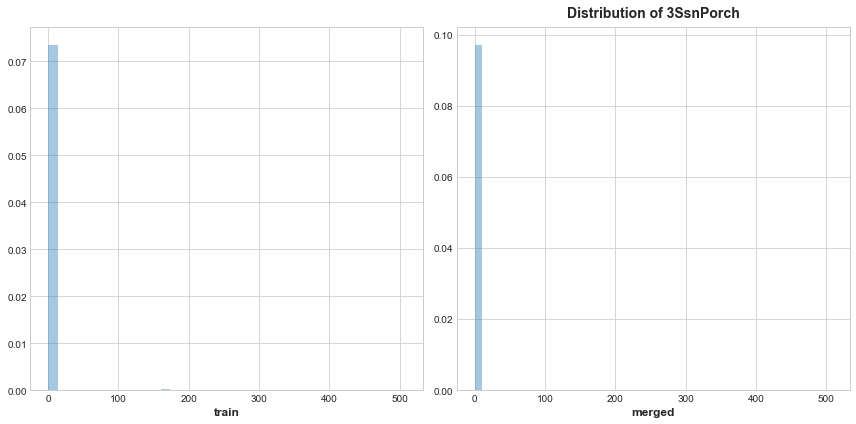

count    1460.000000
mean       15.060959
std        55.757415
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       480.000000
Name: ScreenPorch, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


<Figure size 864x720 with 0 Axes>

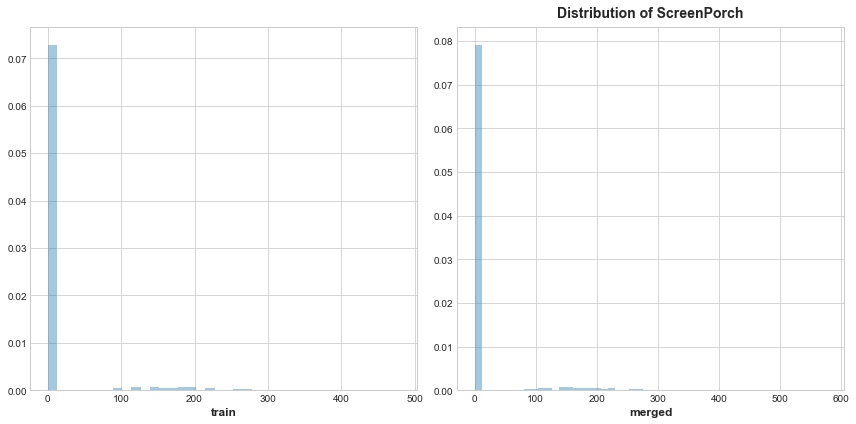

count    1460.000000
mean        2.758904
std        40.177307
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       738.000000
Name: PoolArea, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


<Figure size 864x720 with 0 Axes>

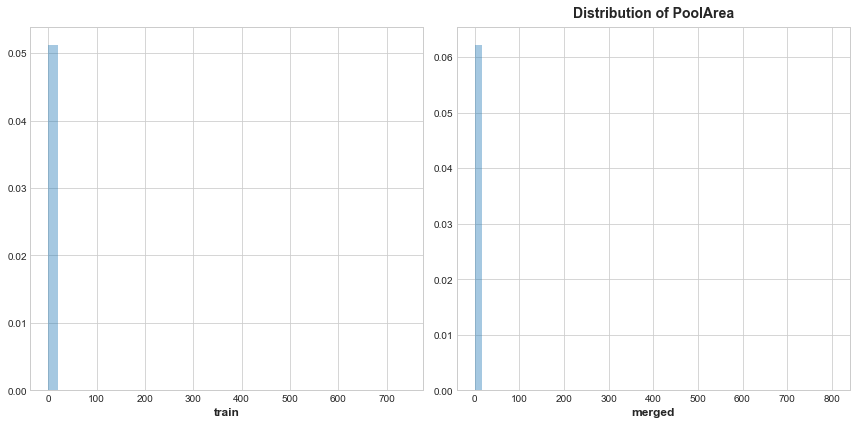

count     1460.000000
mean        43.489041
std        496.123024
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max      15500.000000
Name: MiscVal, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


<Figure size 864x720 with 0 Axes>

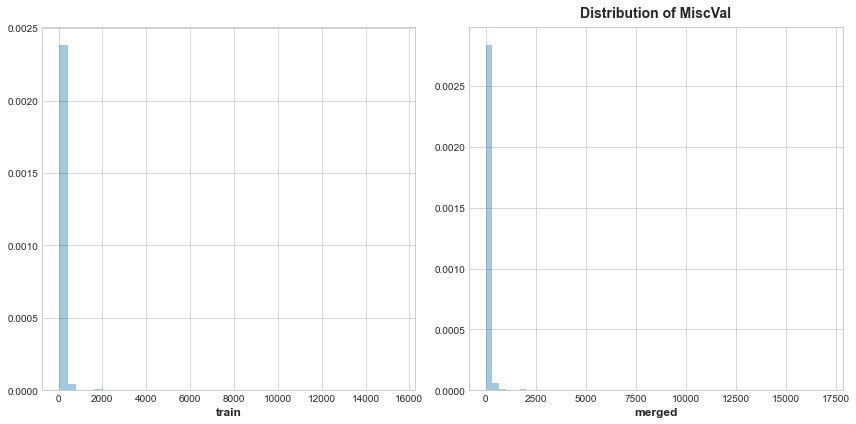

In [159]:
continous = nums_train.drop(num_cat)
numeric_distribution_plot(df=train[continous],merged=merged[continous])

In [26]:
def numeric_log_distribution_plot(df,merged):
    """
     Description : Plot countplot for all categorical features 
    present in the dataframe passed
    
    Argument : Dataframe
    """
    nums_train = df.select_dtypes(exclude='object').columns
    for col in nums_train:
        print(df[col].describe())
        plt.rc("figure",figsize=(20,10))
        fig,axes = plt.subplots(1,2)
        plt.title("Distribution of "+col)
        sns.distplot(df[col].dropna(),ax=axes[0],axlabel='train',fit=scipy.stats.norm)
        sns.distplot(np.log1p(df[col].dropna()),ax=axes[1],axlabel='logged',fit=scipy.stats.norm)
        #sns.distplot(boxcox1p(df[col].dropna(), boxcox_normmax(df[col].dropna() + 1)),ax=axes[1],axlabel='boxcox',fit=scipy.stats.norm)
        #boxcox1p(features[i], boxcox_normmax(features[i] + 1))
        plt.tight_layout()
        plt.show()

count    1460.000000
mean      730.500000
std       421.610009
min         1.000000
25%       365.750000
50%       730.500000
75%      1095.250000
max      1460.000000
Name: Id, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


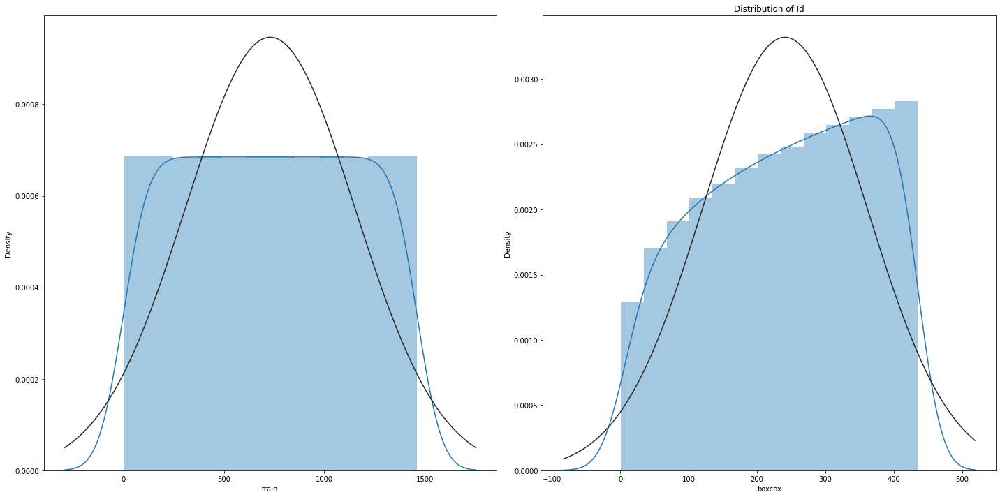

count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


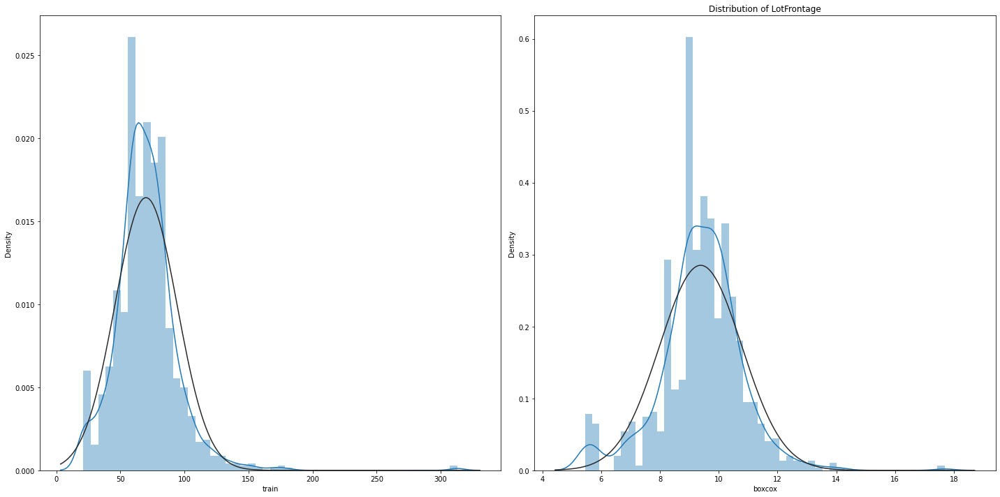

count      1460.000000
mean      10516.828082
std        9981.264932
min        1300.000000
25%        7553.500000
50%        9478.500000
75%       11601.500000
max      215245.000000
Name: LotArea, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_stats_py.py:4098: PearsonRNearConstantInputWarning: An input array is nearly constant; the computed correlation coefficient may be inaccurate.
  warnings.warn(PearsonRNearConstantInputWarning())
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Plea

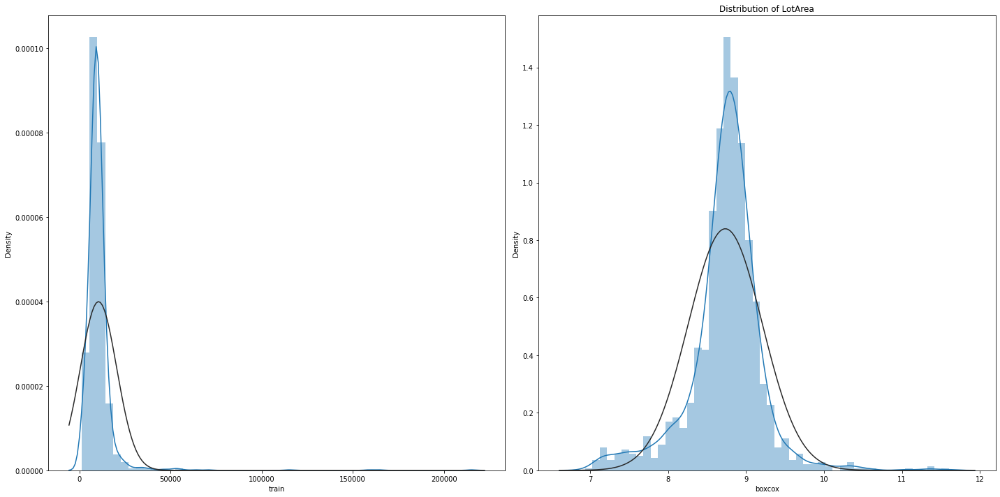

count    1460.000000
mean     1971.267808
std        30.202904
min      1872.000000
25%      1954.000000
50%      1973.000000
75%      2000.000000
max      2010.000000
Name: YearBuilt, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


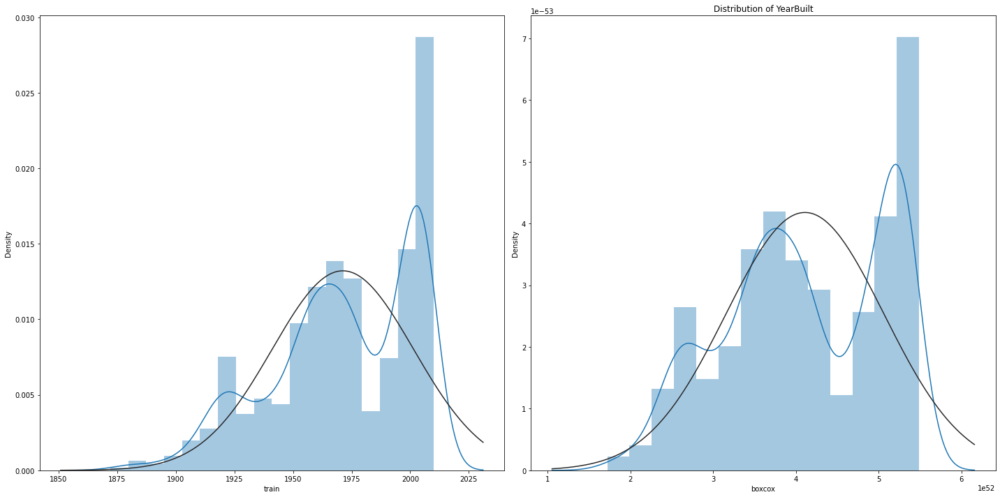

count    1460.000000
mean     1984.865753
std        20.645407
min      1950.000000
25%      1967.000000
50%      1994.000000
75%      2004.000000
max      2010.000000
Name: YearRemodAdd, dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


ValueError: array must not contain infs or NaNs

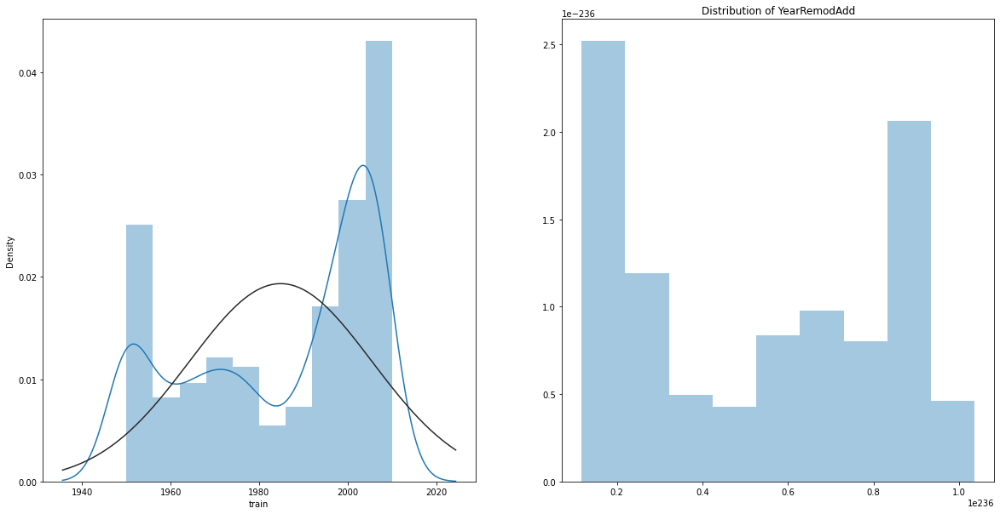

In [25]:
continous = nums_train.drop(num_cat)
numeric_log_distribution_plot(df=train[continous],merged=merged[continous])

In [144]:
#def plot_lim_and_reg_plot():
def plot_lim_and_reg_plot(df,cols,target_col,fill_na):
    df_def = df.copy()
    df_def = df_def.fillna(fill_na)
    def make_log(df_def,drop_target=False):
        df_log = df.copy()
        num_cols = df_log.select_dtypes(exclude='object').columns
        if drop_target == True:
            num_cols = num_cols.drop(target_col)
        numeric = df_log.select_dtypes(exclude='object')
        for col in num_cols:
            numeric[col] = np.log(numeric[col]+1)
        return numeric 
    logged = make_log(df_def)
    for col in cols:
        print(col)
        plt.subplot(1, 2, 1)
        #the figure has 1 rows, 2 columns, and this plot is the first plot.
        #sns.relplot(x=col, y="SalePrice", data=df_def)
        sns.scatterplot(x=col, y="SalePrice", data=df_def)
        plt.title("Normal train Scatter")
        
        plt.subplot(1, 2, 2)
        sns.scatterplot(x=col, y="SalePrice", data=logged)
        plt.title("logged train Scatter")
        plt.tight_layout()
        
        #plt.subplot(2, 2, 3)
        sns.lmplot(x=col, y="SalePrice", data=df_def)
        plt.title(" train lmplot")
        
        #plt.subplot(2, 2, 4)
        sns.lmplot(x=col, y="SalePrice", data=logged)
        plt.title("logged lmplot")
       
        plt.tight_layout()
        plt.show()
        print()
        print()
        

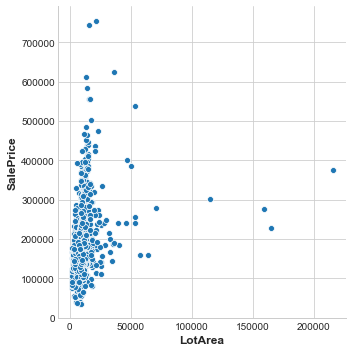

In [114]:
sns.relplot(x='LotArea', y="SalePrice", data=train)
#sns.scatterplot(x='LotArea', y="SalePrice", data=train)

In [107]:
continous.to_list()

['Id',
 'LotFrontage',
 'LotArea',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtHalfBath',
 'GarageYrBlt',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'SalePrice']

<ipython-input-142-68d41e7e513c>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  numeric[col] = np.log(numeric[col]+1)


Id


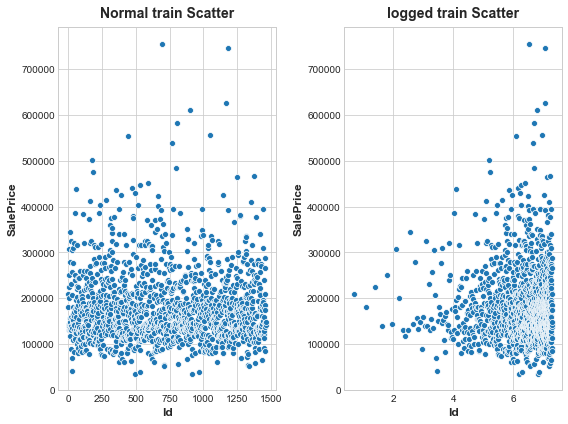

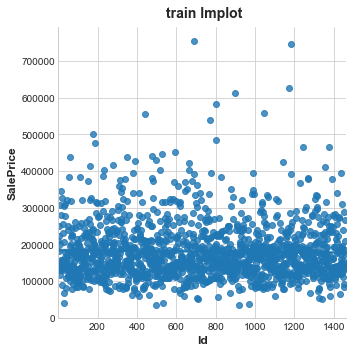

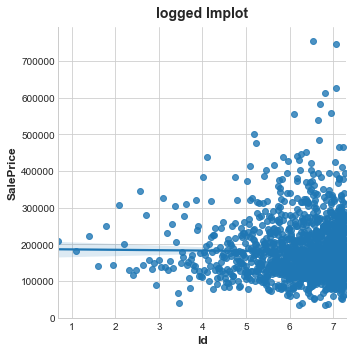



LotFrontage


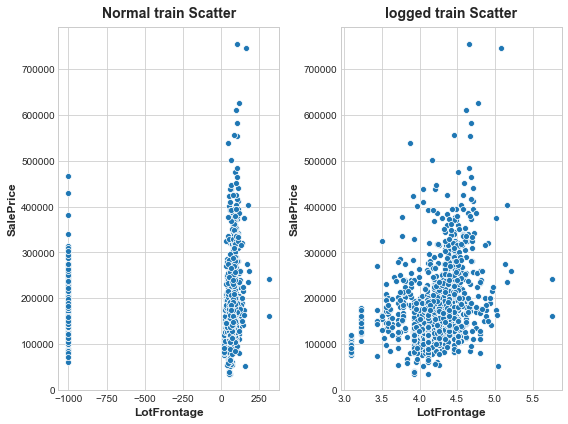

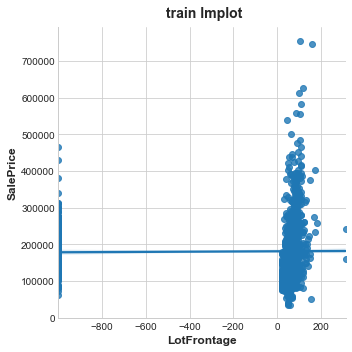

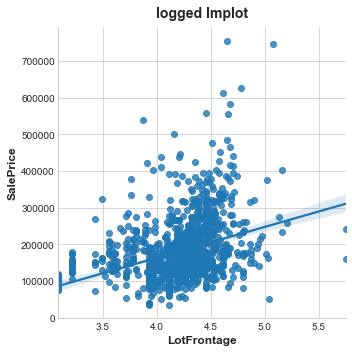



LotArea


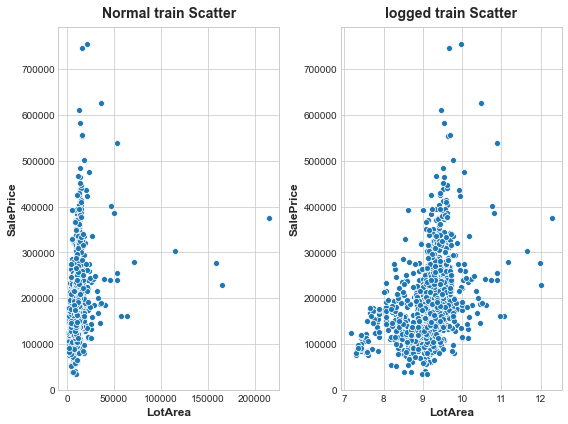

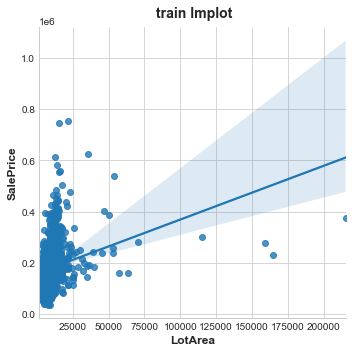

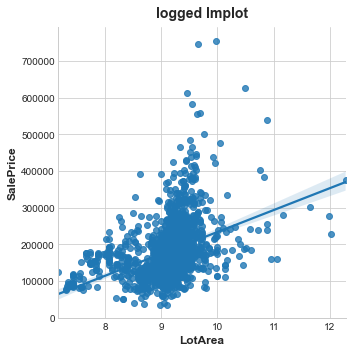



YearBuilt


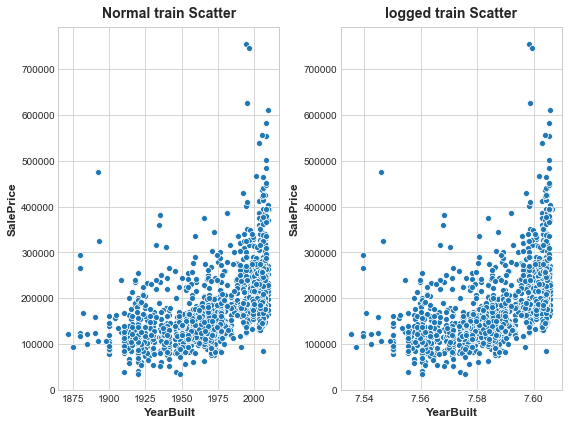

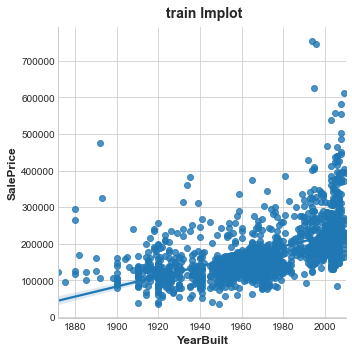

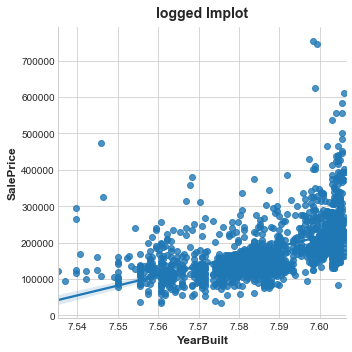



YearRemodAdd


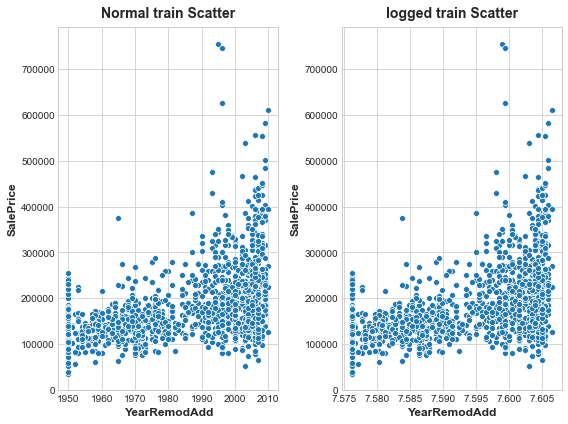

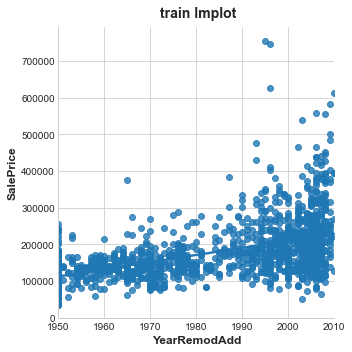

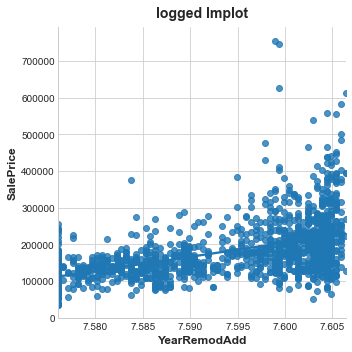



MasVnrArea


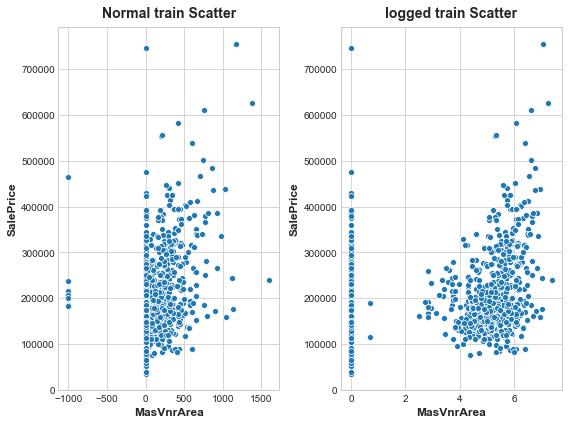

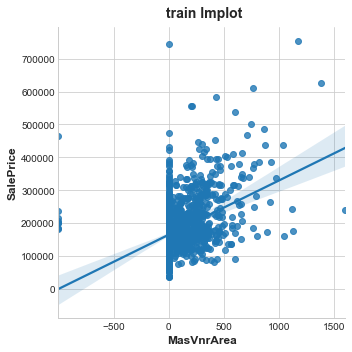

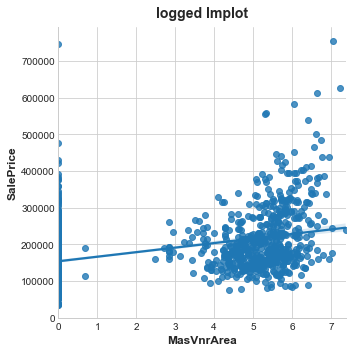



BsmtFinSF1


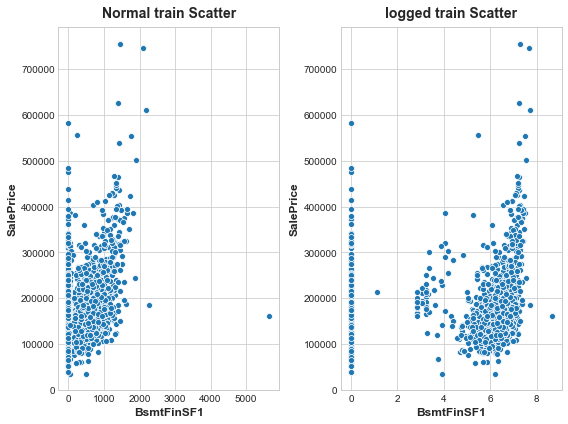

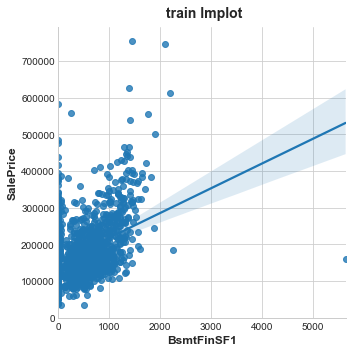

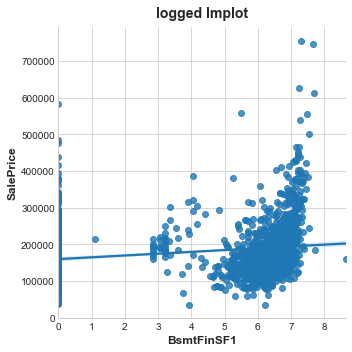



BsmtFinSF2


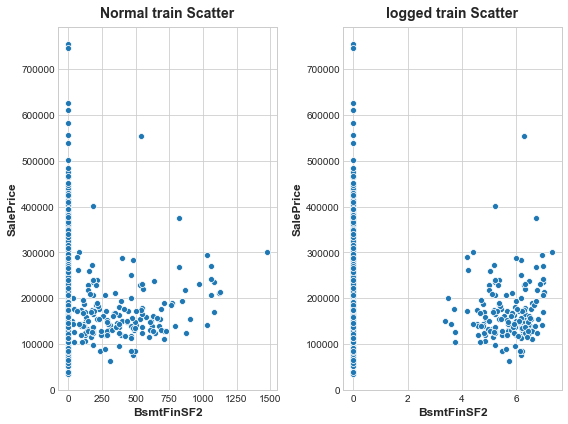

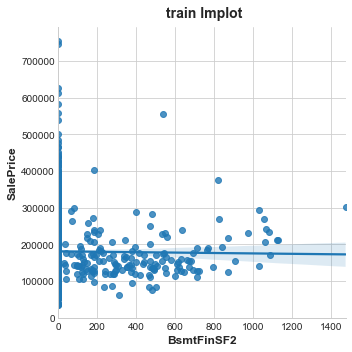

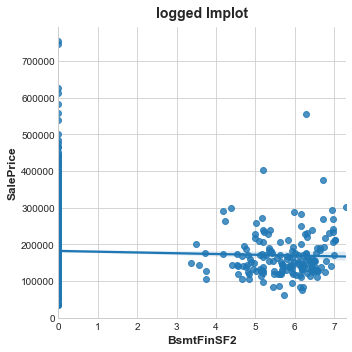



BsmtUnfSF


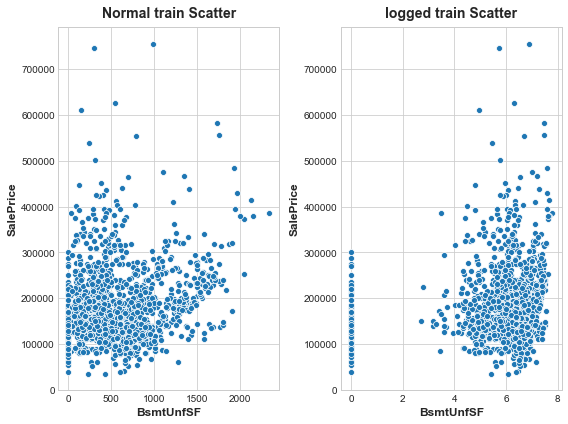

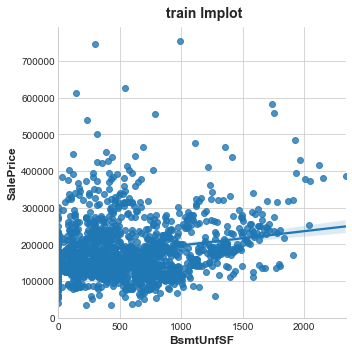

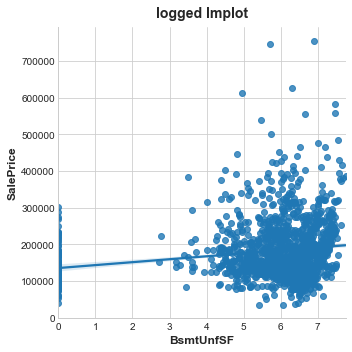



TotalBsmtSF


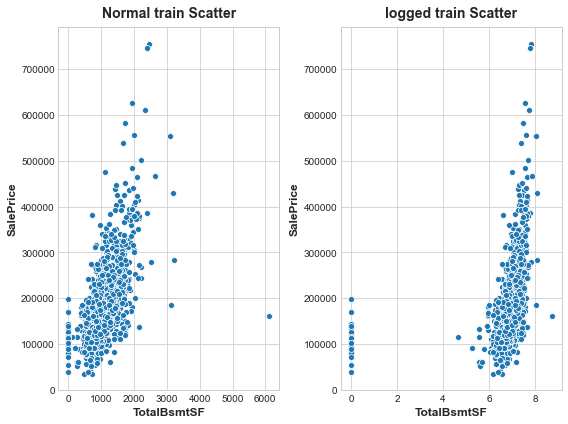

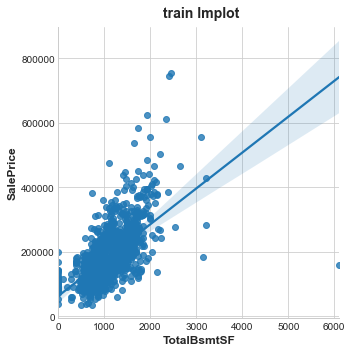

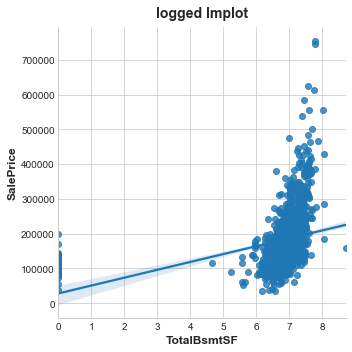



1stFlrSF


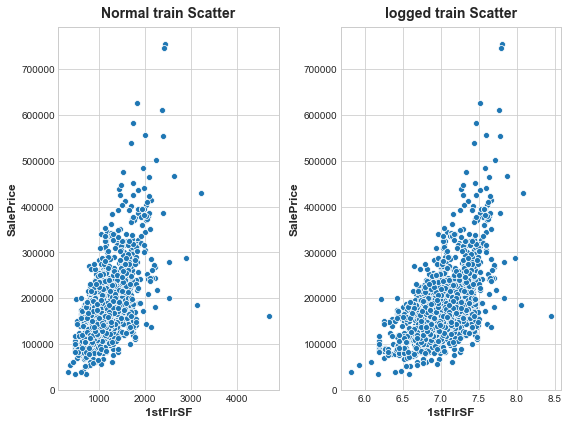

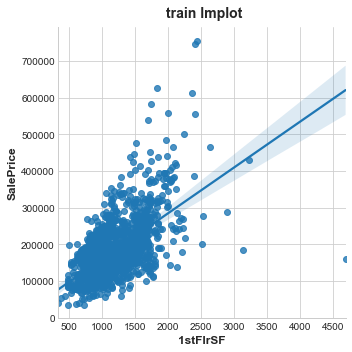

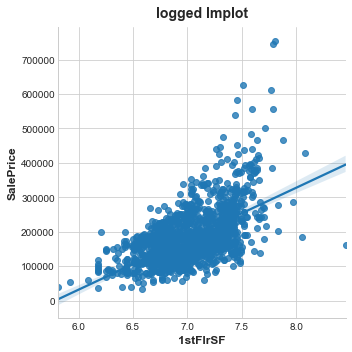



2ndFlrSF


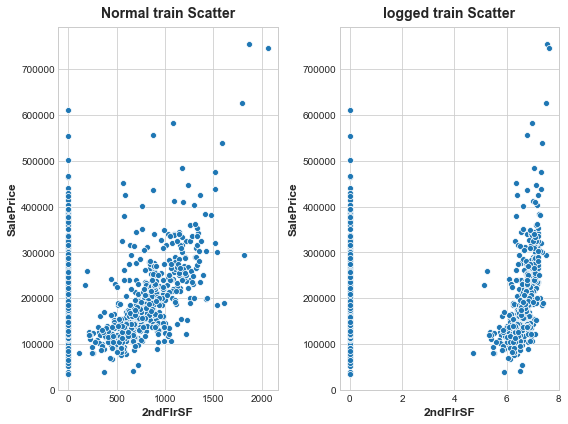

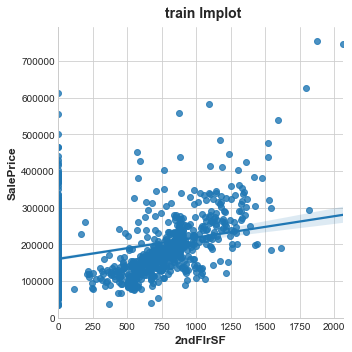

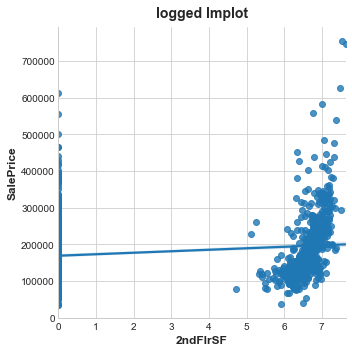



LowQualFinSF


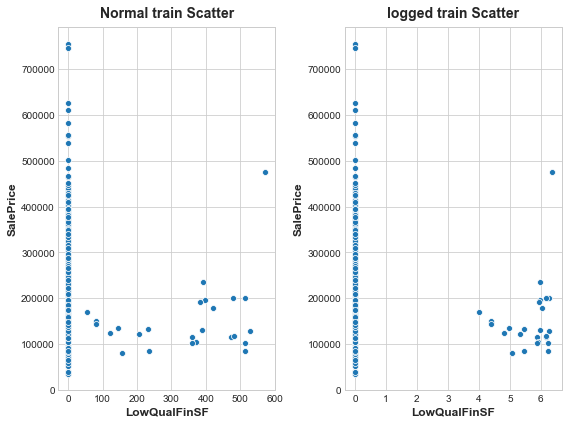

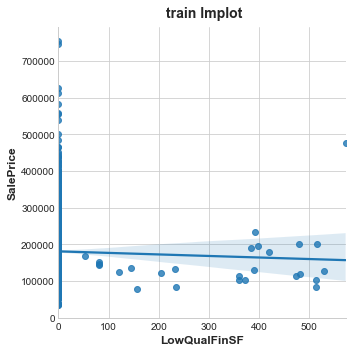

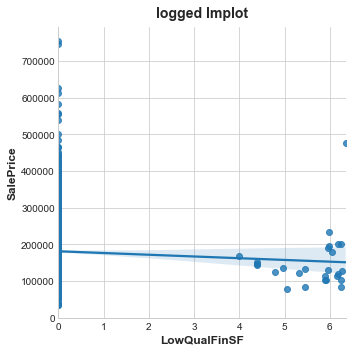



GrLivArea


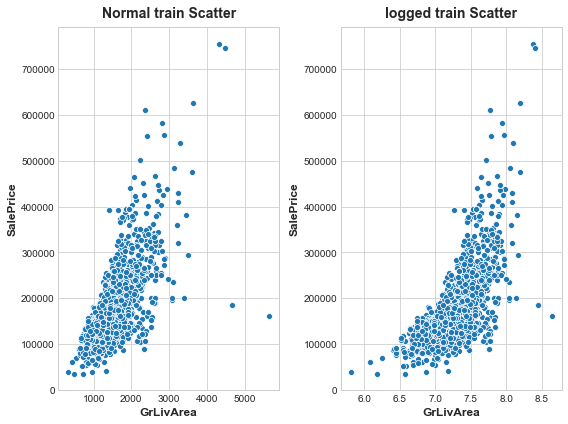

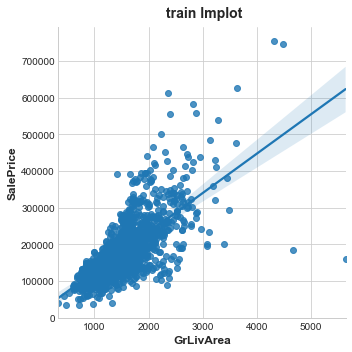

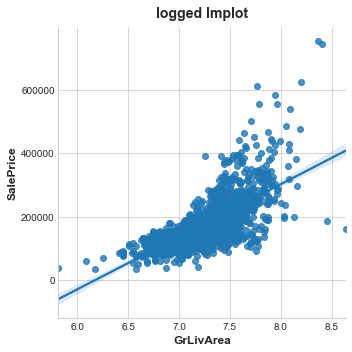



BsmtHalfBath


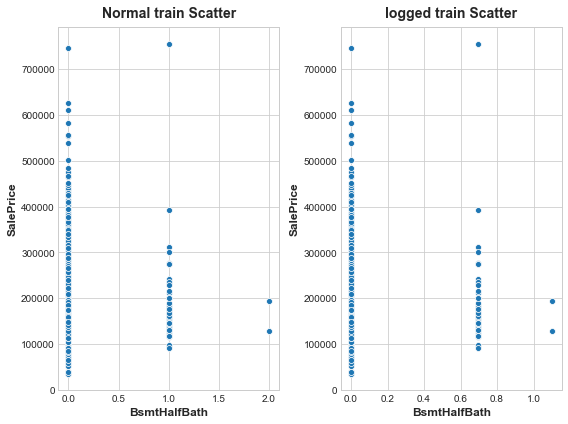

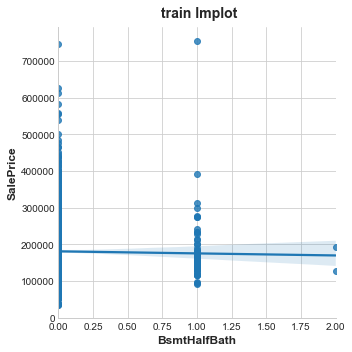

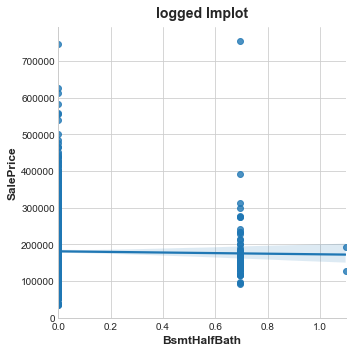



GarageYrBlt


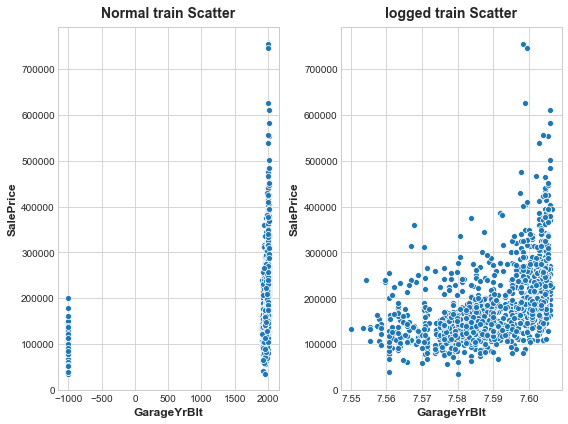

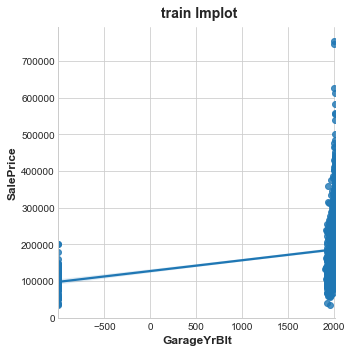

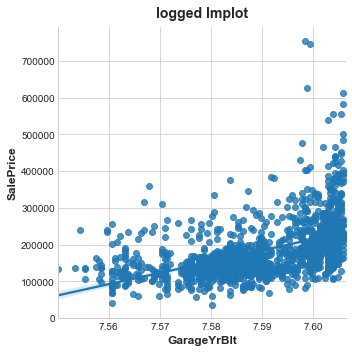



GarageArea


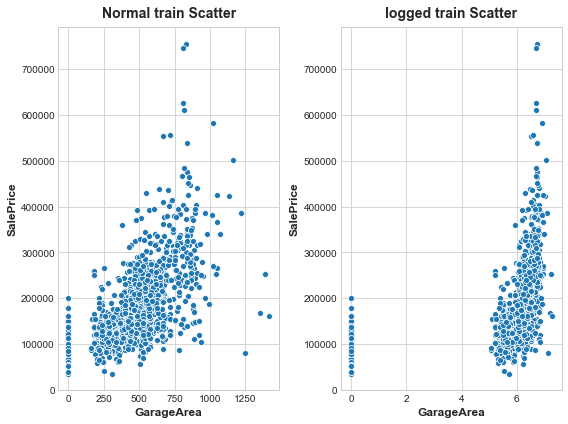

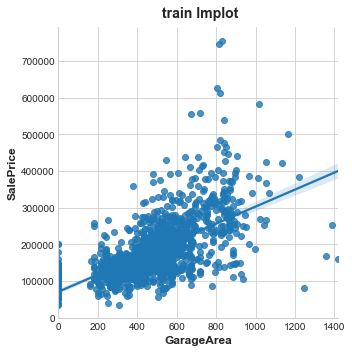

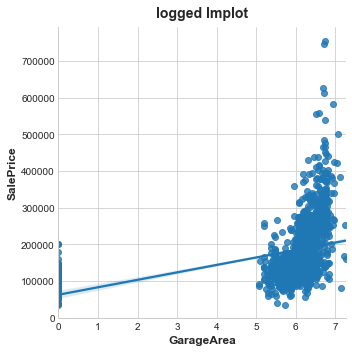



WoodDeckSF


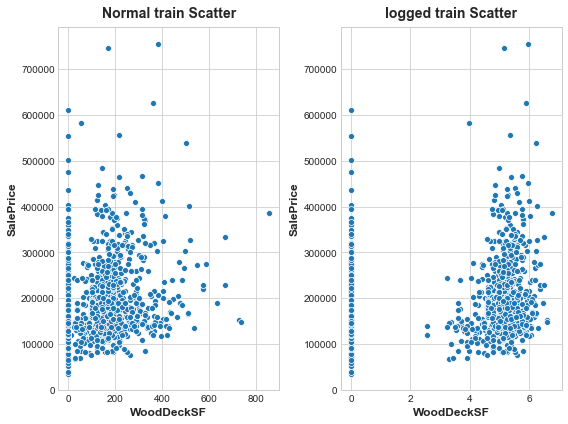

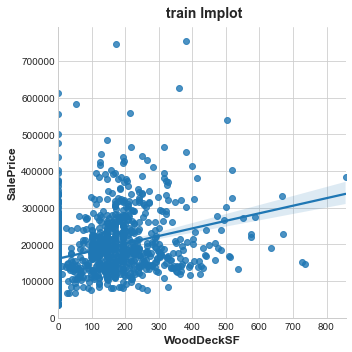

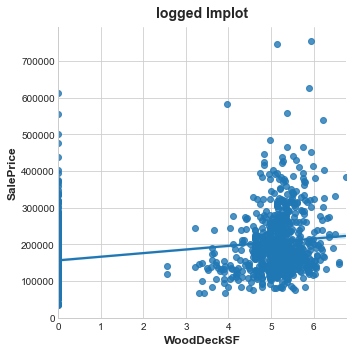



OpenPorchSF


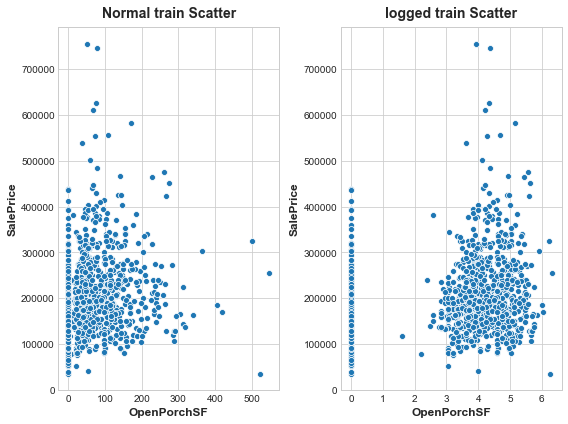

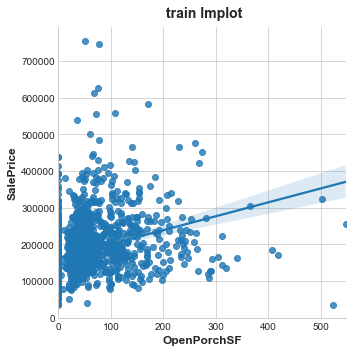

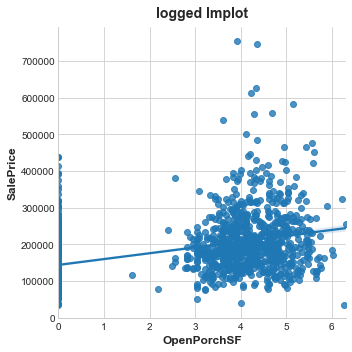



EnclosedPorch


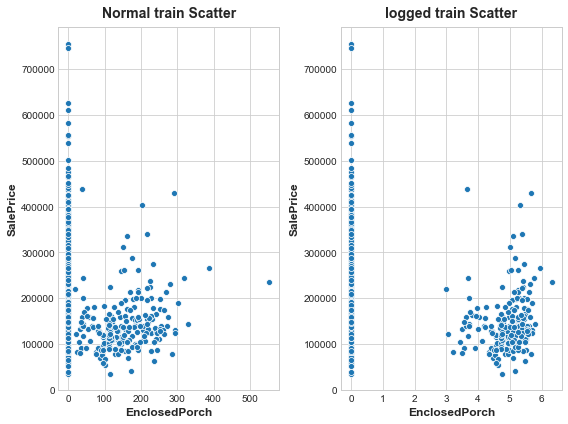

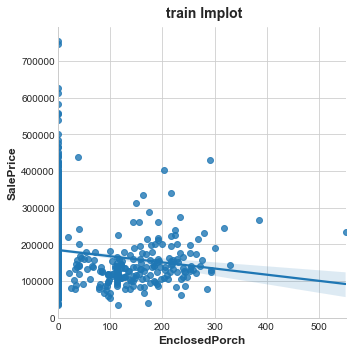

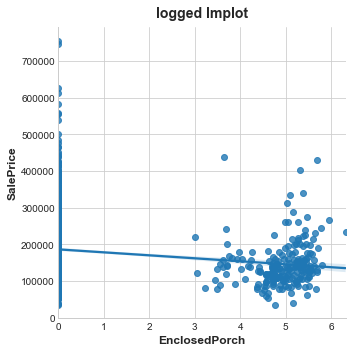



3SsnPorch


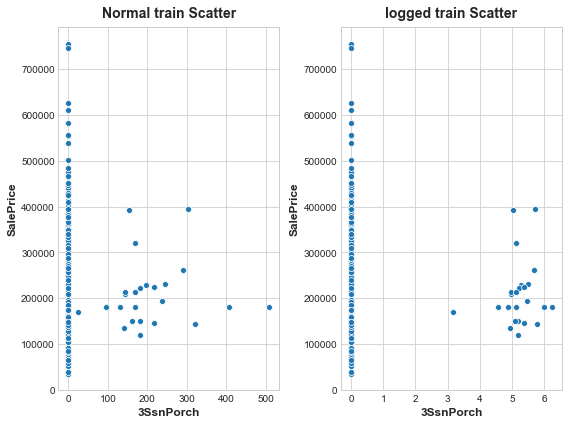

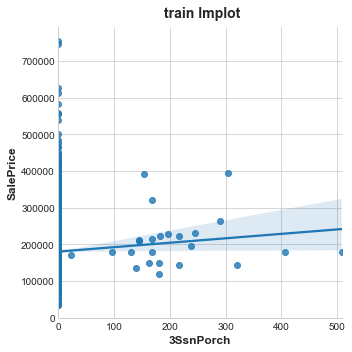

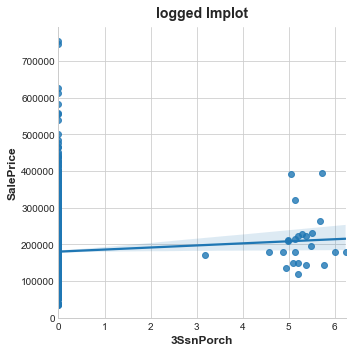



ScreenPorch


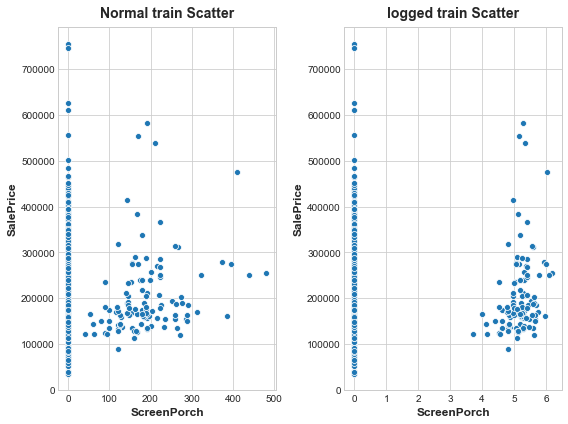

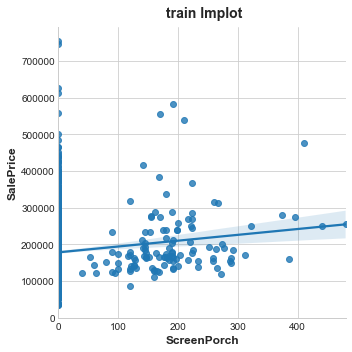

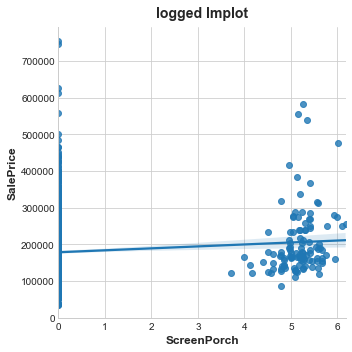



PoolArea


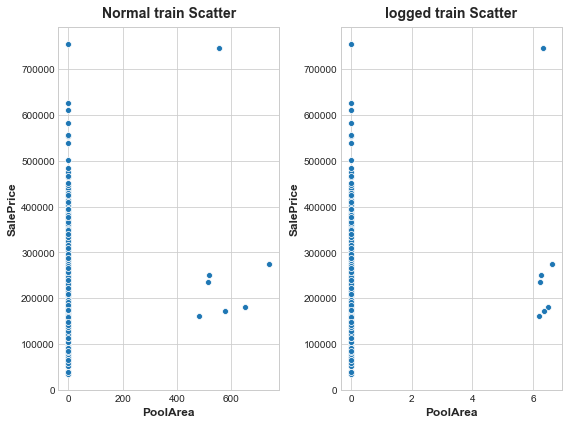

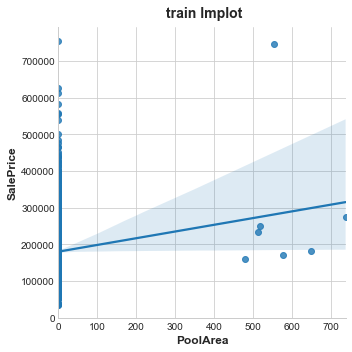

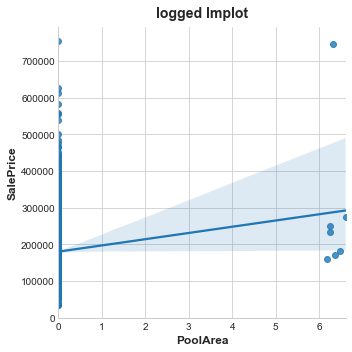



MiscVal


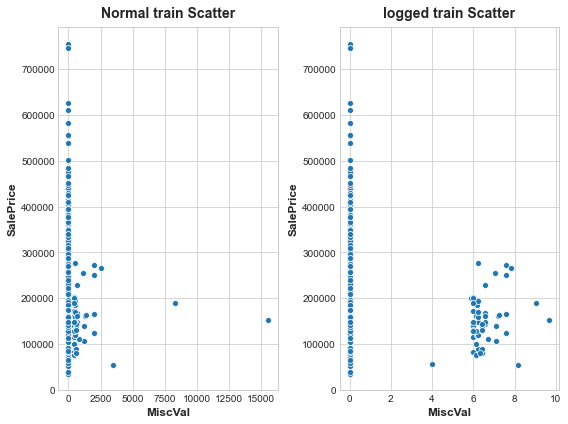

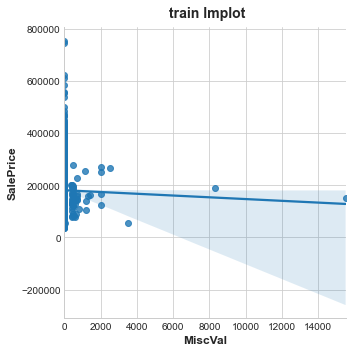

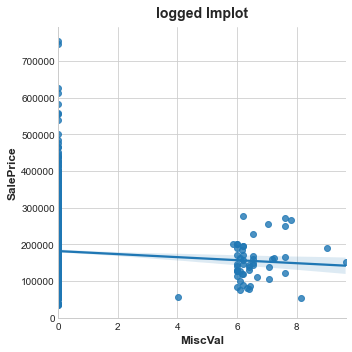



SalePrice


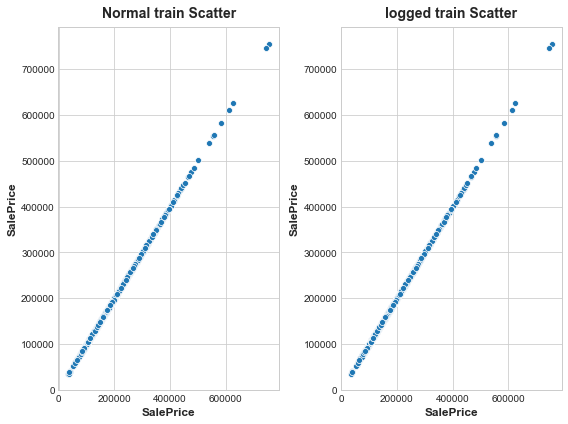

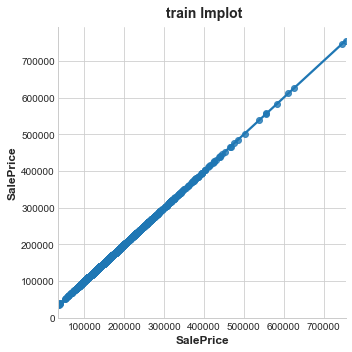

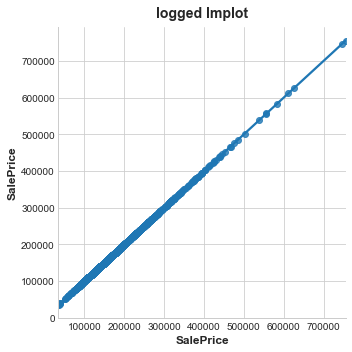

In [143]:
plot_lim_and_reg_plot(df=train,cols=continous.to_list(),target_col='SalePrice',fill_na=-999)

<ipython-input-144-cdb6d4a3a233>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  numeric[col] = np.log(numeric[col]+1)


Id


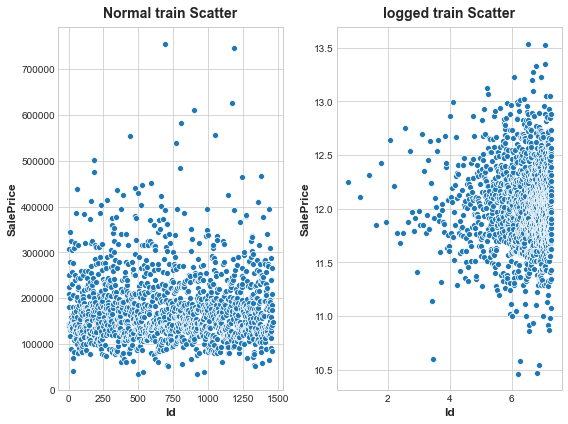

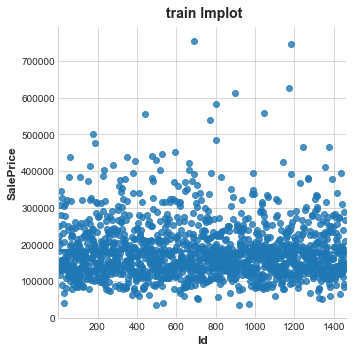

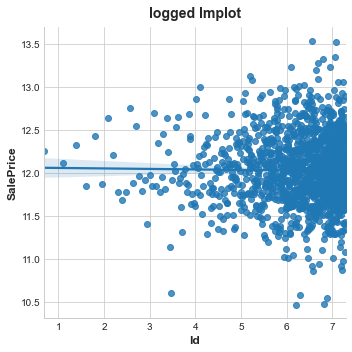



LotFrontage


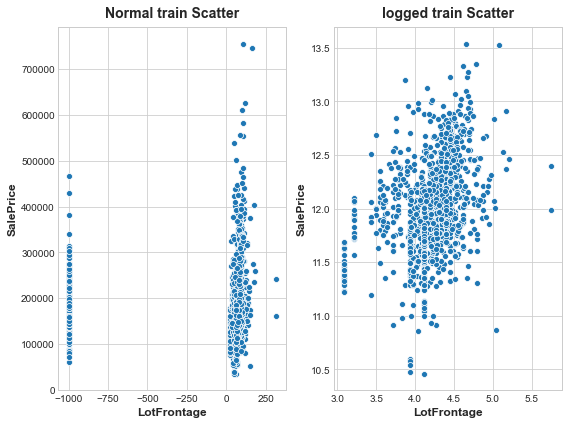

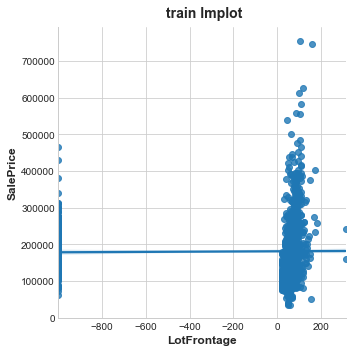

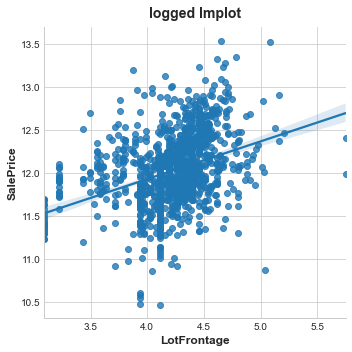



LotArea


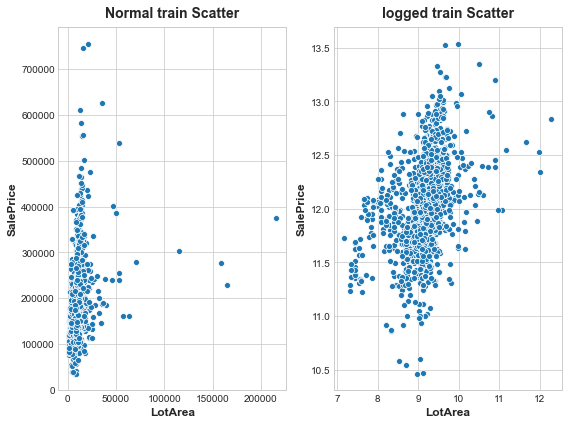

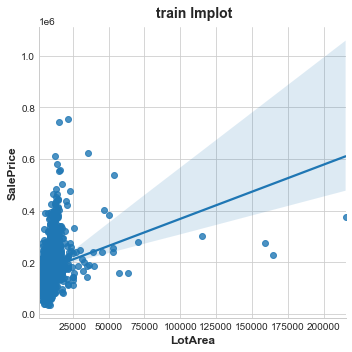

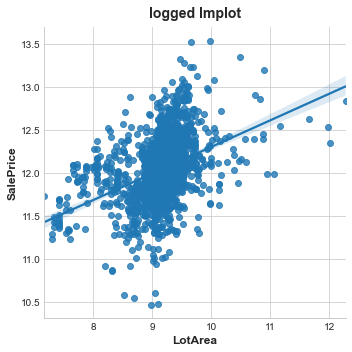



YearBuilt


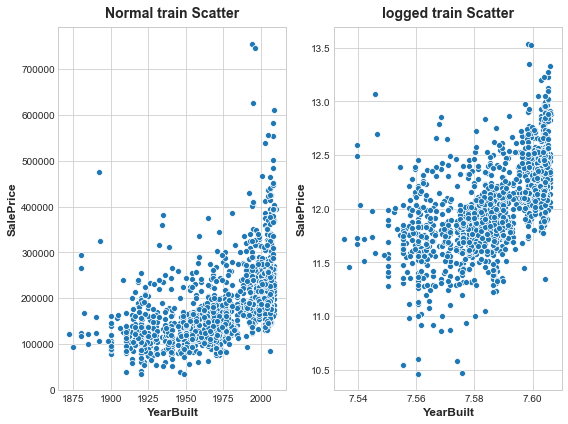

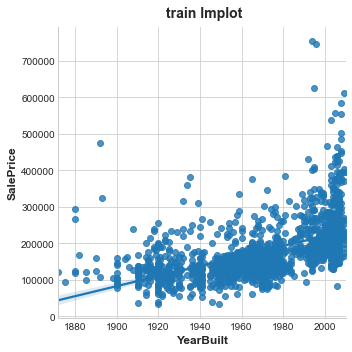

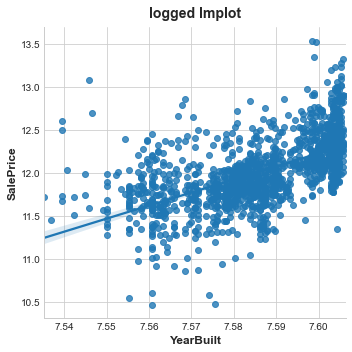



YearRemodAdd


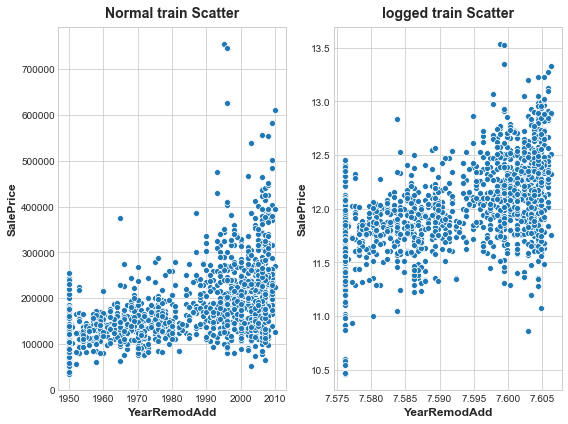

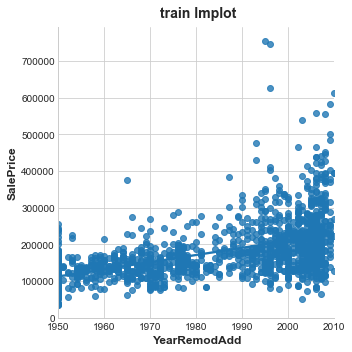

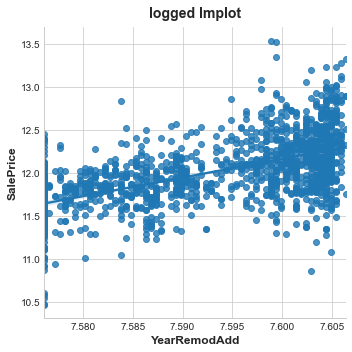



MasVnrArea


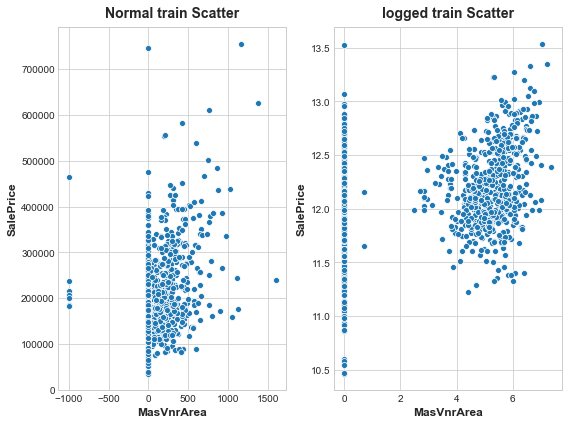

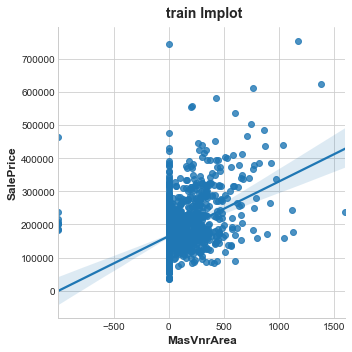

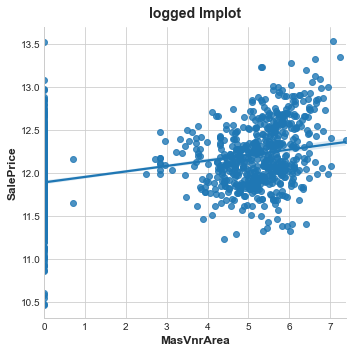



BsmtFinSF1


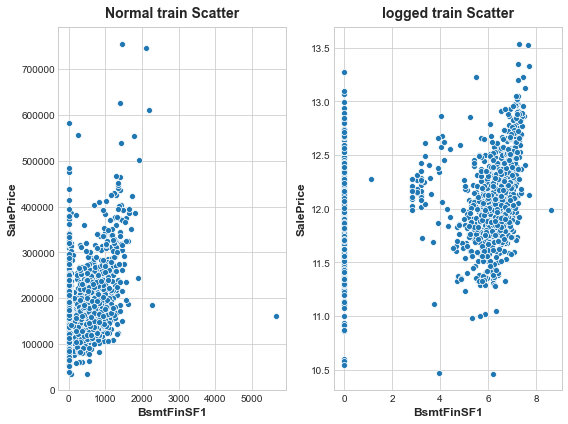

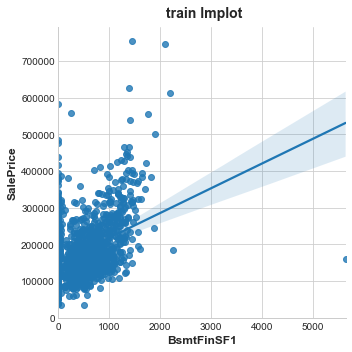

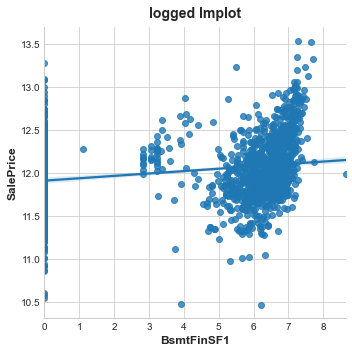



BsmtFinSF2


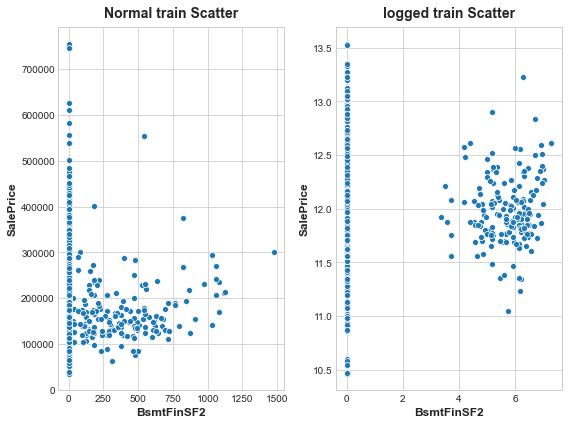

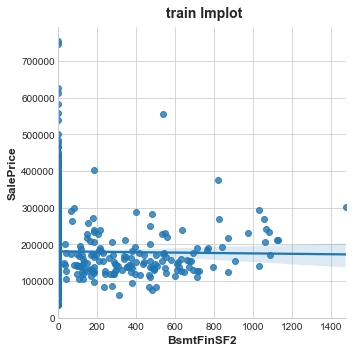

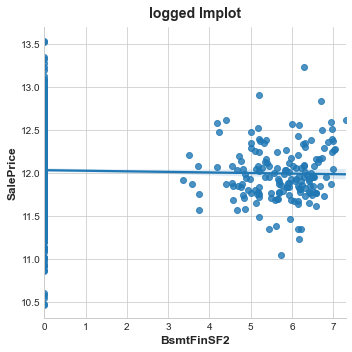



BsmtUnfSF


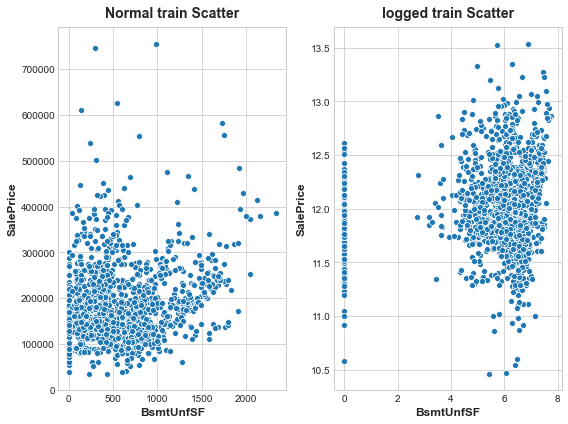

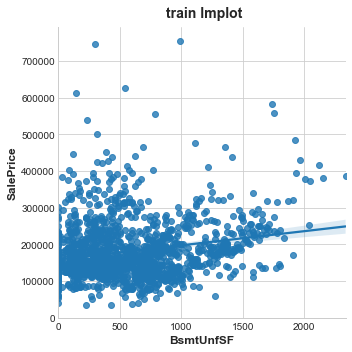

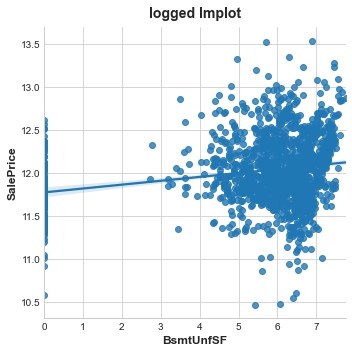



TotalBsmtSF


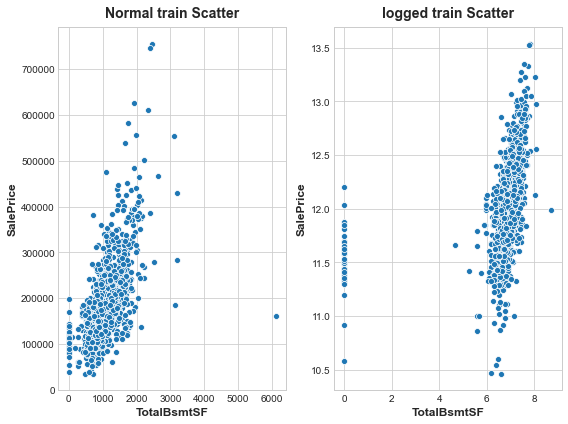

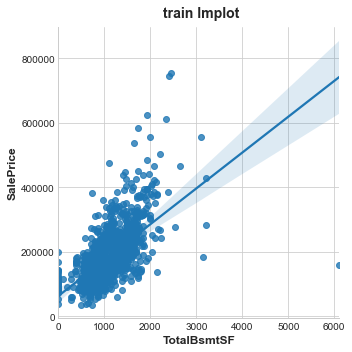

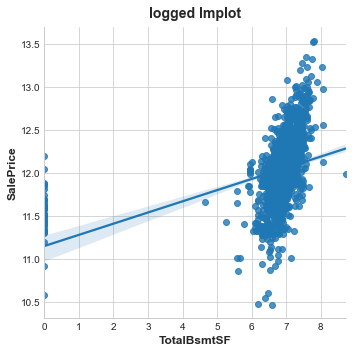



1stFlrSF


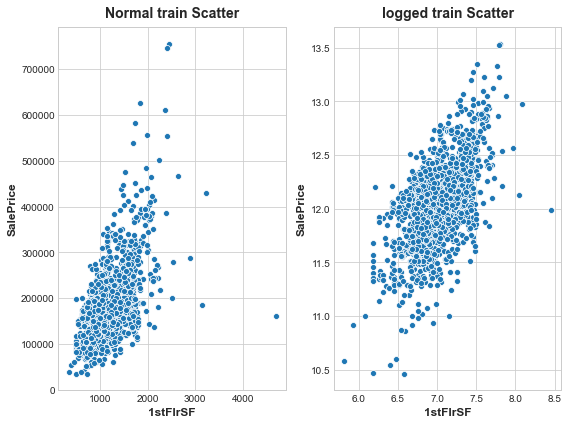

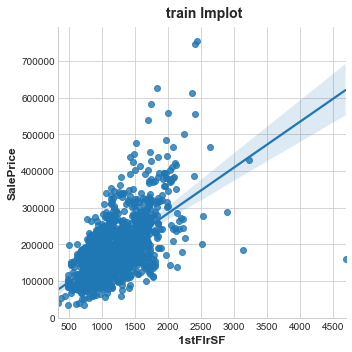

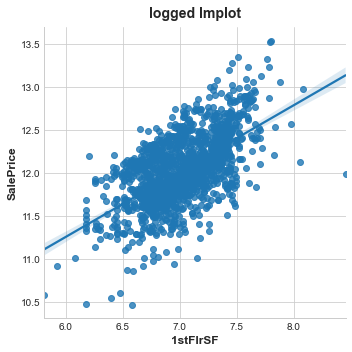



2ndFlrSF


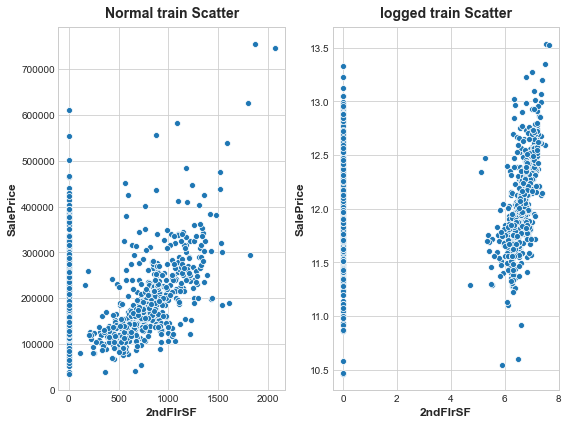

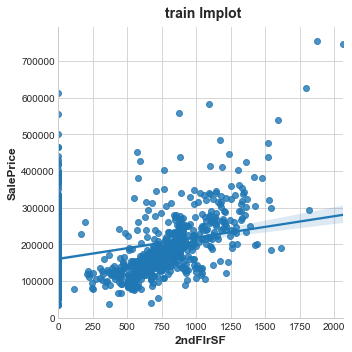

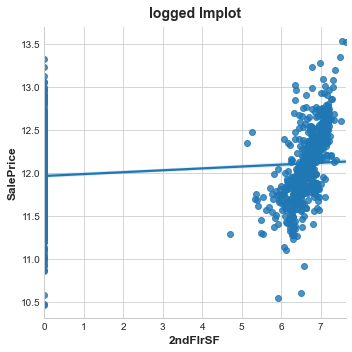



LowQualFinSF


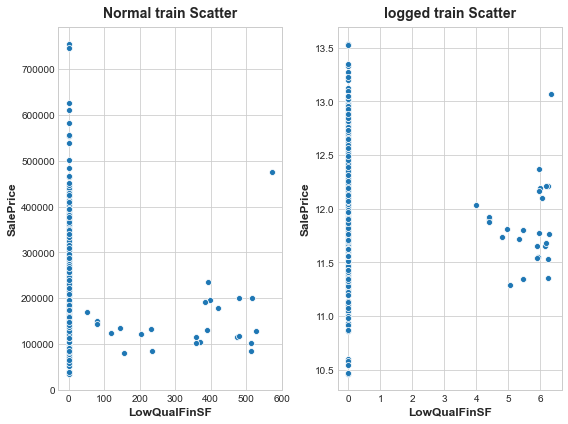

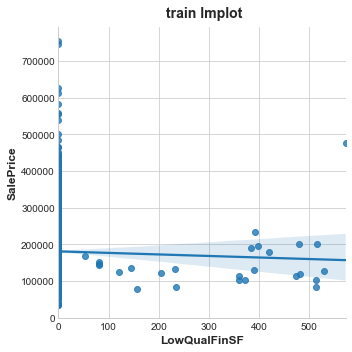

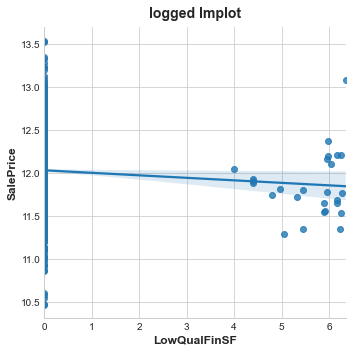



GrLivArea


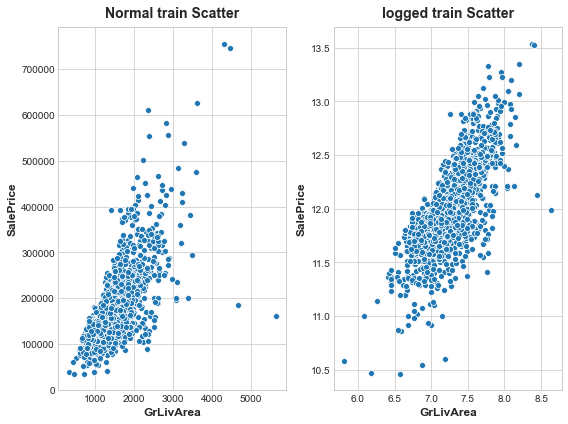

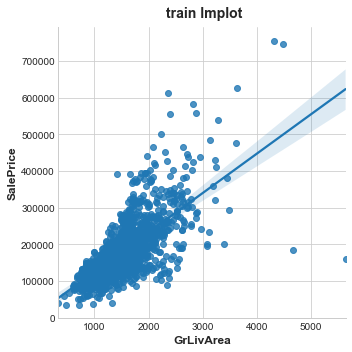

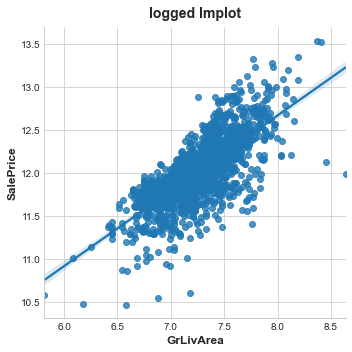



BsmtHalfBath


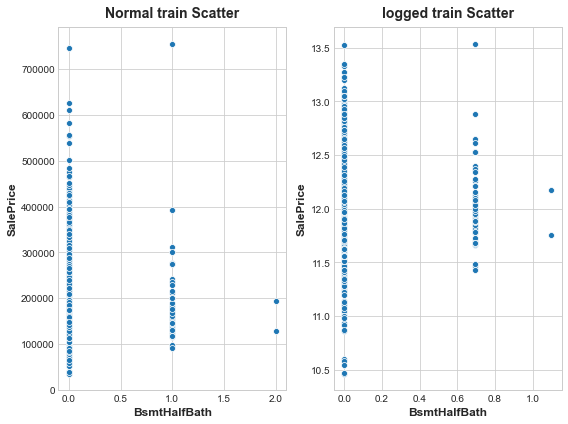

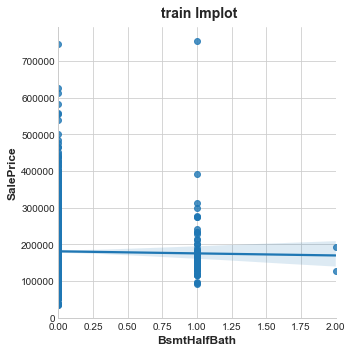

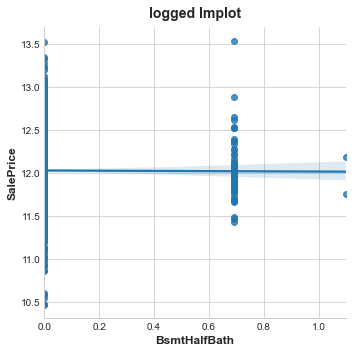



GarageYrBlt


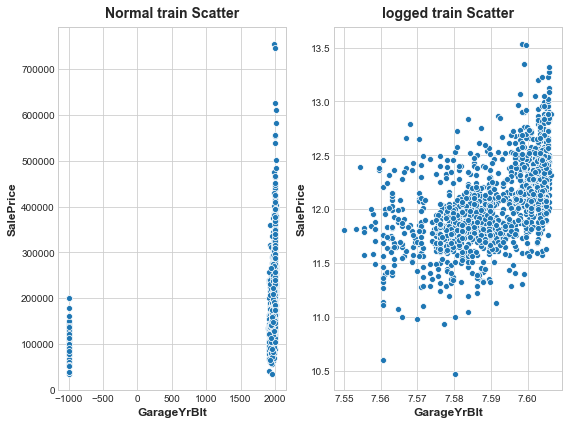

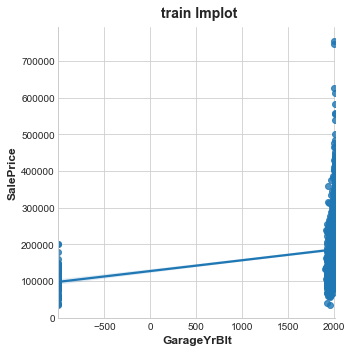

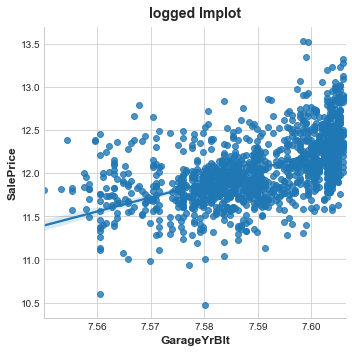



GarageArea


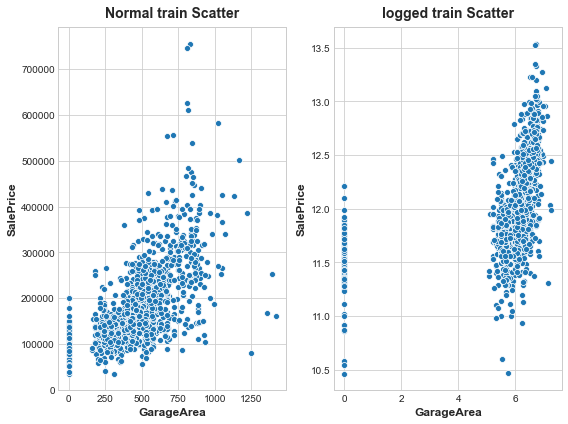

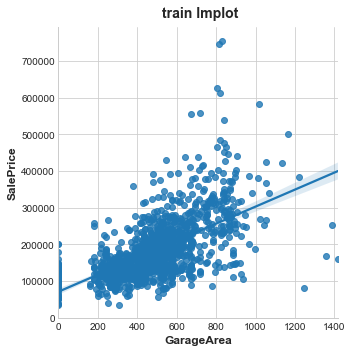

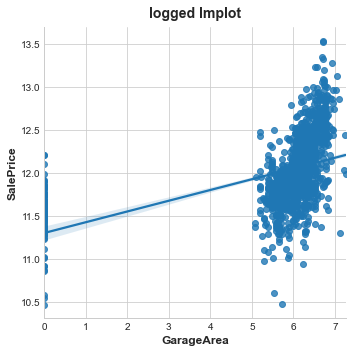



WoodDeckSF


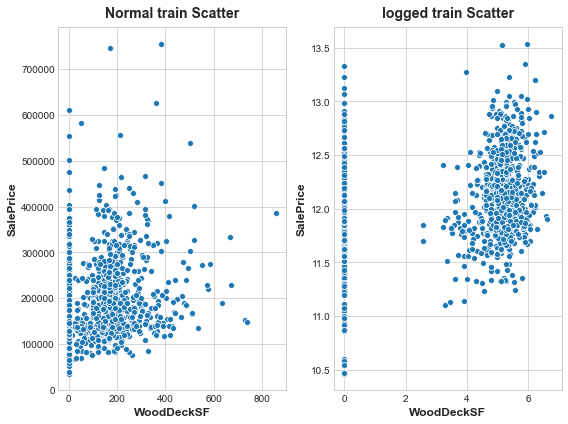

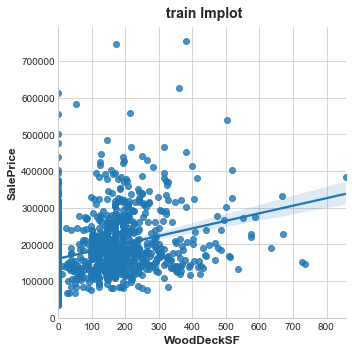

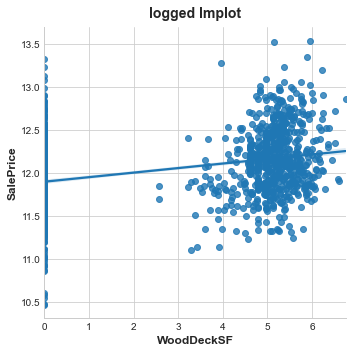



OpenPorchSF


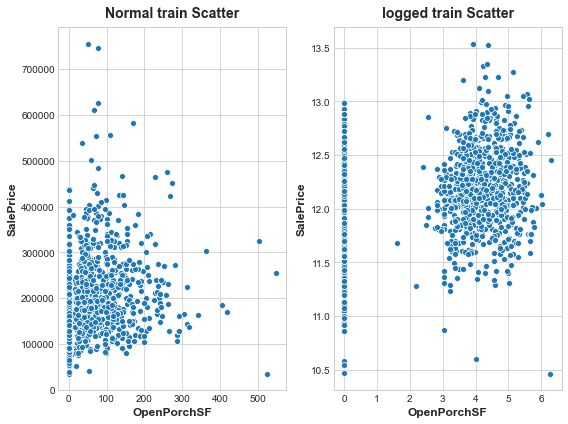

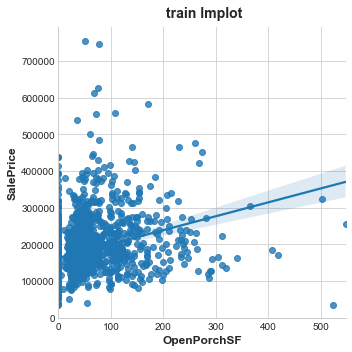

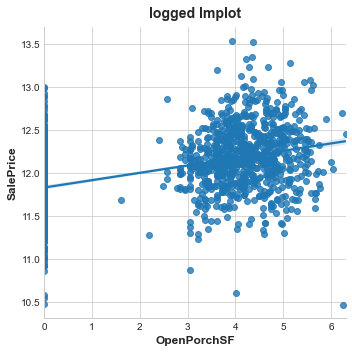



EnclosedPorch


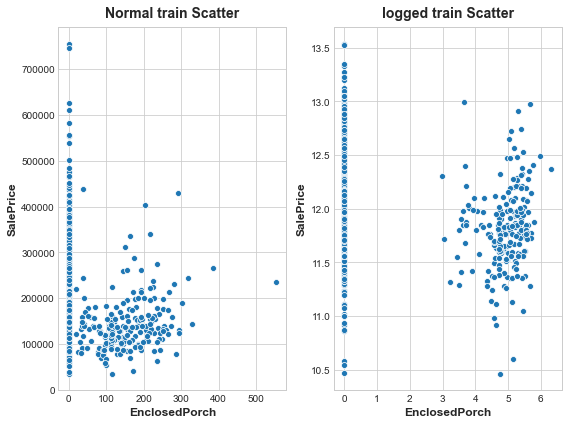

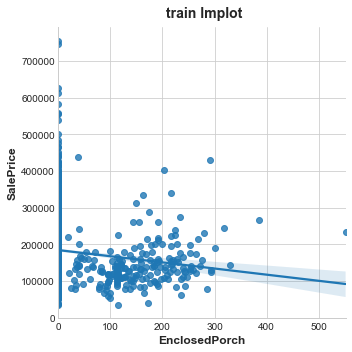

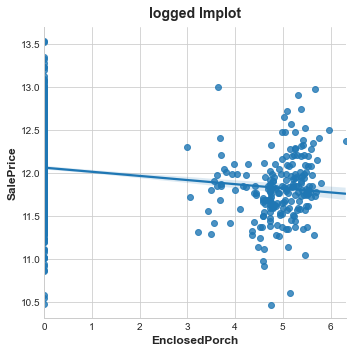



3SsnPorch


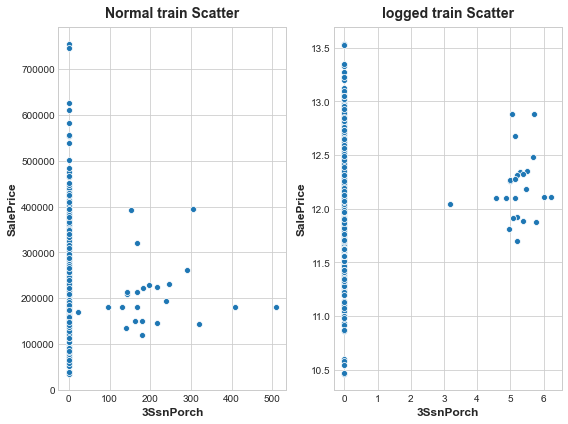

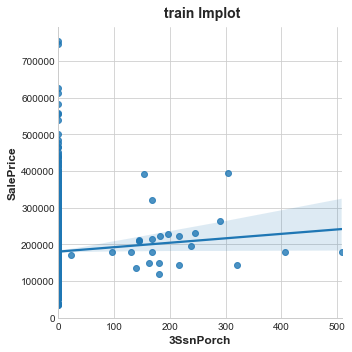

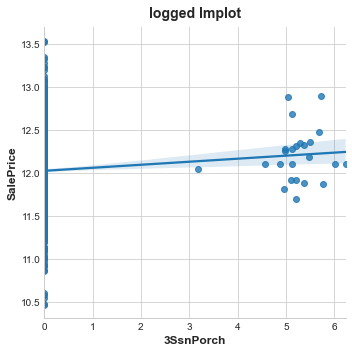



ScreenPorch


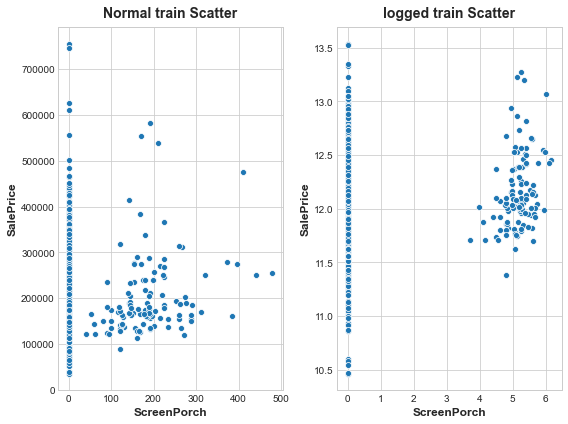

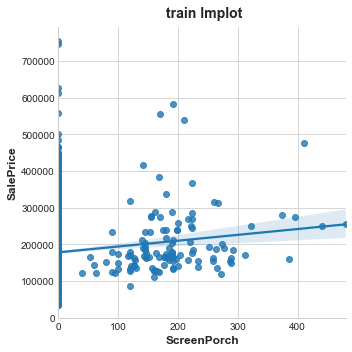

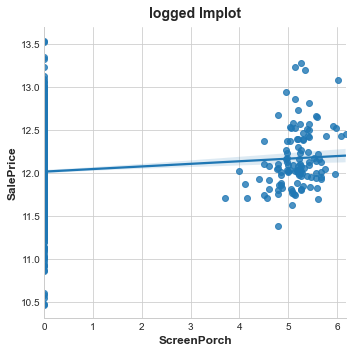



PoolArea


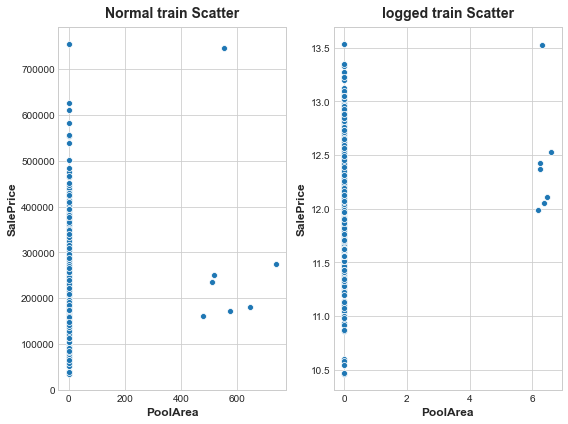

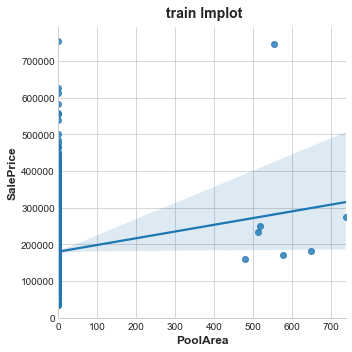

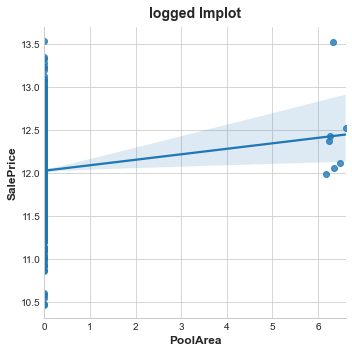



MiscVal


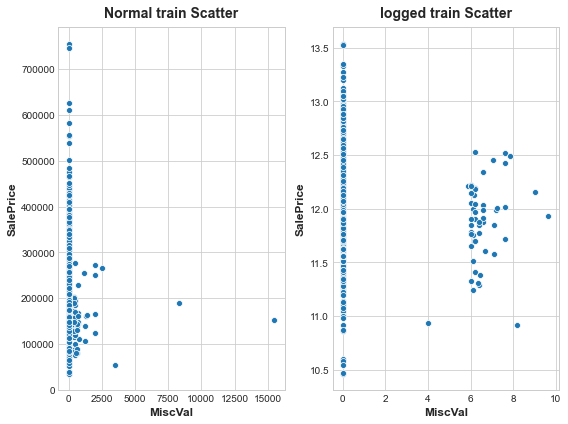

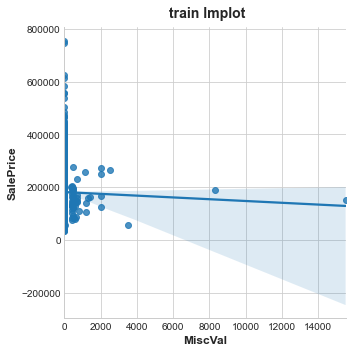

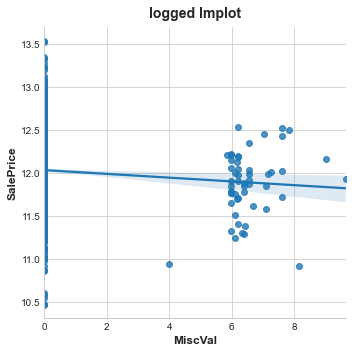



SalePrice


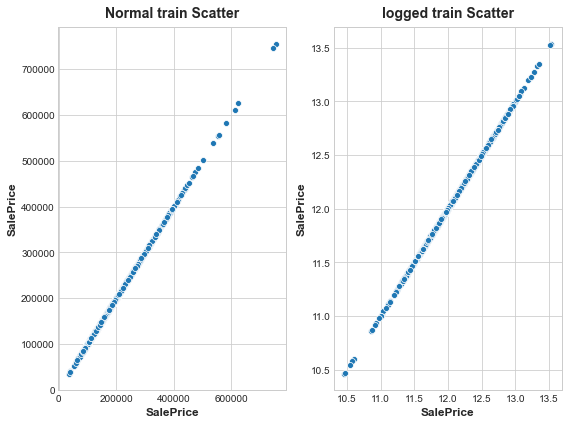

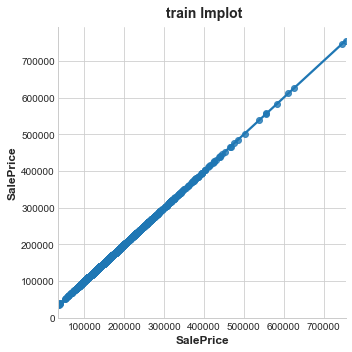

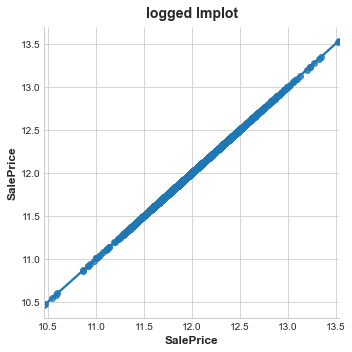

In [145]:
plot_lim_and_reg_plot(df=train,cols=continous.to_list(),target_col='SalePrice',fill_na=-999)

### Outlier

In [2]:
def find_outliers_turkey(x):
    q1 = np.percentile(x,25)
    q3 = np.percentile(x,75)
    iqr = q3-q1
    floor = q1 - 1.5*iqr
    ceiling = q3 + 1.5*iqr
    outlier_indices = list(x.index[(x < floor)|(x > ceiling)])
    outlier_values = list(x[outlier_indices])
    
    return outlier_indices,outlier_values
        

In [8]:
#TotalBsmtSF
turkey_indices ,turkey_values = find_outliers_turkey(train.LotArea)

In [9]:
print(np.sort(turkey_values))

[  1300   1477  17755  17871  17920  18000  18030  18386  18450  18800
  18890  19138  19296  19378  19690  19900  20431  20544  20781  20896
  21000  21286  21384  21453  21535  21695  21750  21750  21780  21872
  21930  22420  22950  23257  23595  24090  24682  25000  25095  25286
  25339  25419  26142  26178  27650  28698  29959  31770  32463  32668
  34650  35133  35760  36500  39104  40094  45600  46589  50271  53107
  53227  53504  57200  63887  70761 115149 159000 164660 215245]


In [10]:
from sklearn.preprocessing import scale
from statsmodels.nonparametric.kde import KDEUnivariate

In [11]:
def find_outliers_kde(x):
    x_scaled = scale(list(map(float,x)))
    kde = KDEUnivariate(x_scaled)
    kde.fit(bw='scott',fft=True)
    pred = kde.evaluate(x_scaled)
    
    n = sum(pred<0.05)
    outlier_ind = np.asarray(pred).argsort()[:n]
    outlier_value = np.asarray(x)[outlier_ind]
    
    return outlier_ind,outlier_value
    

In [17]:
kde_indices ,kde_values = find_outliers_kde(train.GrLivArea)

In [19]:
print(np.sort(kde_values))

[ 334  438  480  520  605  616 2640 2643 2646 2654 2668 2696 2704 2713
 2715 2727 2728 2730 2775 2784 2792 2794 2810 2822 2828 2868 2872 2872
 2898 2945 2978 3082 3086 3112 3140 3194 3222 3228 3238 3279 3395 3447
 3493 3608 3627 4316 4476 4676 5642]


##### MI scoress and Correlation of continous feature with target

In [68]:
from sklearn.metrics import mutual_info_score

In [77]:
from sklearn.impute import SimpleImputer

### we wanna compare the median price and the value-counts for each column in num_cat

In [15]:
from IPython.display import display

In [206]:
def plot_value_counts_and_median(df,thresh,categorical,target_col):
    #thresh value is for outlier check
    df_def = df.copy()
    #features = categorical.append(target_col)
    #df_def= df_def[features]
    df_def = df_def[df_def[target_col]<thresh]# outlier removal
    df_def.fillna(0,inplace=True)
    global_mean = df_def[target_col].mean()
    global_median = df_def[target_col].median()
    global_count = df_def.shape[0]
    for c in categorical:
        print(c)
        print("Number of unique values : ",df_def[c].nunique())
        df_group = pd.DataFrame(df_def.groupby(c)['SalePrice'].agg(['mean','median','count']).sort_values(by='median',ascending=False))
        df_group['mean_dif'] = df_group['mean'] - global_mean
        df_group['mean_dif_%'] = (1-(df_group['mean'] / global_mean))*100
        df_group['median_dif'] = df_group['median'] - global_median
        df_group['median_dif_%'] = (1-(df_group['median'] / global_median))*100
        df_group['count_dif'] = df_group['count'] - global_count
        df_group['count_%'] = (df_group['count'] / global_count)*100
        display(df_group[['mean','median','mean_dif_%','median_dif_%','count','count_%']].head())
        print()
        sort_target = df_def.groupby(c)[target_col].median().sort_values(ascending=False).index
        sns.boxplot(y=target_col, x=c, data= df_def, order= sort_target)
        plt.xlabel('sale price in $');
        sns.despine()
        plt.show()
        print()
        print()

MSSubClass
Number of unique values :  15


,mean,median,mean_dif_%,median_dif_%,count,count_%
MSSubClass,,,,,,
60,238220.140940,215100,-31.957651,-31.963190,298,20.424949
120,200779.080460,192000,-11.217866,-17.791411,87,5.962988
80,169736.551724,166500,5.977569,-2.147239,58,3.975326
75,192437.500000,163500,-6.597202,-0.306748,16,1.096642
20,185224.811567,159250,-2.601866,2.300613,536,36.737491


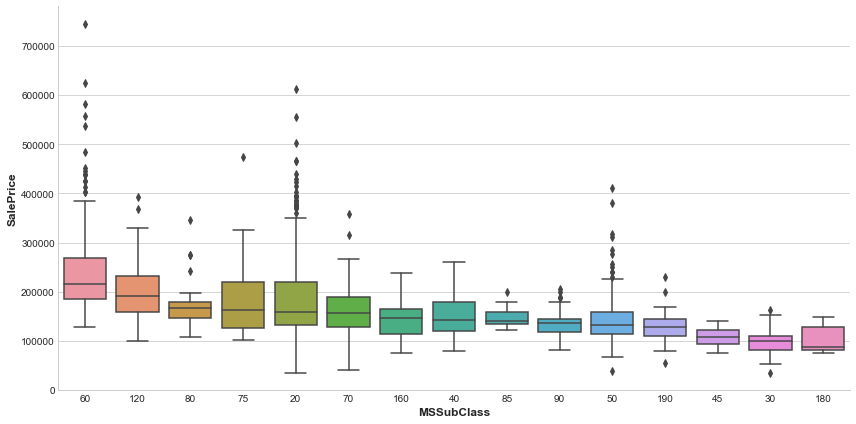



OverallQual
Number of unique values :  10


,mean,median,mean_dif_%,median_dif_%,count,count_%
OverallQual,,,,,,
10,419975.941176,426000,-132.637922,-161.349693,17,1.165182
9,367513.023256,345000,-103.577057,-111.656442,43,2.947224
8,274735.535714,269750,-52.184680,-65.490798,168,11.514736
7,207716.423197,200141,-15.060679,-22.785890,319,21.864291
6,161603.034759,160000,10.482981,1.840491,374,25.633996


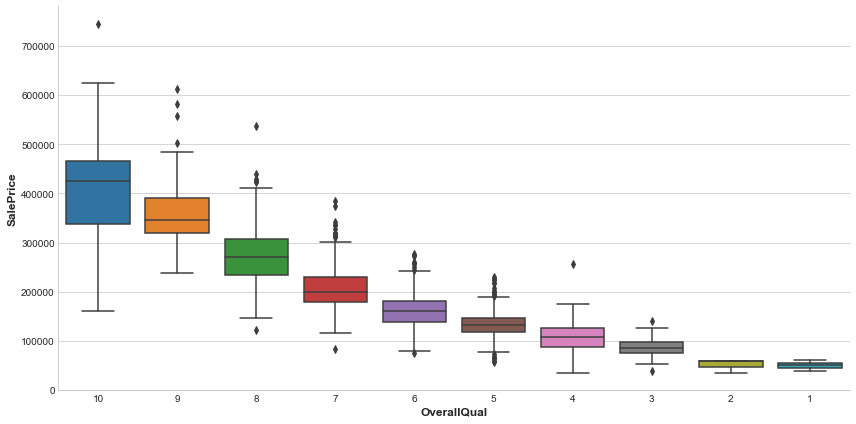



OverallCond
Number of unique values :  9


,mean,median,mean_dif_%,median_dif_%,count,count_%
OverallCond,,,,,,
5,203146.914738,185000,-12.529485,-13.496933,821,56.271419
9,216004.545455,176200,-19.651732,-8.098160,22,1.507882
7,158145.487805,145000,12.398225,11.042945,205,14.050720
6,151567.015936,142500,16.042249,12.576687,251,17.203564
8,155651.736111,142500,13.779593,12.576687,72,4.934887


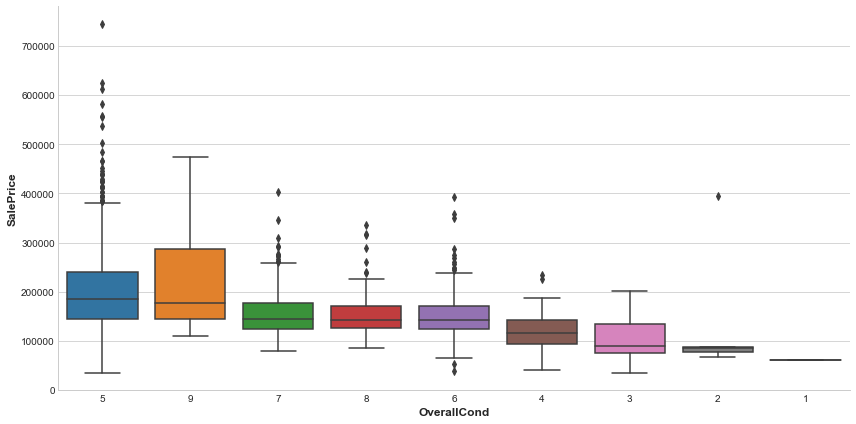



BsmtFullBath
Number of unique values :  4


,mean,median,mean_dif_%,median_dif_%,count,count_%
BsmtFullBath,,,,,,
2,213063.066667,188000,-18.022354,-15.337423,15,1.028101
3,179000.000000,179000,0.846253,-9.815951,1,0.068540
1,202522.918367,178800,-12.183833,-9.693252,588,40.301576
0,164832.191813,154000,8.694249,5.521472,855,58.601782


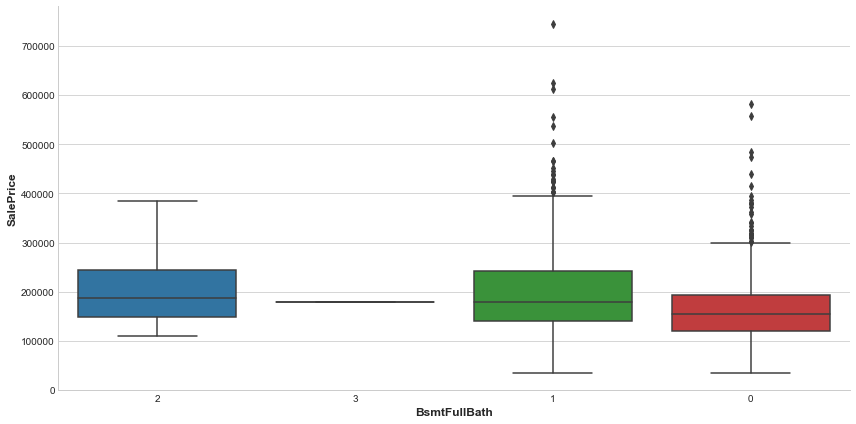



FullBath
Number of unique values :  4


,mean,median,mean_dif_%,median_dif_%,count,count_%
FullBath,,,,,,
3,335098.625000,314500,-85.621699,-92.944785,32,2.193283
2,213009.825521,196750,-17.992862,-20.705521,768,52.638794
0,165200.888889,145000,8.490016,11.042945,9,0.616861
1,134751.440000,132375,25.356927,18.788344,650,44.551062


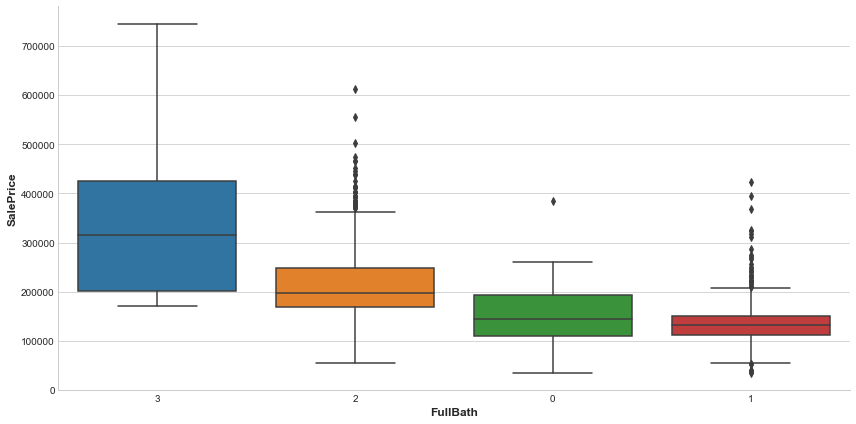



HalfBath
Number of unique values :  3


,mean,median,mean_dif_%,median_dif_%,count,count_%
HalfBath,,,,,,
1,211706.458801,188850.0,-17.270886,-15.858896,534,36.600411
2,162028.916667,159243.5,10.247072,2.304601,12,0.822481
0,162534.884995,143000.0,9.966800,12.269939,913,62.577108


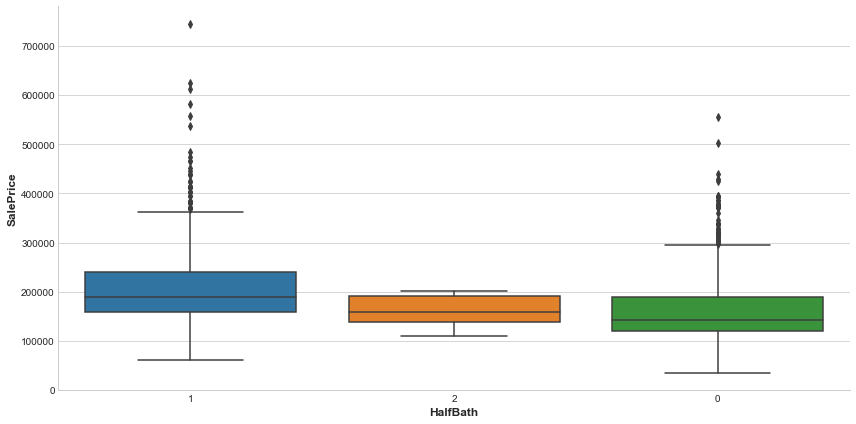



BedroomAbvGr
Number of unique values :  8


,mean,median,mean_dif_%,median_dif_%,count,count_%
BedroomAbvGr,,,,,,
0,221493.166667,202500,-22.692052,-24.233129,6,0.411241
8,200000.000000,200000,-10.786309,-22.699387,1,0.068540
4,217899.655660,192820,-20.701493,-18.294479,212,14.530500
3,181056.870647,169945,-0.293112,-4.260736,804,55.106237
5,180819.047619,161500,-0.161375,0.920245,21,1.439342


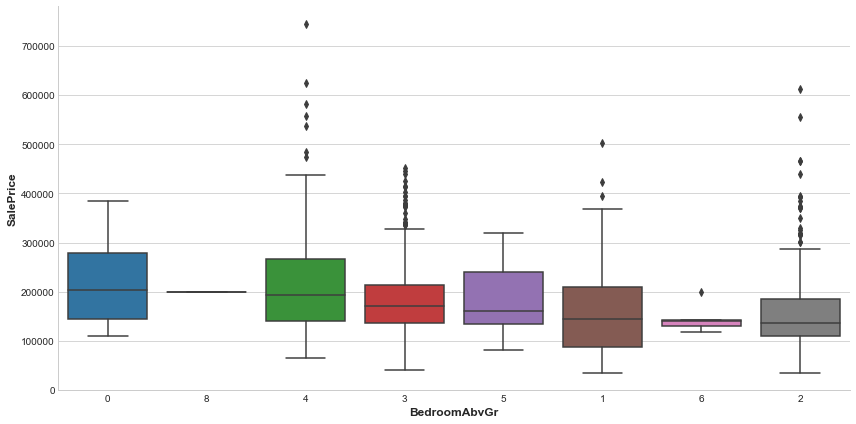



KitchenAbvGr
Number of unique values :  4


,mean,median,mean_dif_%,median_dif_%,count,count_%
KitchenAbvGr,,,,,,
1,182977.854781,165500,-1.357206,-1.533742,1391,95.339273
2,131096.153846,133900,27.381705,17.852761,65,4.455106
0,127500.000000,127500,29.373728,21.779141,1,0.068540
3,109500.000000,109500,39.344496,32.822086,2,0.137080


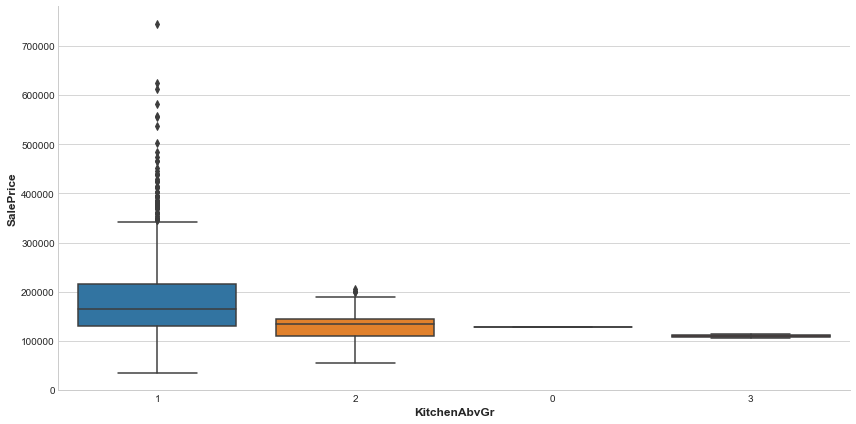



TotRmsAbvGrd
Number of unique values :  12


,mean,median,mean_dif_%,median_dif_%,count,count_%
TotRmsAbvGrd,,,,,,
11,318022.000000,311738.5,-76.162418,-91.250613,18,1.233722
10,286306.978261,280500.0,-58.594467,-72.085890,46,3.152844
9,252988.173333,252000.0,-40.138130,-54.601227,75,5.140507
8,213427.529412,200000.0,-18.224241,-22.699387,187,12.816998
12,280971.454545,200000.0,-55.638952,-22.699387,11,0.753941


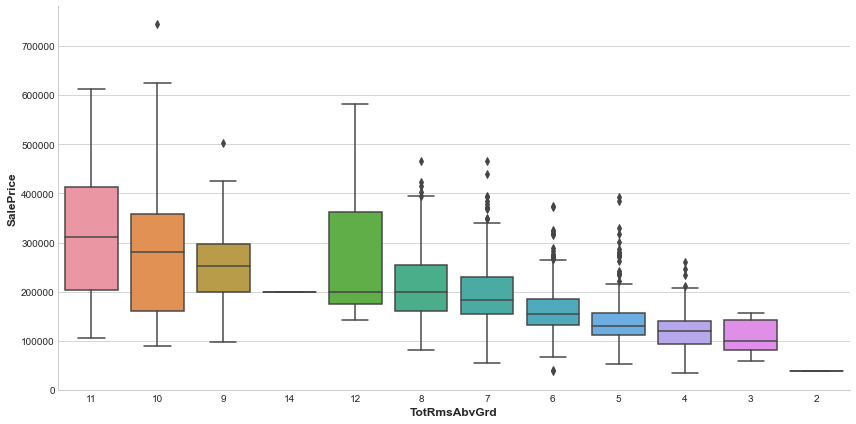



Fireplaces
Number of unique values :  4


,mean,median,mean_dif_%,median_dif_%,count,count_%
Fireplaces,,,,,,
2,236076.157895,205950,-30.770031,-26.349693,114,7.813571
3,252000.000000,205000,-39.590750,-25.766871,5,0.342700
1,211843.909231,189975,-17.347024,-16.549080,650,44.551062
0,141331.482609,135000,21.712033,17.177914,690,47.292666


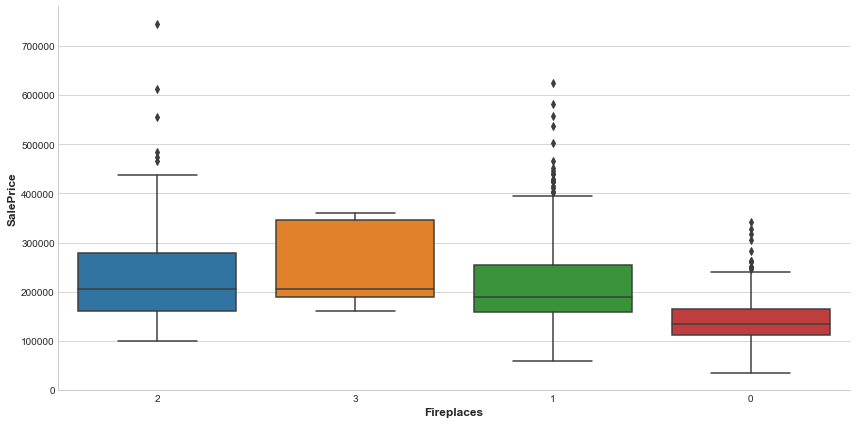



GarageCars
Number of unique values :  5


,mean,median,mean_dif_%,median_dif_%,count,count_%
GarageCars,,,,,,
3,307161.877778,294038.5,-70.146654,-80.391718,180,12.337217
4,192655.800000,200000.0,-6.718125,-22.699387,5,0.342700
2,183851.663835,177750.0,-1.841236,-9.049080,824,56.477039
1,128116.688347,128000.0,29.032125,21.472393,369,25.291295
0,103317.283951,100000.0,42.769297,38.650307,81,5.551748


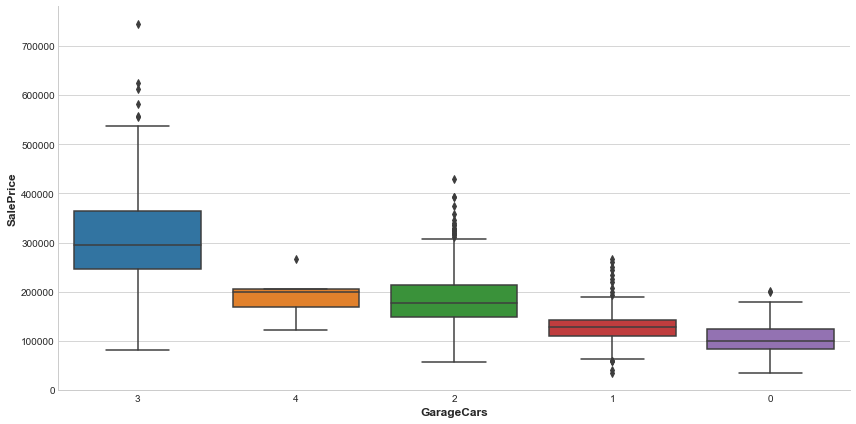



MoSold
Number of unique values :  12


,mean,median,mean_dif_%,median_dif_%,count,count_%
MoSold,,,,,,
9,195683.206349,185900,-8.395101,-14.049080,63,4.318026
12,186518.966102,178000,-3.318739,-9.202454,59,4.043866
8,184651.827869,174450,-2.284472,-7.024540,122,8.361892
2,177882.000000,173250,1.465549,-6.288344,52,3.564085
11,192210.911392,173000,-6.471687,-6.134969,79,5.414668


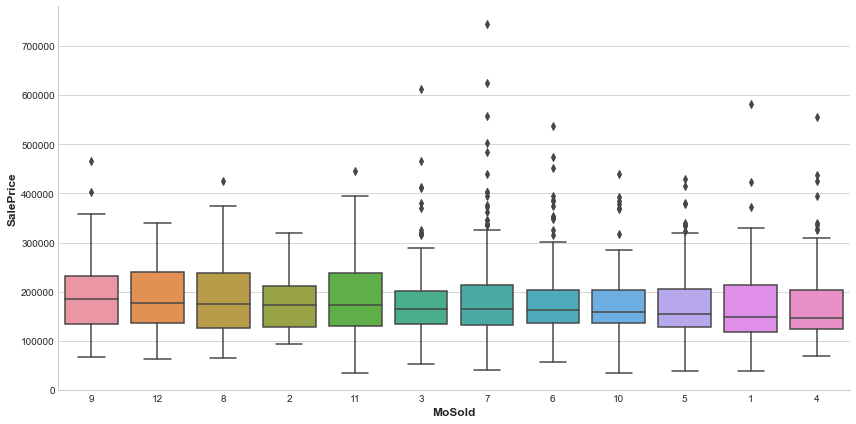



YrSold
Number of unique values :  5


,mean,median,mean_dif_%,median_dif_%,count,count_%
YrSold,,,,,,
2007,184328.588415,166000,-2.105420,-1.840491,328,22.481151
2008,177360.838816,164000,1.754236,-0.613497,304,20.836189
2006,182549.458599,163995,-1.119904,-0.610429,314,21.521590
2009,179432.103550,162000,0.606897,0.613497,338,23.166552
2010,177393.674286,155000,1.736048,4.907975,175,11.994517


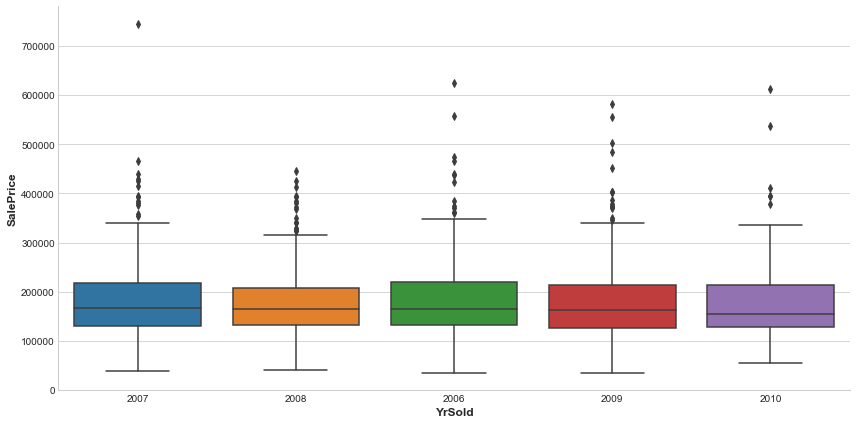



SalePrice
Number of unique values :  662


,mean,median,mean_dif_%,median_dif_%,count,count_%
SalePrice,,,,,,
745000,745000,745000,-312.679002,-357.055215,1,0.06854
625000,625000,625000,-246.207216,-283.435583,1,0.06854
611657,611657,611657,-238.816108,-275.249693,1,0.06854
582933,582933,582933,-222.904978,-257.627607,1,0.06854
556581,556581,556581,-208.307774,-241.460736,1,0.06854


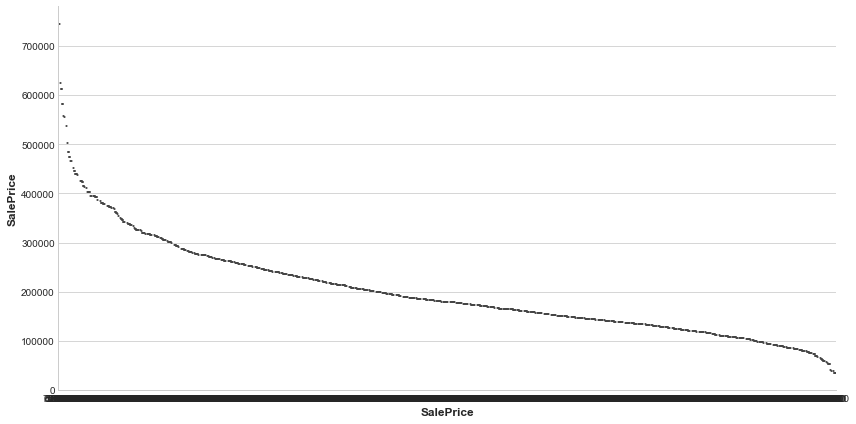

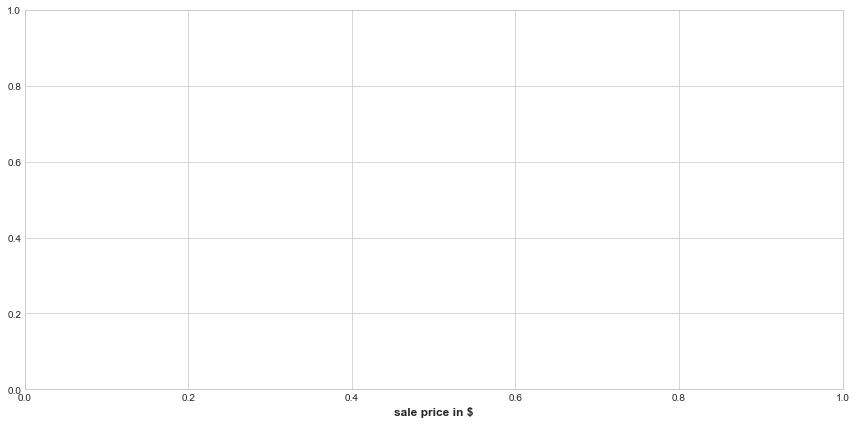

In [145]:
plot_value_counts_and_median(df=train,thresh=target.max(),categorical=num_cat,target_col='SalePrice')

MSSubClass
Number of unique values :  15


,mean,median,mean_dif_%,median_dif_%,count,count_%
MSSubClass,,,,,,
60,214066.405405,205000,-27.832477,-29.746835,259,18.836364
120,193434.771084,190000,-15.512034,-20.253165,83,6.036364
80,166661.754386,165500,0.475813,-4.746835,57,4.145455
20,170459.578842,155000,-1.792106,1.898734,501,36.436364
70,163512.627119,155000,2.356355,1.898734,59,4.290909


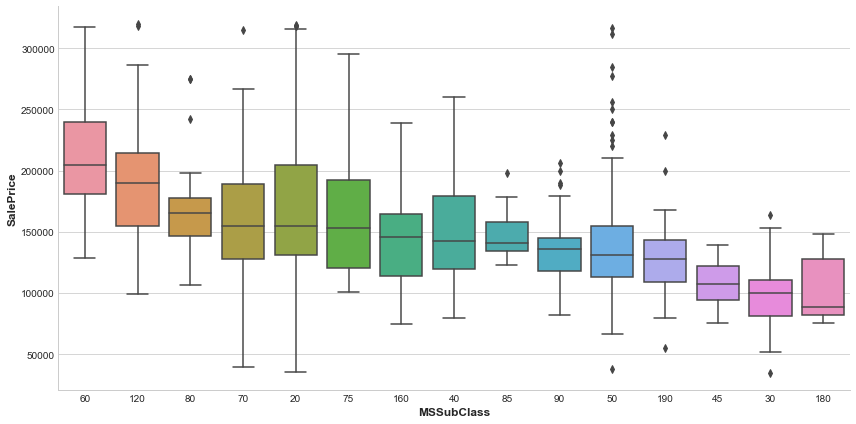



OverallQual
Number of unique values :  10


,mean,median,mean_dif_%,median_dif_%,count,count_%
OverallQual,,,,,,
9,295242.166667,313906.5,-76.307615,-98.675000,12,0.872727
8,251854.656934,255500.0,-50.398212,-61.708861,137,9.963636
7,204255.848875,200000.0,-21.973978,-26.582278,311,22.618182
10,218250.000000,184750.0,-30.330764,-16.930380,3,0.218182
6,161603.034759,160000.0,3.496692,-1.265823,374,27.200000


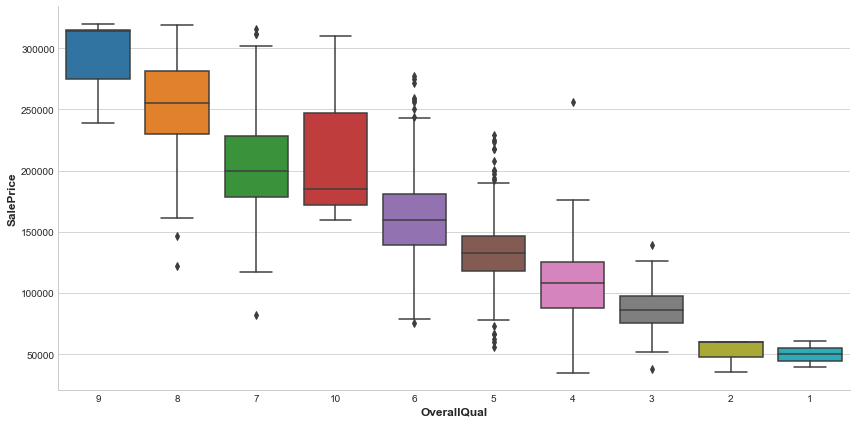



OverallCond
Number of unique values :  9


,mean,median,mean_dif_%,median_dif_%,count,count_%
OverallCond,,,,,,
5,183946.053548,179600.0,-9.845726,-13.670886,747,54.327273
9,187952.631579,168000.0,-12.238305,-6.329114,19,1.381818
7,156023.768473,145000.0,6.828422,8.227848,203,14.763636
6,148960.568548,142062.5,11.046302,10.087025,248,18.036364
8,153125.704225,142000.0,8.559038,10.126582,71,5.163636


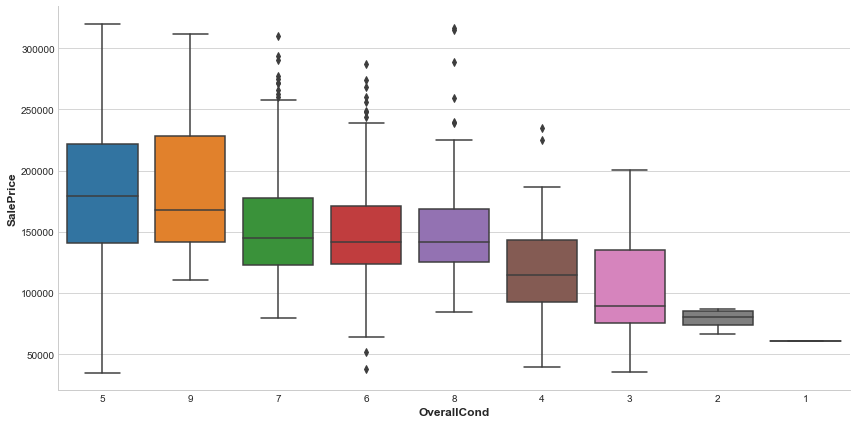



BsmtFullBath
Number of unique values :  4


,mean,median,mean_dif_%,median_dif_%,count,count_%
BsmtFullBath,,,,,,
3,179000.000000,179000.0,-6.892127,-13.291139,1,0.072727
1,180515.153409,167250.0,-7.796920,-5.854430,528,38.400000
2,175995.500000,156668.5,-5.097951,0.842722,12,0.872727
0,159055.817746,151750.0,5.017795,3.955696,834,60.654545


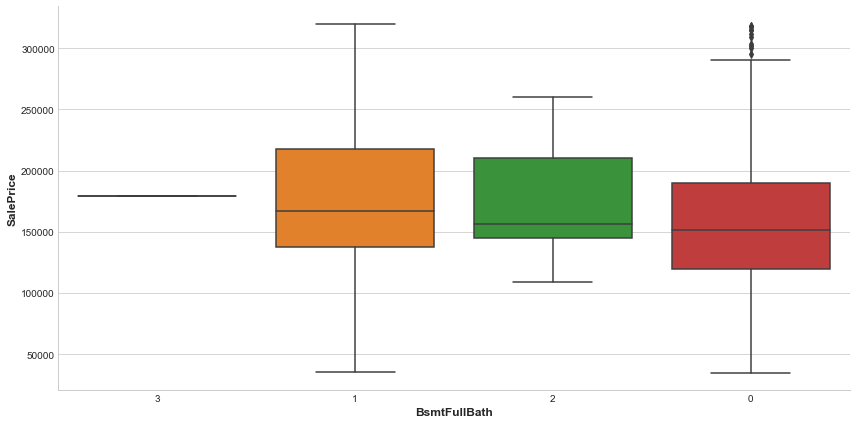



FullBath
Number of unique values :  4


,mean,median,mean_dif_%,median_dif_%,count,count_%
FullBath,,,,,,
3,219878.062500,200562,-31.302982,-26.937975,16,1.163636
2,198132.515581,191000,-18.317352,-20.886076,706,51.345455
0,137726.000000,144500,17.755167,8.544304,8,0.581818
1,132952.071318,132000,20.605980,16.455696,645,46.909091


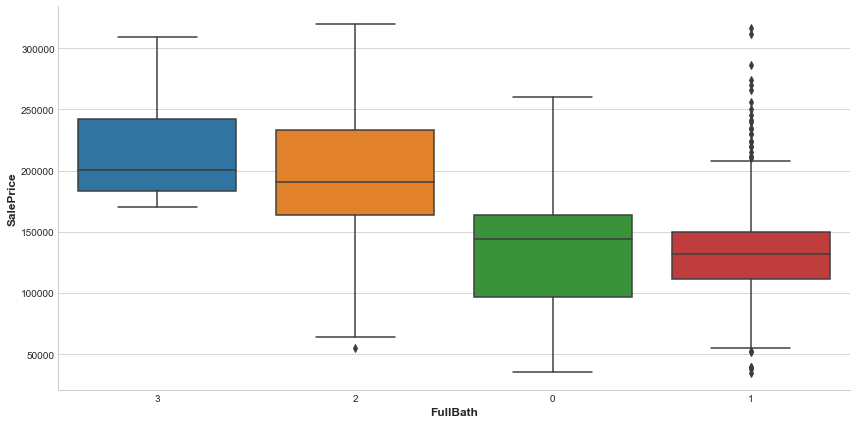



HalfBath
Number of unique values :  3


,mean,median,mean_dif_%,median_dif_%,count,count_%
HalfBath,,,,,,
1,189762.012526,181000.0,-13.318799,-14.556962,479,34.836364
2,162028.916667,159243.5,3.242371,-0.787025,12,0.872727
0,155447.000000,141000.0,7.172847,10.759494,884,64.290909


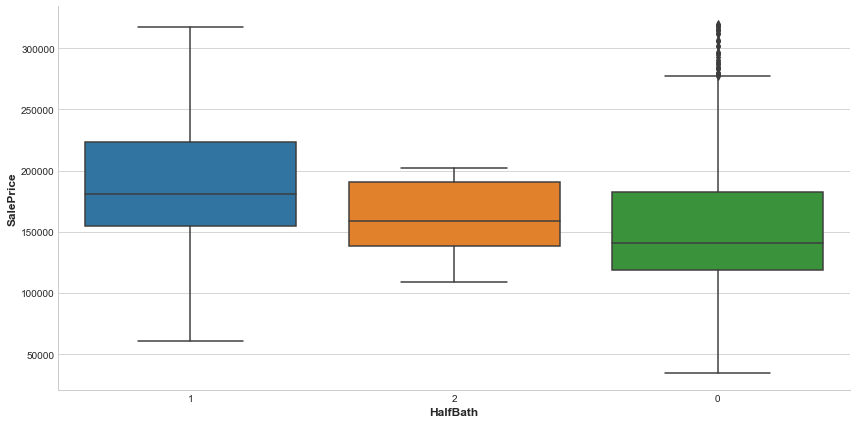



BedroomAbvGr
Number of unique values :  8


,mean,median,mean_dif_%,median_dif_%,count,count_%
BedroomAbvGr,,,,,,
8,200000.000000,200000,-19.432544,-26.582278,1,0.072727
4,186574.256831,173000,-11.415191,-9.493671,183,13.309091
3,173310.663212,165450,-3.494667,-4.715190,772,56.145455
5,173860.000000,160750,-3.822710,-1.740506,20,1.454545
0,188791.800000,145000,-12.739425,8.227848,5,0.363636


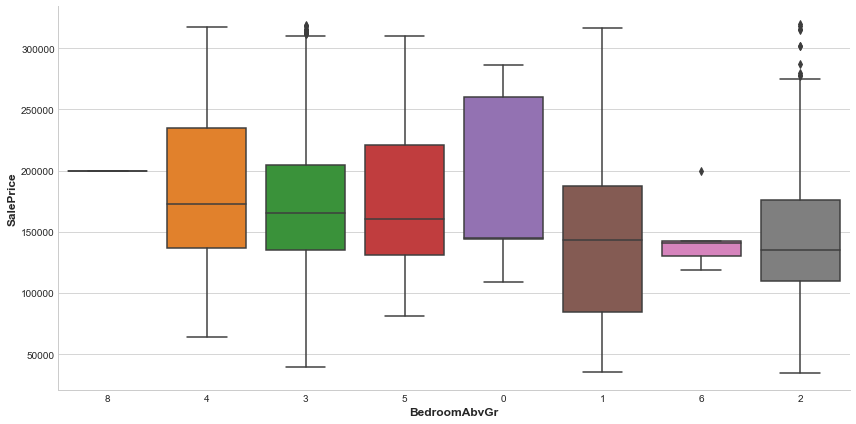



KitchenAbvGr
Number of unique values :  4


,mean,median,mean_dif_%,median_dif_%,count,count_%
KitchenAbvGr,,,,,,
1,169386.188982,160000,-1.151117,-1.265823,1307,95.054545
2,131096.153846,133900,21.714264,15.253165,65,4.727273
0,127500.000000,127500,23.861753,19.303797,1,0.072727
3,109500.000000,109500,34.610682,30.696203,2,0.145455


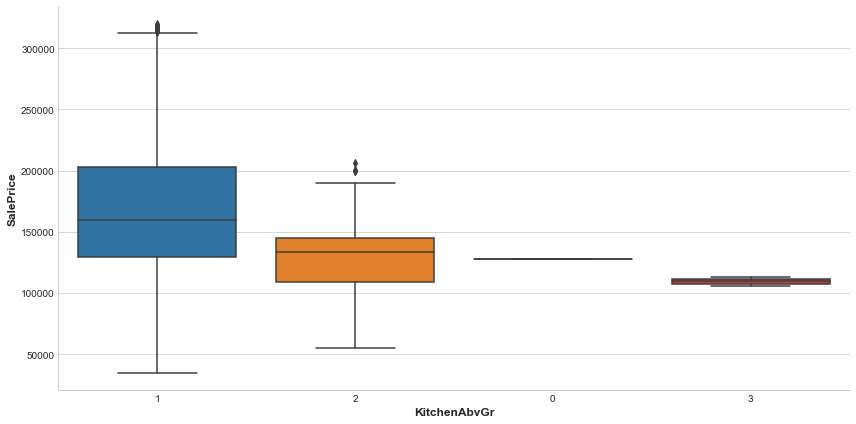



TotRmsAbvGrd
Number of unique values :  12


,mean,median,mean_dif_%,median_dif_%,count,count_%
TotRmsAbvGrd,,,,,,
9,223274.533333,239500,-33.331228,-51.582278,60,4.363636
10,207302.666667,207200,-23.793424,-31.139241,30,2.181818
14,200000.000000,200000,-19.432544,-26.582278,1,0.072727
12,186844.125000,193500,-11.576346,-22.468354,8,0.581818
11,203225.222222,191000,-21.358526,-20.886076,9,0.654545


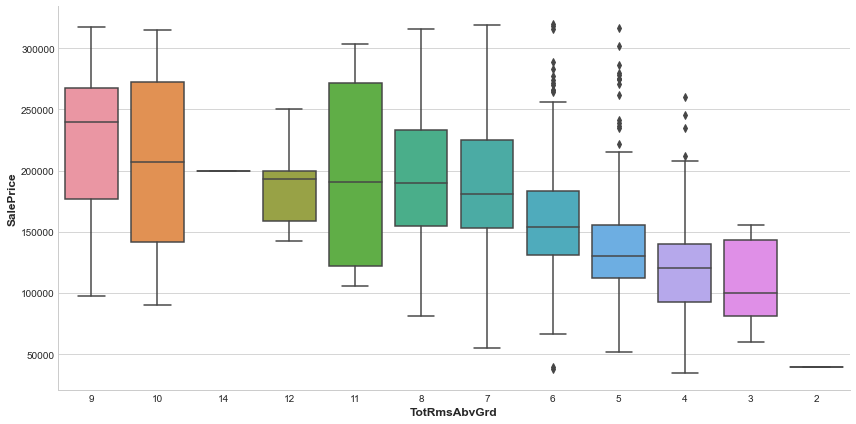



Fireplaces
Number of unique values :  4


,mean,median,mean_dif_%,median_dif_%,count,count_%
Fireplaces,,,,,,
3,185000.000000,190000,-10.475103,-20.253165,3,0.218182
2,197376.287234,184300,-17.865760,-16.645570,94,6.836364
1,193727.200000,183350,-15.686662,-16.044304,590,42.909091
0,140767.558140,135000,15.938862,14.556962,688,50.036364


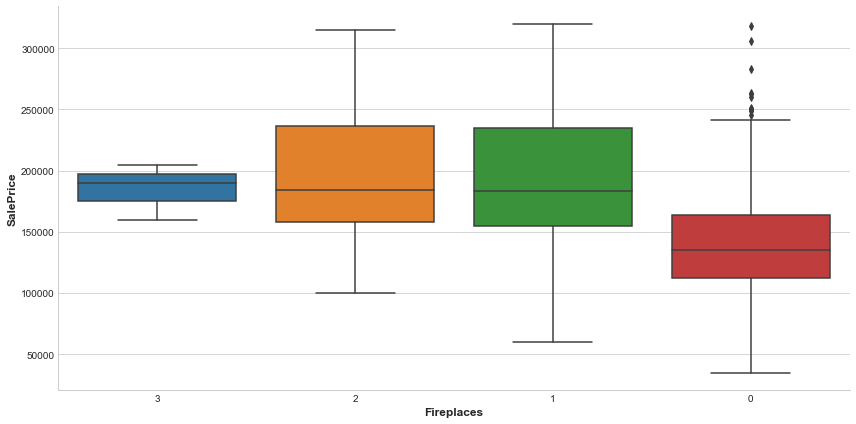



GarageCars
Number of unique values :  5


,mean,median,mean_dif_%,median_dif_%,count,count_%
GarageCars,,,,,,
3,247626.705357,255250.0,-47.873437,-61.550633,112,8.145455
4,192655.800000,200000.0,-15.046861,-26.582278,5,0.363636
2,180586.969059,176458.5,-7.839806,-11.682595,808,58.763636
1,128116.688347,128000.0,23.493490,18.987342,369,26.836364
0,103317.283951,100000.0,38.302770,36.708861,81,5.890909


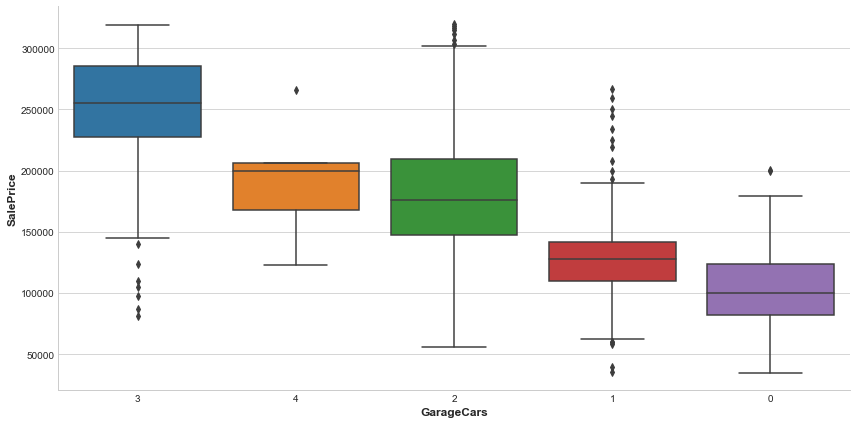



MoSold
Number of unique values :  12


,mean,median,mean_dif_%,median_dif_%,count,count_%
MoSold,,,,,,
9,182346.406780,179665,-8.890476,-13.712025,59,4.290909
12,183872.741379,175500,-9.801946,-11.075949,58,4.218182
2,175095.372549,173000,-4.560429,-9.493671,51,3.709091
8,178275.618644,170750,-6.459553,-8.069620,118,8.581818
11,172258.591549,163000,-2.866409,-3.164557,71,5.163636


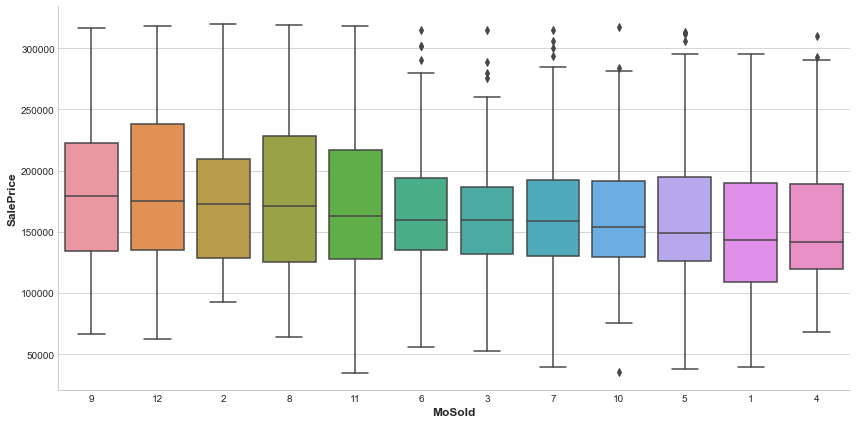



YrSold
Number of unique values :  5


,mean,median,mean_dif_%,median_dif_%,count,count_%
YrSold,,,,,,
2008,166689.135417,160000,0.459463,-1.265823,288,20.945455
2007,172791.631410,159750,-3.184721,-1.107595,312,22.690909
2006,168499.162712,159500,-0.621418,-0.949367,295,21.454545
2009,164417.221519,157750,1.816165,0.158228,316,22.981818
2010,162652.097561,152500,2.870231,3.481013,164,11.927273


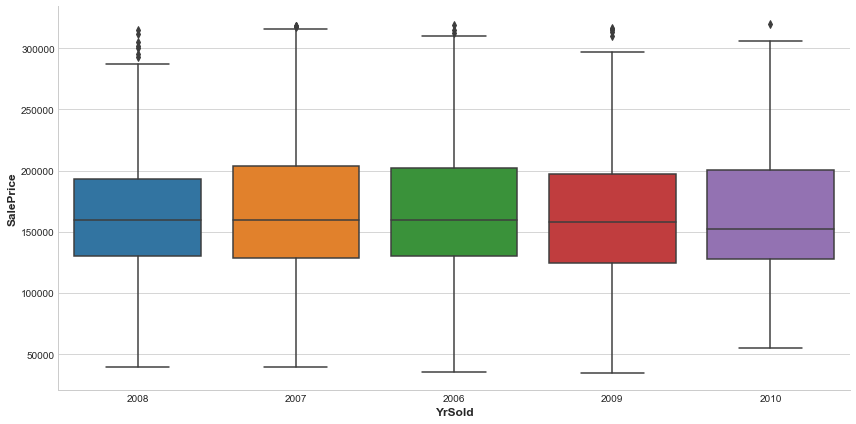



SalePrice
Number of unique values :  590


,mean,median,mean_dif_%,median_dif_%,count,count_%
SalePrice,,,,,,
319900,319900,319900,-91.032354,-102.468354,1,0.072727
319000,319000,319000,-90.494908,-101.898734,1,0.072727
318061,318061,318061,-89.934172,-101.304430,1,0.072727
318000,318000,318000,-89.897745,-101.265823,2,0.145455
317000,317000,317000,-89.300582,-100.632911,1,0.072727


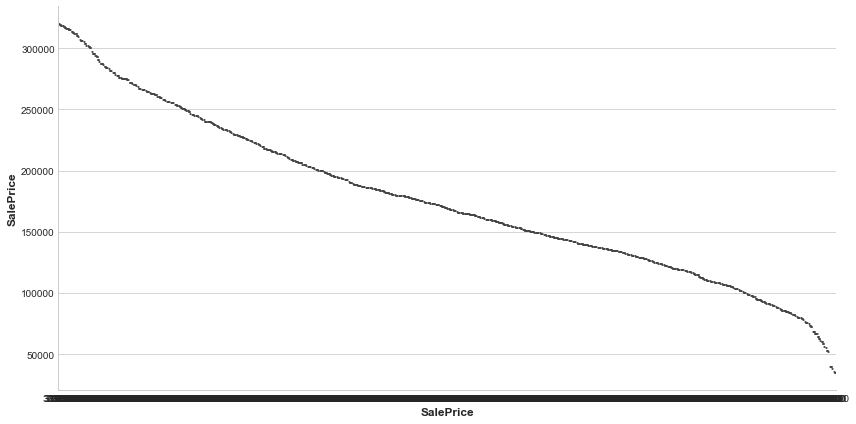

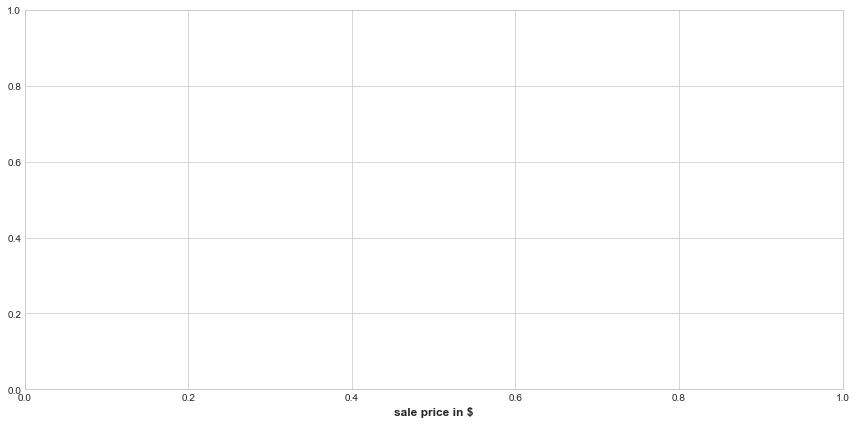

In [146]:
#320000
#outlier removal
plot_value_counts_and_median(df=train,thresh=320000,categorical=num_cat,target_col='SalePrice')

In [17]:
def plot_categorical_and_median(df,thresh,categorical,target_col):
    #thresh value is for outlier check
    df_def = df.copy()
    #features = categorical.append(target_col)
    #df_def= df_def[features]
    df_def = df_def[df_def[target_col]<thresh]# outlier removal
    df_def.fillna(0,inplace=True)
    global_mean = df_def[target_col].mean()
    global_median = df_def[target_col].median()
    global_count = df_def.shape[0]
    for c in categorical:
        print(c)
        print("Number of unique values : ",df_def[c].nunique())
        df_group = pd.DataFrame(df_def.groupby(c)['SalePrice'].agg(['mean','median','count']).sort_values(by='median',ascending=False))
        df_group['mean_dif'] = df_group['mean'] - global_mean
        df_group['mean_dif_%'] = (1-(df_group['mean'] / global_mean))*100
        df_group['median_dif'] = df_group['median'] - global_median
        df_group['median_dif_%'] = (1-(df_group['median'] / global_median))*100
        df_group['count_dif'] = df_group['count'] - global_count
        df_group['count_%'] = (df_group['count'] / global_count)*100
        display(df_group[['mean','median','mean_dif_%','median_dif_%','count','count_%']].head())
        print()
        sort_target = df_def.groupby(c)[target_col].median().sort_values(ascending=False).index
        plt.rc("figure",figsize=(12,6))
        sns.boxplot(y=target_col, x=c, data= df_def, order= sort_target)
        ax = plt.gca()
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
        plt.show()
        plt.xlabel('sale price in $');
        print()
        sns.barplot(x=np.arange(df_group.shape[0]),y =df_group['count'])
        labels = df_group.index
        plt.xticks(np.arange(df_group.shape[0]),labels)
        plt.show()
        #plt.bar(x=np.arange(df_group.shape[0]),height =df_group['count'] )
        #plt.show()
        print()
        print()

MSSubClass
Number of unique values :  15


,mean,median,mean_dif_%,median_dif_%,count,count_%
MSSubClass,,,,,,
60,214066.405405,205000,-27.832477,-29.746835,259,18.836364
120,193434.771084,190000,-15.512034,-20.253165,83,6.036364
80,166661.754386,165500,0.475813,-4.746835,57,4.145455
20,170459.578842,155000,-1.792106,1.898734,501,36.436364
70,163512.627119,155000,2.356355,1.898734,59,4.290909


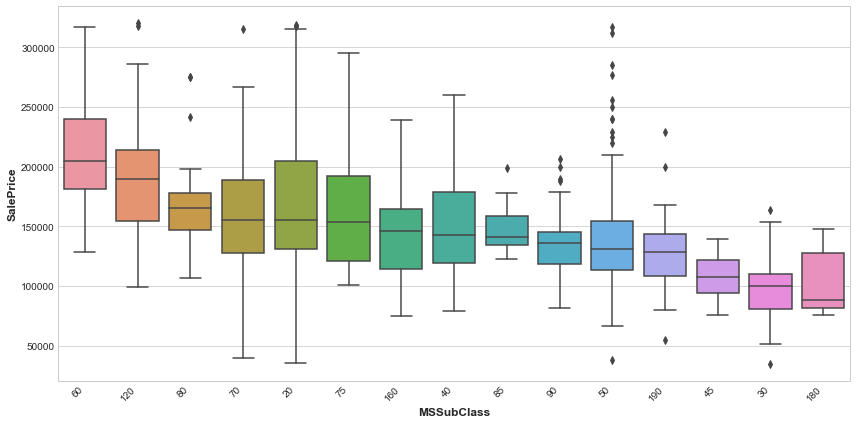

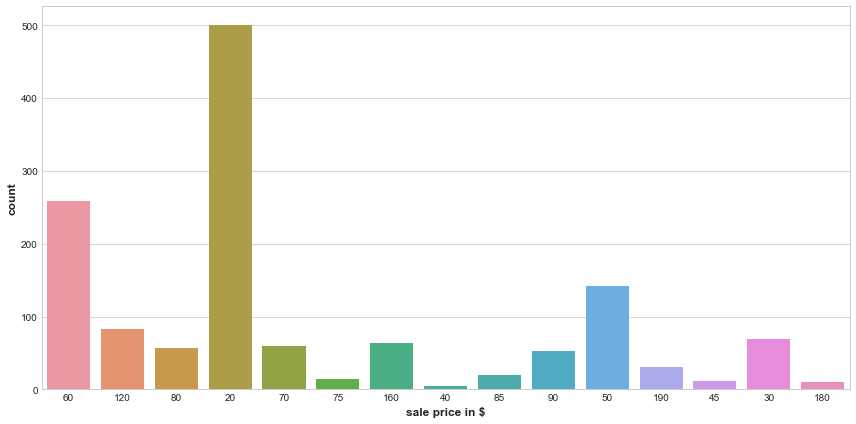



OverallQual
Number of unique values :  10


,mean,median,mean_dif_%,median_dif_%,count,count_%
OverallQual,,,,,,
9,295242.166667,313906.5,-76.307615,-98.675000,12,0.872727
8,251854.656934,255500.0,-50.398212,-61.708861,137,9.963636
7,204255.848875,200000.0,-21.973978,-26.582278,311,22.618182
10,218250.000000,184750.0,-30.330764,-16.930380,3,0.218182
6,161603.034759,160000.0,3.496692,-1.265823,374,27.200000


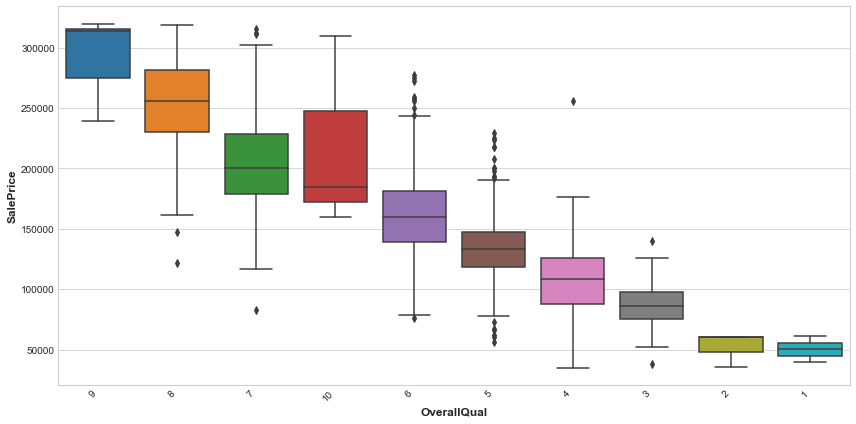

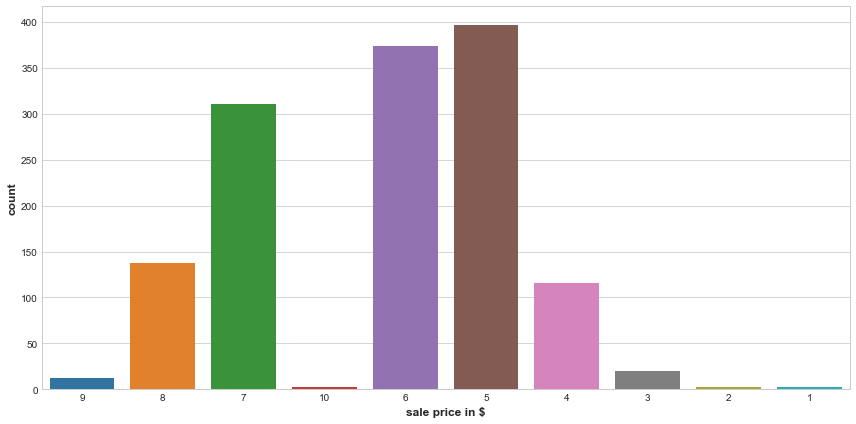



OverallCond
Number of unique values :  9


,mean,median,mean_dif_%,median_dif_%,count,count_%
OverallCond,,,,,,
5,183946.053548,179600.0,-9.845726,-13.670886,747,54.327273
9,187952.631579,168000.0,-12.238305,-6.329114,19,1.381818
7,156023.768473,145000.0,6.828422,8.227848,203,14.763636
6,148960.568548,142062.5,11.046302,10.087025,248,18.036364
8,153125.704225,142000.0,8.559038,10.126582,71,5.163636


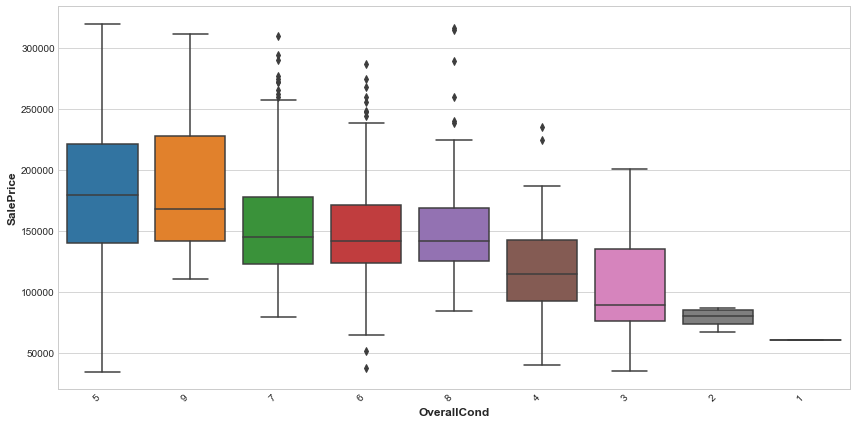

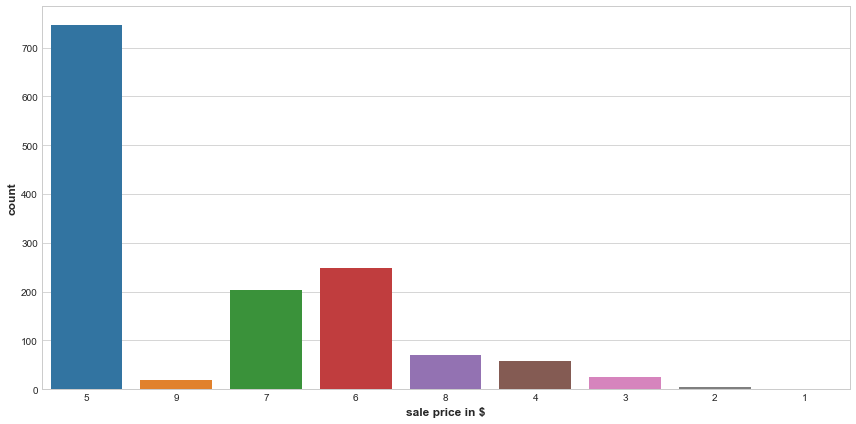



BsmtFullBath
Number of unique values :  4


,mean,median,mean_dif_%,median_dif_%,count,count_%
BsmtFullBath,,,,,,
3,179000.000000,179000.0,-6.892127,-13.291139,1,0.072727
1,180515.153409,167250.0,-7.796920,-5.854430,528,38.400000
2,175995.500000,156668.5,-5.097951,0.842722,12,0.872727
0,159055.817746,151750.0,5.017795,3.955696,834,60.654545


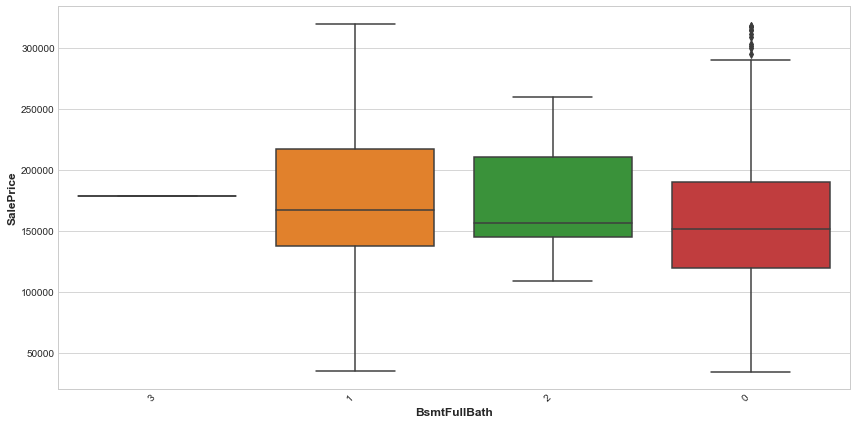

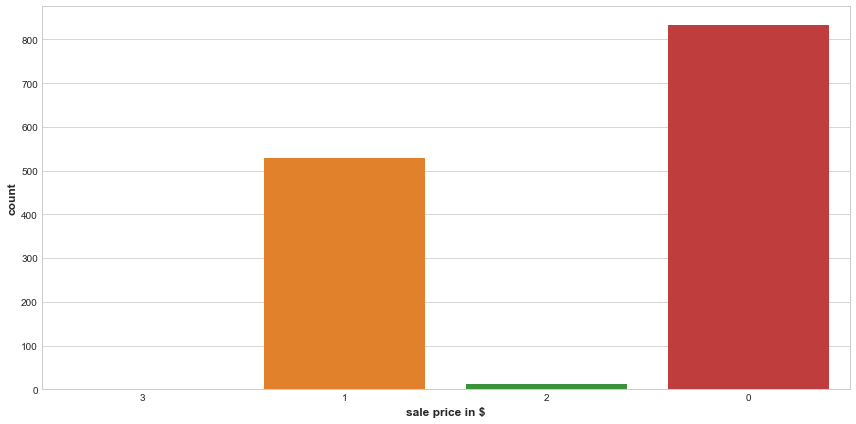



FullBath
Number of unique values :  4


,mean,median,mean_dif_%,median_dif_%,count,count_%
FullBath,,,,,,
3,219878.062500,200562,-31.302982,-26.937975,16,1.163636
2,198132.515581,191000,-18.317352,-20.886076,706,51.345455
0,137726.000000,144500,17.755167,8.544304,8,0.581818
1,132952.071318,132000,20.605980,16.455696,645,46.909091


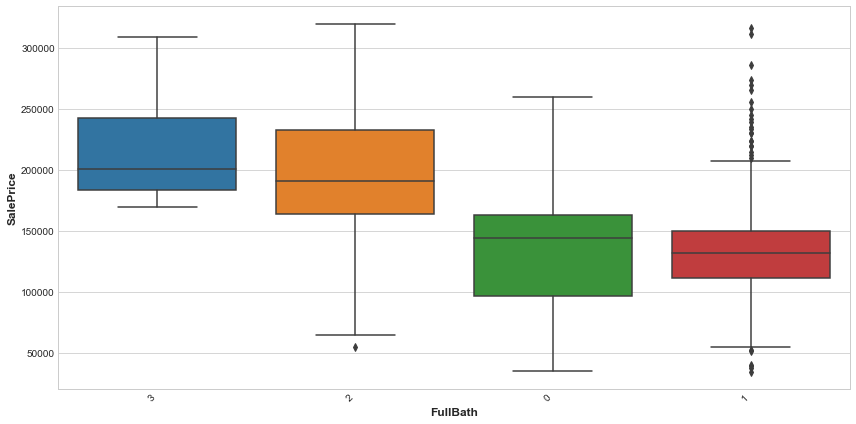

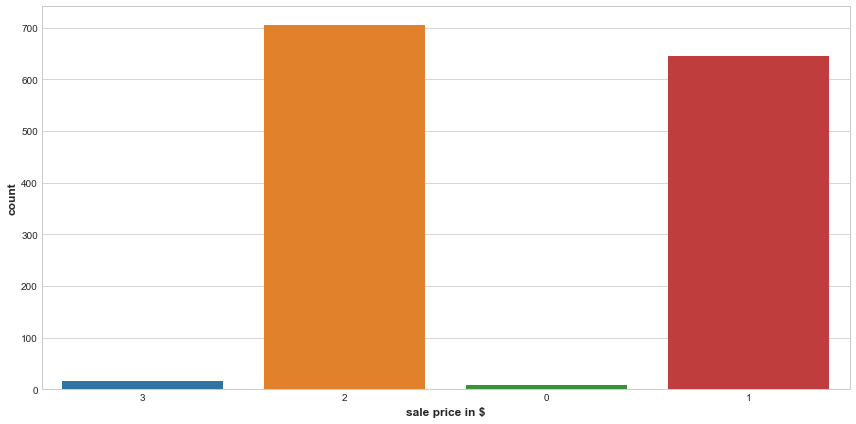



HalfBath
Number of unique values :  3


,mean,median,mean_dif_%,median_dif_%,count,count_%
HalfBath,,,,,,
1,189762.012526,181000.0,-13.318799,-14.556962,479,34.836364
2,162028.916667,159243.5,3.242371,-0.787025,12,0.872727
0,155447.000000,141000.0,7.172847,10.759494,884,64.290909


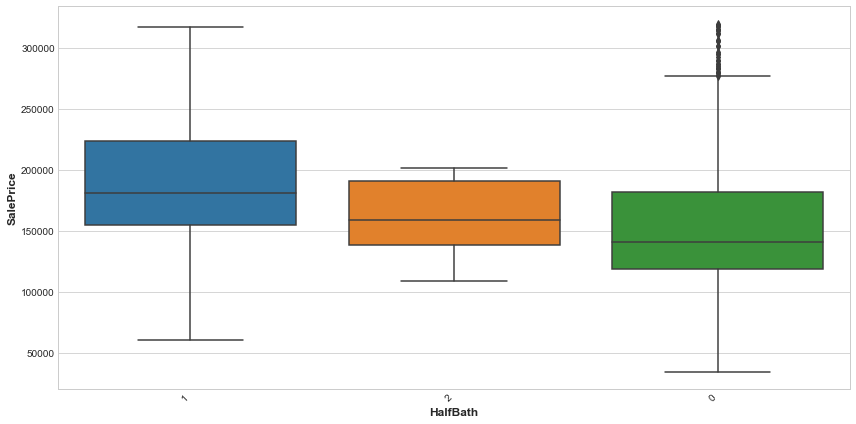

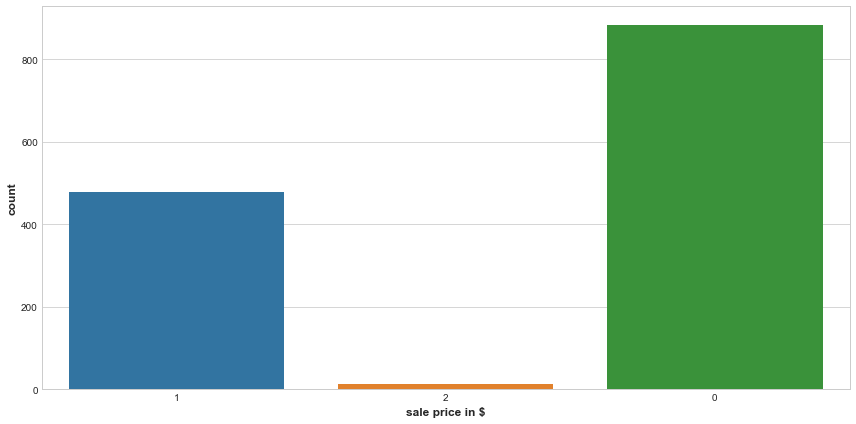



BedroomAbvGr
Number of unique values :  8


,mean,median,mean_dif_%,median_dif_%,count,count_%
BedroomAbvGr,,,,,,
8,200000.000000,200000,-19.432544,-26.582278,1,0.072727
4,186574.256831,173000,-11.415191,-9.493671,183,13.309091
3,173310.663212,165450,-3.494667,-4.715190,772,56.145455
5,173860.000000,160750,-3.822710,-1.740506,20,1.454545
0,188791.800000,145000,-12.739425,8.227848,5,0.363636


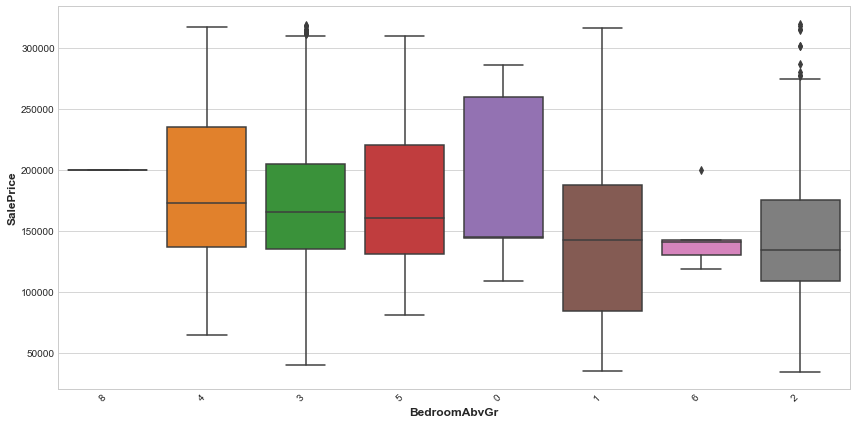

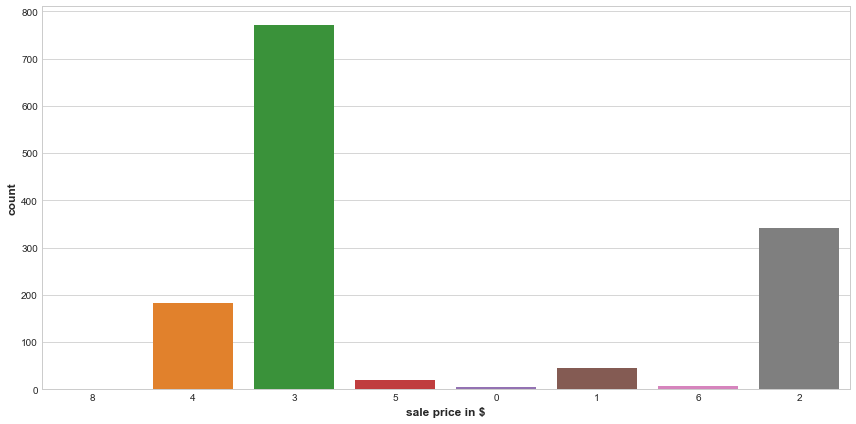



KitchenAbvGr
Number of unique values :  4


,mean,median,mean_dif_%,median_dif_%,count,count_%
KitchenAbvGr,,,,,,
1,169386.188982,160000,-1.151117,-1.265823,1307,95.054545
2,131096.153846,133900,21.714264,15.253165,65,4.727273
0,127500.000000,127500,23.861753,19.303797,1,0.072727
3,109500.000000,109500,34.610682,30.696203,2,0.145455


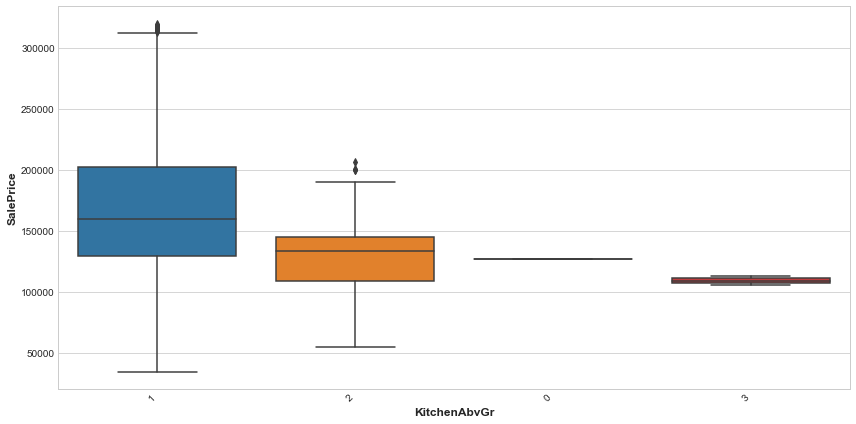

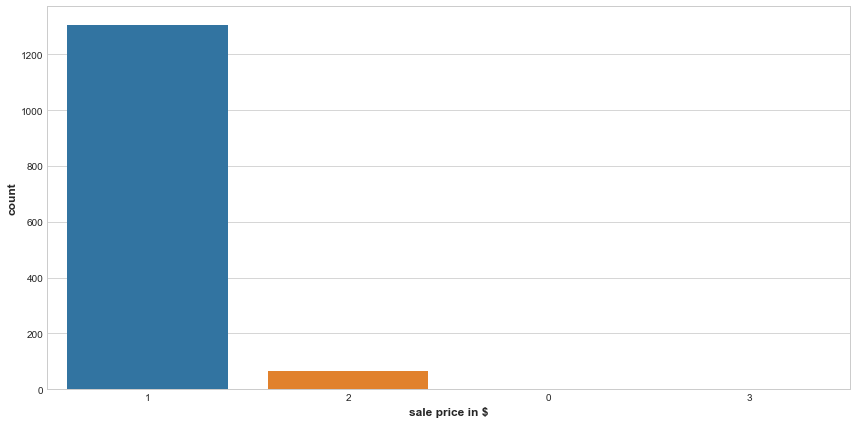



TotRmsAbvGrd
Number of unique values :  12


,mean,median,mean_dif_%,median_dif_%,count,count_%
TotRmsAbvGrd,,,,,,
9,223274.533333,239500,-33.331228,-51.582278,60,4.363636
10,207302.666667,207200,-23.793424,-31.139241,30,2.181818
14,200000.000000,200000,-19.432544,-26.582278,1,0.072727
12,186844.125000,193500,-11.576346,-22.468354,8,0.581818
11,203225.222222,191000,-21.358526,-20.886076,9,0.654545


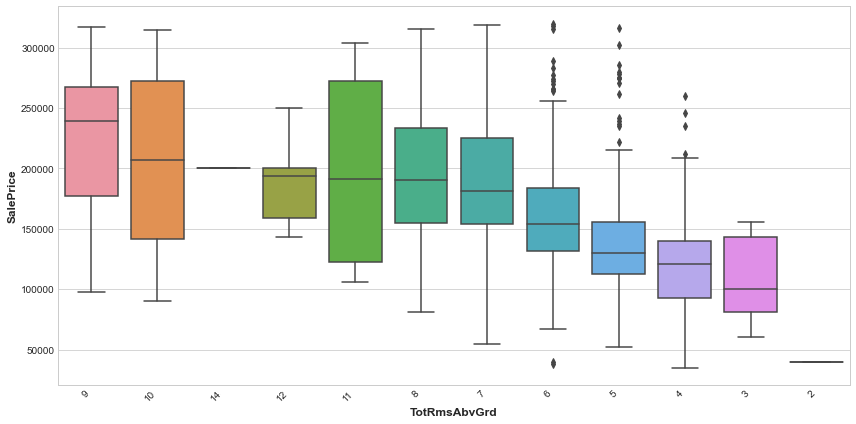

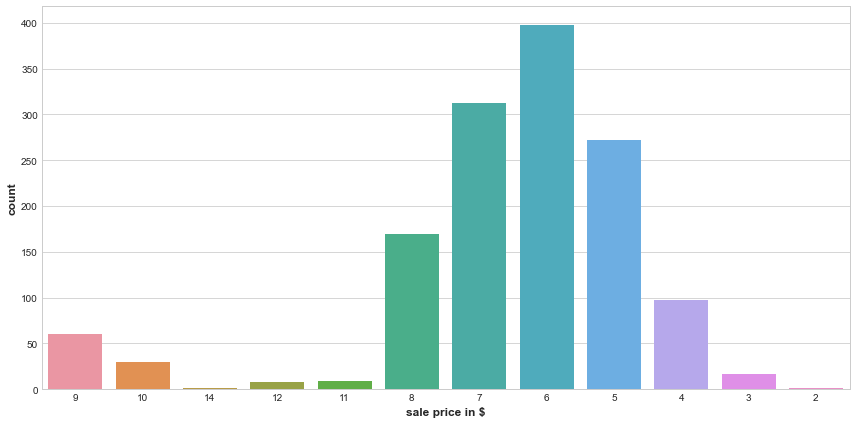



Fireplaces
Number of unique values :  4


,mean,median,mean_dif_%,median_dif_%,count,count_%
Fireplaces,,,,,,
3,185000.000000,190000,-10.475103,-20.253165,3,0.218182
2,197376.287234,184300,-17.865760,-16.645570,94,6.836364
1,193727.200000,183350,-15.686662,-16.044304,590,42.909091
0,140767.558140,135000,15.938862,14.556962,688,50.036364


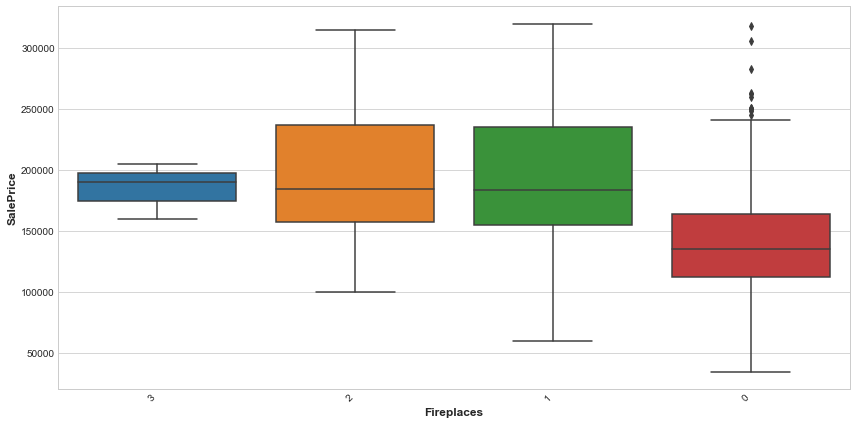

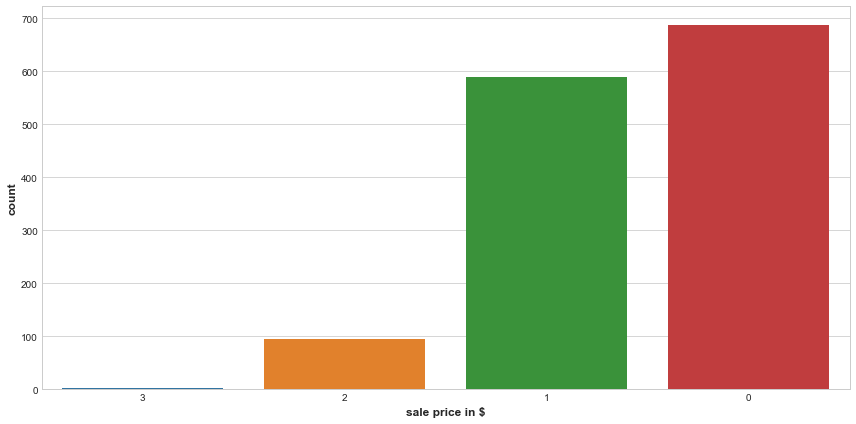



GarageCars
Number of unique values :  5


,mean,median,mean_dif_%,median_dif_%,count,count_%
GarageCars,,,,,,
3,247626.705357,255250.0,-47.873437,-61.550633,112,8.145455
4,192655.800000,200000.0,-15.046861,-26.582278,5,0.363636
2,180586.969059,176458.5,-7.839806,-11.682595,808,58.763636
1,128116.688347,128000.0,23.493490,18.987342,369,26.836364
0,103317.283951,100000.0,38.302770,36.708861,81,5.890909


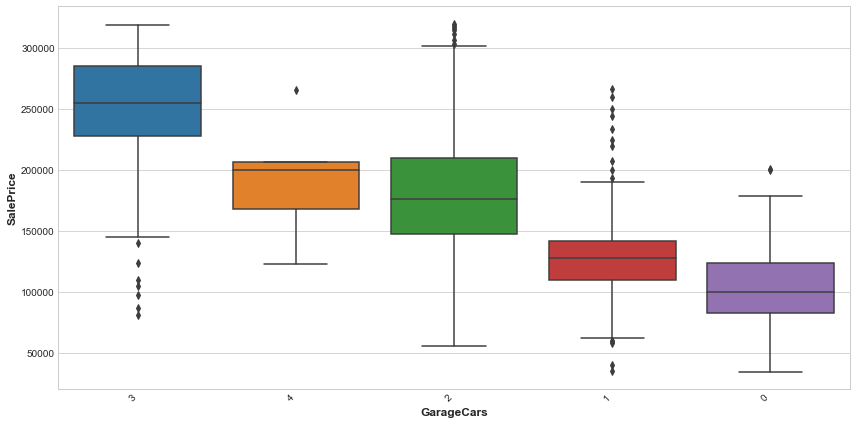

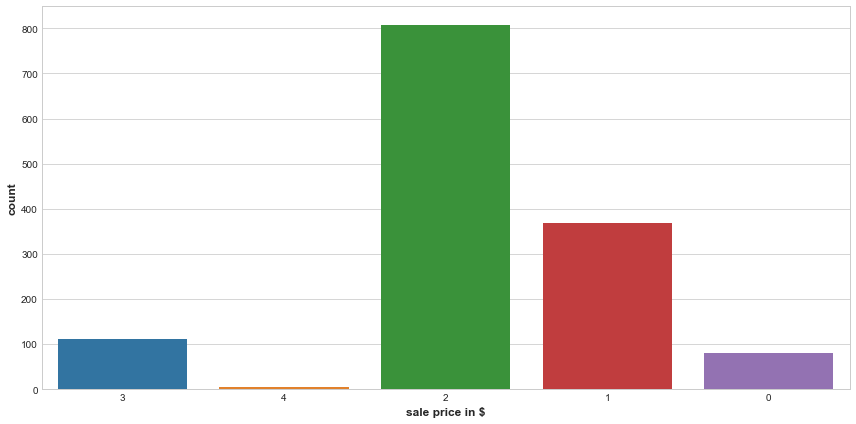



MoSold
Number of unique values :  12


,mean,median,mean_dif_%,median_dif_%,count,count_%
MoSold,,,,,,
9,182346.406780,179665,-8.890476,-13.712025,59,4.290909
12,183872.741379,175500,-9.801946,-11.075949,58,4.218182
2,175095.372549,173000,-4.560429,-9.493671,51,3.709091
8,178275.618644,170750,-6.459553,-8.069620,118,8.581818
11,172258.591549,163000,-2.866409,-3.164557,71,5.163636


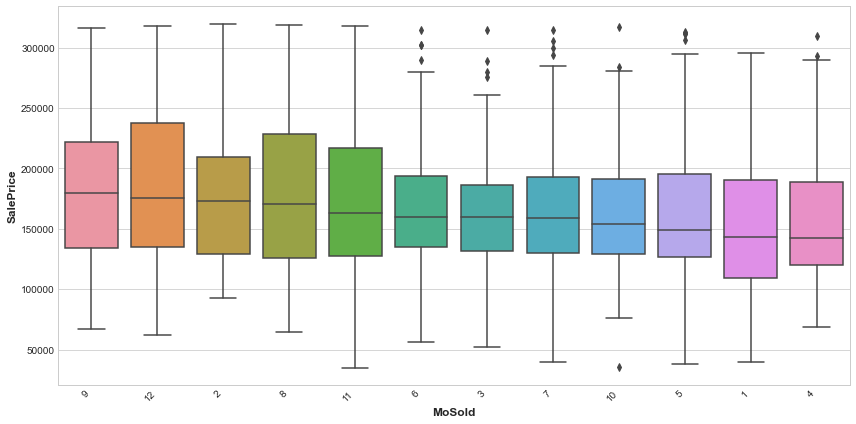

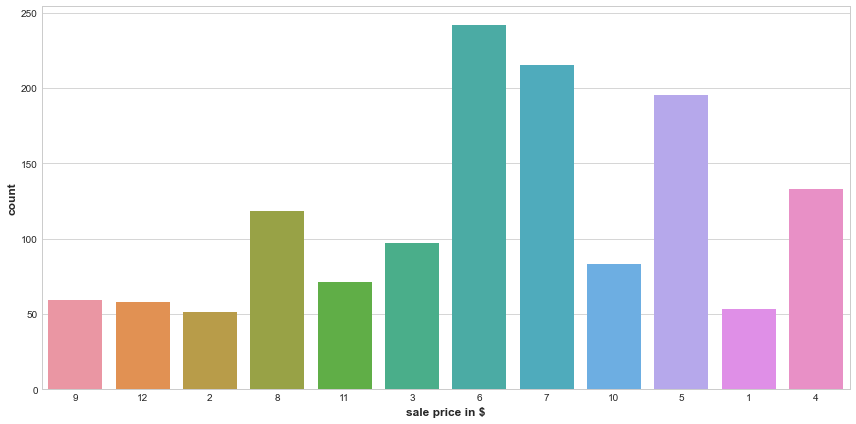



YrSold
Number of unique values :  5


,mean,median,mean_dif_%,median_dif_%,count,count_%
YrSold,,,,,,
2008,166689.135417,160000,0.459463,-1.265823,288,20.945455
2007,172791.631410,159750,-3.184721,-1.107595,312,22.690909
2006,168499.162712,159500,-0.621418,-0.949367,295,21.454545
2009,164417.221519,157750,1.816165,0.158228,316,22.981818
2010,162652.097561,152500,2.870231,3.481013,164,11.927273


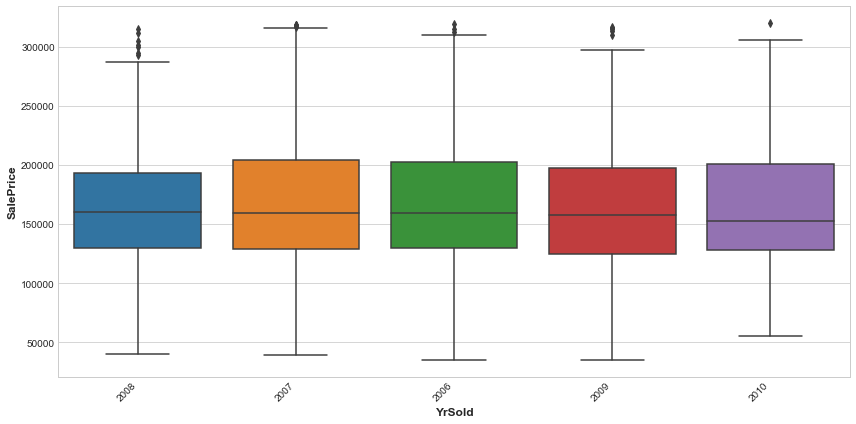

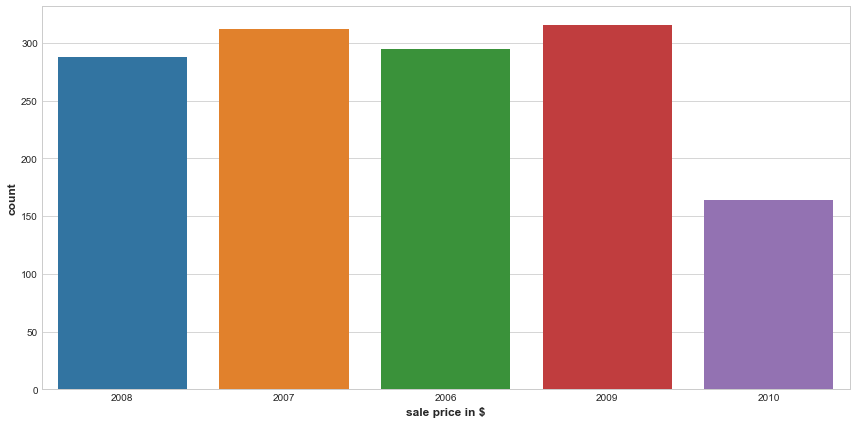

In [18]:
plot_categorical_and_median(df=train,thresh=320000,categorical=num_cat,target_col='SalePrice')

### from the boxplot

* MSSubClass: Identifies the type of dwelling involved in the sale.

    * 36% '20'(1-STORY 1946 & NEWER ALL STYLES),18% '60'(2-STORY 1946 & NEWER),10% '50'(1-1/2 STORY FINISHED ALL AGES);
    
       6% '120'(1-STORYPUD(Planned Unit Development)-1946 & NEWER) ,
       
       5% ['30'(1-STORY 1945&OLDER) ,'160'(2-STORY PUD - 1946 & NEWER)]
       
       4% ['70'(2-STORY 1945 & OLDER) , '80' (SPLIT OR MULTI-LEVEL) '90'(DUPLEX - ALL STYLES AND AGES)]
       
       6 rare values
       
    * Distinct variation in median prices 60>120>80, and (70,20,75,160,40,85)

    * [1 story, 2 story ,Duplex,others],[<1946,all ages],[finished,unfinised], [finished_age]
    
* OverallQual: Rates the overall material and finish of the house

    * 
    
    * Distinct variation in median prices for OverallQual category except for the '10' have 3 counts..maybe we should look further
        * Found out that because we cut the train data 1.e <32000 most of them overall quality was 10 with very high median price
        * test data have 13 inputs with OQ == 10 ;
        
        
    * The higher the overall quality the more expensive the house is
    
    * We can mean encode this category
    
* OverallCond: Rates the overall condition of the house 

    * 54% 5(Average), 18% (slightly above avg), 15%(good),5%(v.good),4%(slightly belove avg) and 5 rare values

    * Distinct variation in median prices for OverallCond category 5,(9,6,7,8) and (4,3,2,1)
    
    * average ,below average and above average

    * Surprisingly, homes with average Overall condition have higher median price to homes with high overall condition
    
* BsmtFullBath: Basement full bathrooms 

    * 60% 0, 38% 1 i.e most basement have no bathrooms.

    * No Distinct variation in median prices for BsmtFullBath category, 1,2 >0

    * homes with 1 bathroom in the basement have the highest median price
    
    * bathrooms = concat with [BsmtFullBath,] i.e sum
    
* FullBath: Full bathrooms above grade

    * 51% 2 ,46% 1 ,1% 3 ,0.6% 0
    
    * Distinct variation in median prices for FullBath category

    * The more the number of full bathrooms the more expensive the house is.with 3 fullbath having highest median price
    
    * 3>2 and far greater than 0>1
    
    * 2 or more bathrooms
    
    * bathrooms = concat with [BsmtFullBath,FullBath,] i.e sum
    

* HalfBath: Half baths above grade

    * 64% 0 , 34% 1
    
    * Distinct variation in median prices i.e half bath(one or more) and no halfbaths
    
    * bathrooms = concat with [BsmtFullBath,FullBath, 0.5(HalfBath)] i.e sum
    
* BedroomAbvGr: Bedroom: Bedrooms above grade (does NOT include basement bedrooms)

    * 55% 3 , 24% 2,14% 4,3% 1 , and 4 rare values
    
    * No Distinct variation in median prices for BsmtFullBath category
    
    * grouping: more than 2 ,(1 and 2),0
    
    * bed and baths = concat with [[bathrooms] , TotRmsAbvGrd]
    
* Kitchen: Kitchens above grade

    * 91% 1 ,4% 2

    * No Distinct variation in median prices for KitchenAbvGr category

    * vast majority of the homes have 1 kitchen similar with the highest median price
    
    * grouping : no grouping
    * bed and baths and kitchen = concat with [[bathrooms] , TotRmsAbvGrd ,KitchenAbvGr]
    
* TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)

    * 29% 6,23% 7, 20% 5,12% 8 ,7% 4,4% 9, and 6 rare values
    
    * distinct variation in median prices
    
    * grouping: 7 or more ,6,5,4,3
    
    * totalrooms + baths = concat with [[bathrooms] , TotRmsAbvGrd]

* Fireplaces: Number of fireplaces

    * 50% 0, 42% 1 ,6% 2 and one rare value
    
    * grouping: Yes(>0) and No(0)
    
* GarageCars: Size of garage in car capacity

    * 59% 2 ,27% 1 ,8% 3 ,5% 0 and one rare value
    
    * Distict variation in median prices
    
    * grouping : 2 or more ,1 and 0
    
*  MoSold

    * 17.6% 6(JUne),15.6% 7(July),14.1% 5(May),9.6% 4(April),8.5% 8(August),7.% 3(March),     
    * slight distinction in median prices
    
* YrSold

    * well distributed
    * no distinct variation in median prices
    

In [10]:
train32 = train[target<320000]
#print(train32.shape)

(1375, 81)


Normal     83.709091
Abnorml     7.200000
Partial     6.545455
Family      1.454545
Alloca      0.800000
AdjLand     0.290909
Name: SaleCondition, dtype: float64

In [93]:
(train['OverallQual'].value_counts()/train.shape[0])*100

5     27.191781
6     25.616438
7     21.849315
8     11.506849
4      7.945205
9      2.945205
3      1.369863
10     1.232877
2      0.205479
1      0.136986
Name: OverallQual, dtype: float64

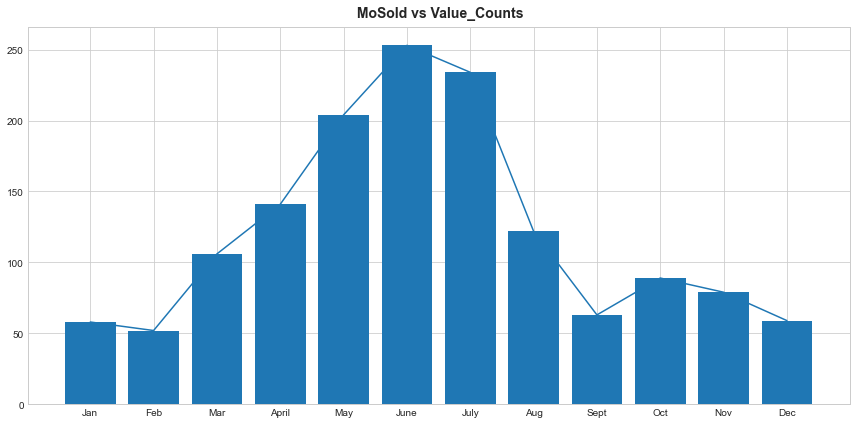

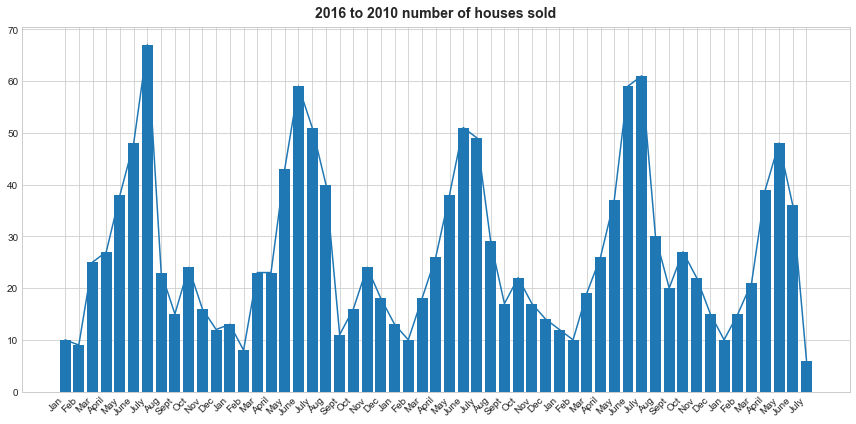

In [91]:
def plot_MoSold_and_YrSold(df):
    plt.title(" MoSold vs Value_Counts")
    plt.plot(np.arange(1,13),df.groupby('MoSold')['MoSold'].agg('count').values)#.sort_values()
    plt.bar(np.arange(1,13),df.groupby('MoSold')['MoSold'].agg('count').values)#.sort_values()
    ticks = list(range(1,13)) # points on the x axis where you want the label to appear
    labels = "Jan Feb Mar April May June July Aug Sept Oct Nov Dec ".split()
    plt.xticks(ticks, labels);
    plt.show()
    
    print("\n \n")
    
    years_present = df.YrSold.nunique()
    labels2 = labels*years_present
    Yr_and_Mo = df.groupby(['YrSold','MoSold'])['MoSold'].agg('count')
    Yr_and_Mo_val = Yr_and_Mo.values
    idx_tpl = Yr_and_Mo.index.tolist()
    No_Yr_Mo = len(idx_tpl)
    plt.plot(np.arange(1,(No_Yr_Mo+1)),Yr_and_Mo_val)
    plt.bar(np.arange(1,(No_Yr_Mo+1)),Yr_and_Mo_val)
    ticks2 = list(range(1,(No_Yr_Mo+1))) # points on the x axis where you want the label to appear
    #labels2 = labels2.split()
    plt.xticks(ticks2, labels2);
    ax = plt.gca()
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    plt.title("2016 to 2010 number of houses sold")
    plt.show()
    
plot_MoSold_and_YrSold(train)    

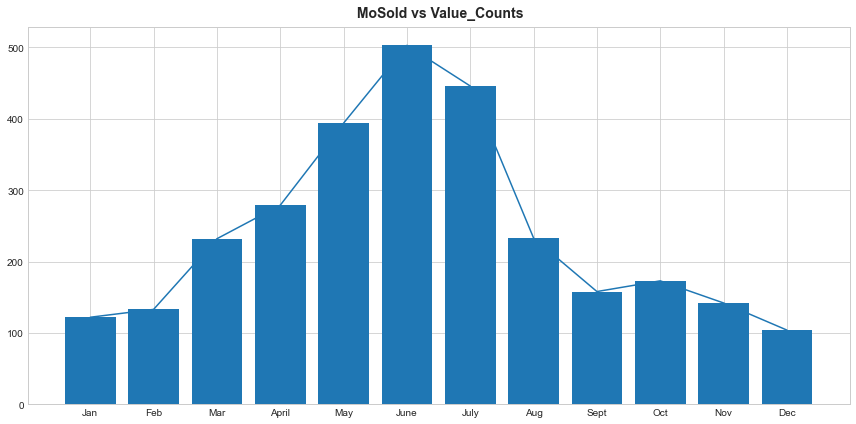

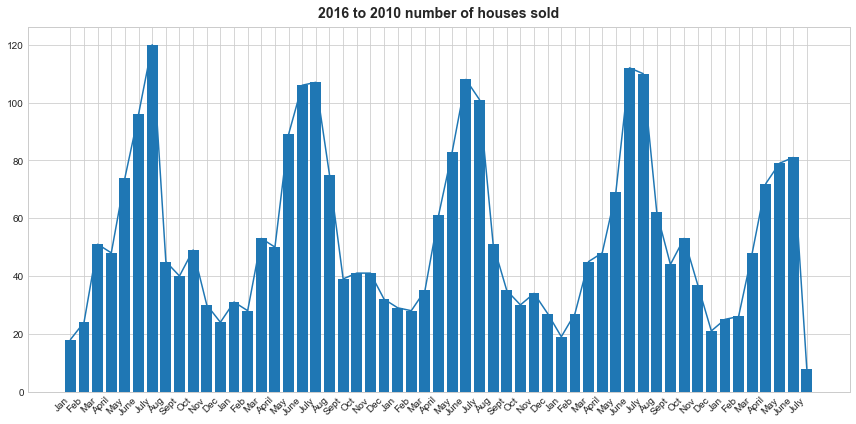

In [92]:
plot_MoSold_and_YrSold(merged)

In [25]:
(train['BedroomAbvGr'].value_counts()/train.shape[0])*100

3    55.068493
2    24.520548
4    14.589041
1     3.424658
5     1.438356
6     0.479452
0     0.410959
8     0.068493
Name: BedroomAbvGr, dtype: float64

In [27]:
train[['BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd']]

,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd
0,3,1,8
1,3,1,6
2,3,1,6
3,3,1,7
4,4,1,9
...,...,...,...
1455,3,1,7
1456,3,1,7
1457,4,1,9
1458,2,1,5


In [19]:
train32[train32['OverallQual']==10]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
523,524,60,RL,130.0,40094,Pave,NaN,IR1,Bnk,AllPub,...,0,NaN,NaN,NaN,0,10,2007,New,Partial,184750
1298,1299,60,RL,313.0,63887,Pave,NaN,IR3,Bnk,AllPub,...,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000
1442,1443,60,FV,85.0,11003,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2009,WD,Normal,310000


In [21]:
train[train['OverallQual']==10].describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,18.000000,18.000000,17.000000,18.000000,18.0,18.000000,18.000000,18.000000,17.000000,18.000000,...,18.000000,18.000000,18.000000,18.0,18.000000,18.000000,18.0,18.000000,18.000000,18.000000
mean,763.500000,46.111111,114.882353,19869.944444,10.0,5.500000,1991.888889,2003.833333,539.235294,1386.666667,...,206.500000,156.500000,2.055556,0.0,32.222222,57.500000,0.0,6.166667,2007.666667,438588.388889
std,440.552494,21.932755,55.286619,13697.654292,0.0,1.294786,36.467373,5.447611,438.513758,1274.204158,...,108.608986,140.259109,8.720984,0.0,102.415277,167.843152,0.0,2.706202,1.188177,159785.491058
min,59.000000,20.000000,66.000000,11003.000000,10.0,5.000000,1892.000000,1993.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,1.000000,2006.000000,160000.000000
25%,459.750000,20.000000,94.000000,12723.500000,10.0,5.000000,1997.250000,2000.500000,200.000000,866.750000,...,168.750000,52.500000,0.000000,0.0,0.000000,0.000000,0.0,4.500000,2007.000000,349375.000000
50%,642.000000,60.000000,103.000000,13786.500000,10.0,5.000000,2006.000000,2006.500000,420.000000,1362.000000,...,202.000000,91.500000,0.000000,0.0,0.000000,0.000000,0.0,6.500000,2008.000000,432390.000000
75%,1179.750000,60.000000,114.000000,20057.000000,10.0,5.000000,2007.750000,2008.000000,816.000000,1590.750000,...,240.000000,252.250000,0.000000,0.0,0.000000,0.000000,0.0,7.750000,2009.000000,472875.000000
max,1443.000000,75.000000,313.000000,63887.000000,10.0,9.000000,2009.000000,2009.000000,1378.000000,5644.000000,...,382.000000,502.000000,37.000000,0.0,410.000000,555.000000,0.0,10.000000,2009.000000,755000.000000


In [22]:
test[test['OverallQual']==10].describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
count,13.000000,13.0,13.000000,13.000000,13.0,13.0,13.000000,13.000000,13.000000,13.000000,...,13.000000,13.000000,13.000000,13.0,13.0,13.000000,13.000000,13.000000,13.000000,13.000000
mean,2225.384615,40.0,87.769231,15579.769231,10.0,5.0,2005.230769,2005.769231,583.538462,1458.076923,...,918.769231,202.000000,107.153846,0.0,0.0,73.769231,11.076923,1307.692308,6.615385,2007.384615
std,338.369753,40.0,24.549792,7907.253981,0.0,0.0,2.554533,2.454718,326.093191,1106.689844,...,170.929398,140.906588,131.664249,0.0,0.0,88.589083,39.938414,4714.951668,3.254189,0.960769
min,1664.000000,20.0,36.000000,3951.000000,10.0,5.0,1998.000000,1999.000000,0.000000,0.000000,...,724.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,2.000000,2006.000000
25%,1975.000000,20.0,81.000000,12633.000000,10.0,5.0,2005.000000,2006.000000,400.000000,1082.000000,...,762.000000,154.000000,36.000000,0.0,0.0,0.000000,0.000000,0.000000,3.000000,2007.000000
50%,2292.000000,20.0,96.000000,13870.000000,10.0,5.0,2006.000000,2006.000000,662.000000,1430.000000,...,878.000000,192.000000,52.000000,0.0,0.0,0.000000,0.000000,0.000000,8.000000,2007.000000
75%,2550.000000,60.0,105.000000,16052.000000,10.0,5.0,2007.000000,2007.000000,734.000000,2146.000000,...,1092.000000,240.000000,90.000000,0.0,0.0,174.000000,0.000000,0.000000,9.000000,2008.000000
max,2631.000000,160.0,128.000000,39290.000000,10.0,5.0,2008.000000,2009.000000,1224.000000,4010.000000,...,1174.000000,546.000000,484.000000,0.0,0.0,216.000000,144.000000,17000.000000,10.000000,2009.000000


In [149]:
def plot_distribution_of_cats_with_target(df,thresh,categorical,target_col):
    df_def = df.copy()
    df_def = df_def[df_def[target_col]<thresh]# outlier removal
    df_def.fillna(0,inplace=True)
    for c in num_cat:
        print(c)
        plt.rc("figure",figsize=(12,6))
        df_def.loc[(df_def[target_col] <= thresh)].pivot(columns = c ,values = target_col ).plot.hist(stacked = True,bins=100)
        sns.despine()
        plt.show()
        plt.xlabel('sale price in $');
        print()
        print()

MSSubClass


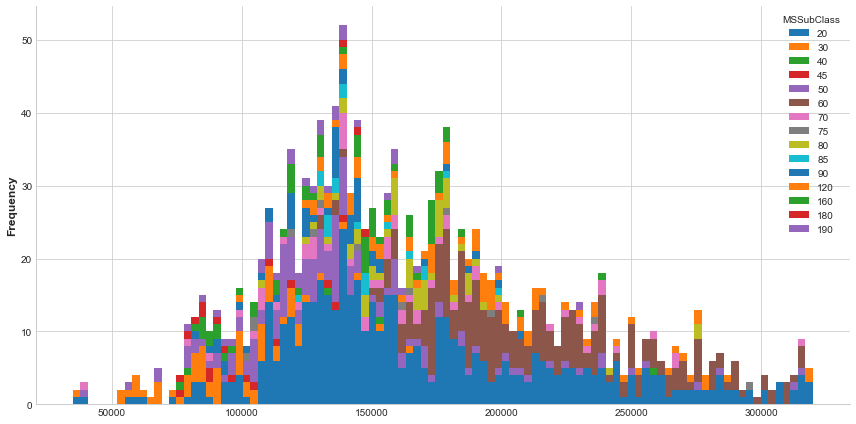



OverallQual


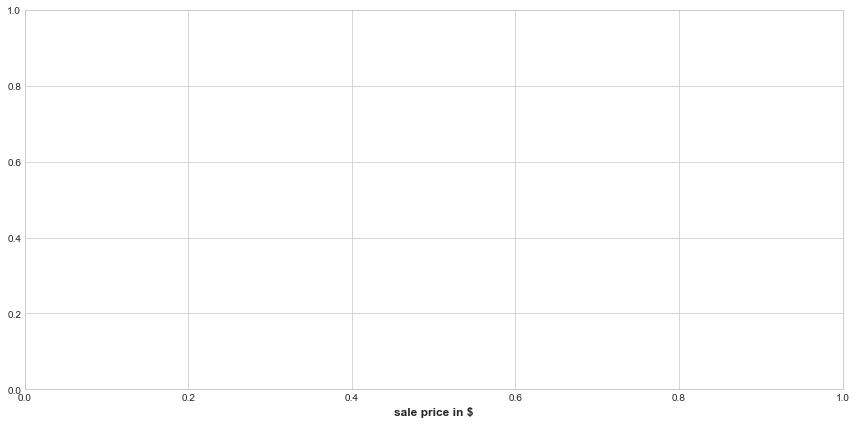

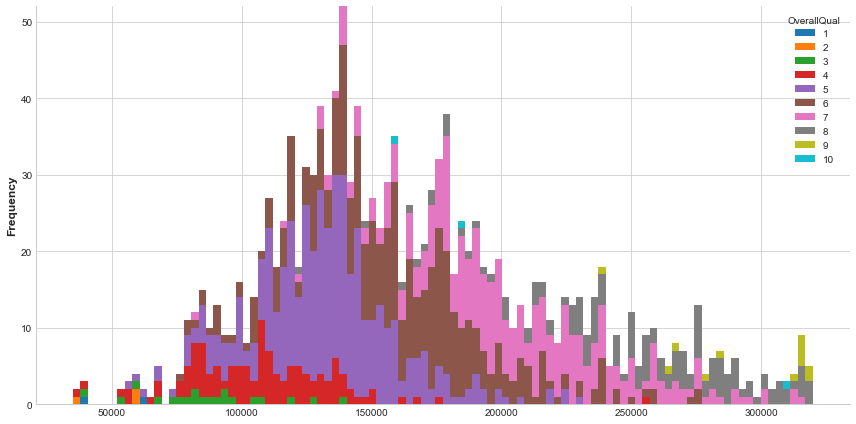



OverallCond


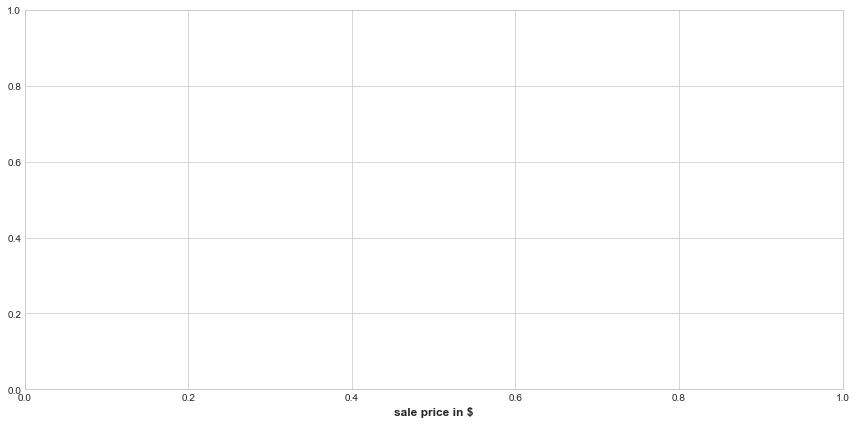

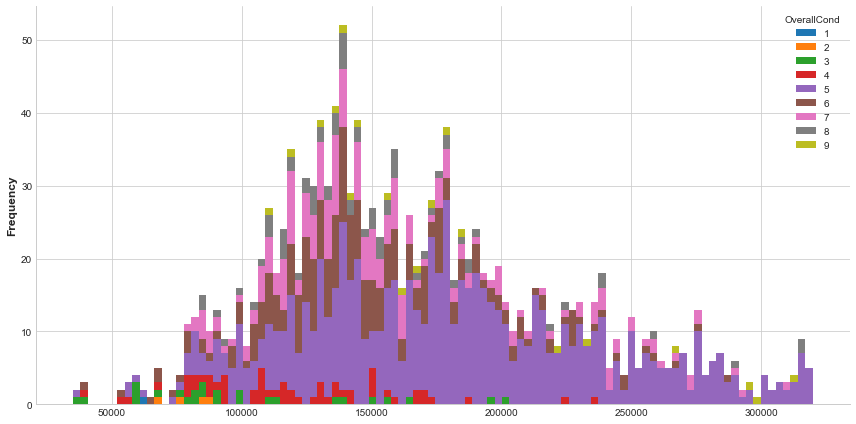



BsmtFullBath


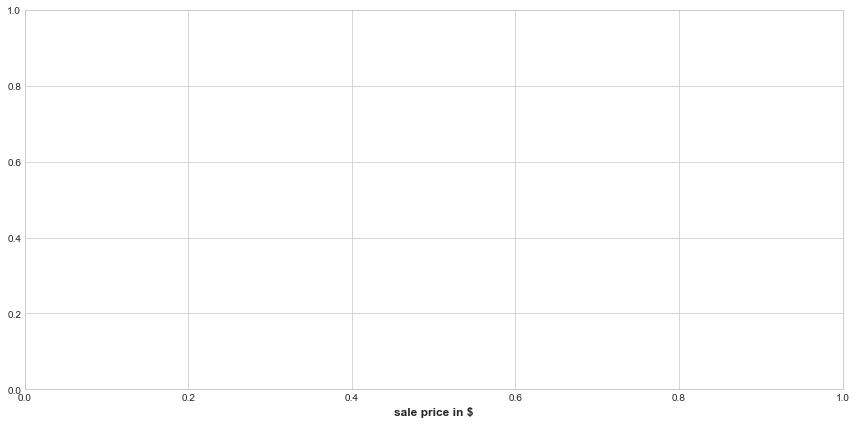

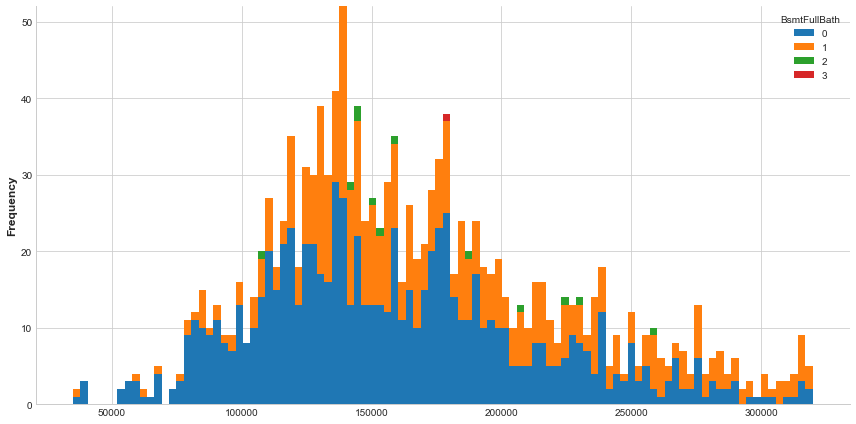



FullBath


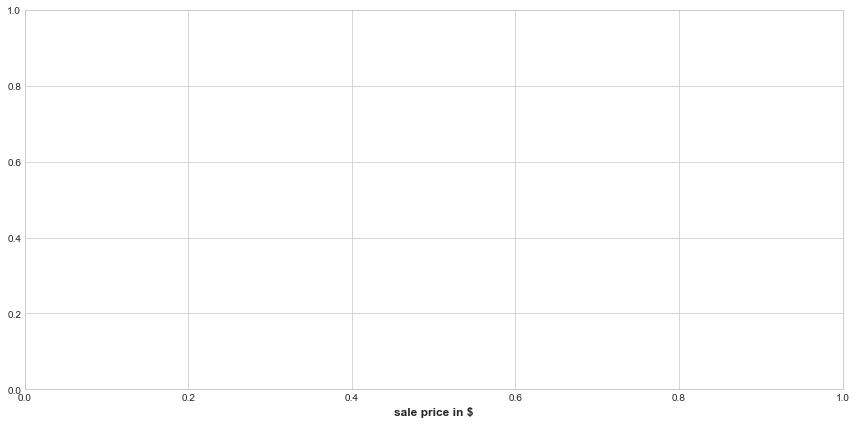

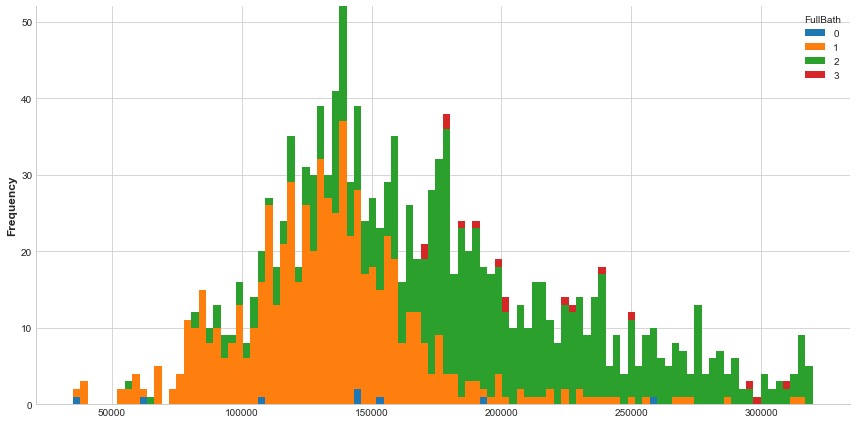



HalfBath


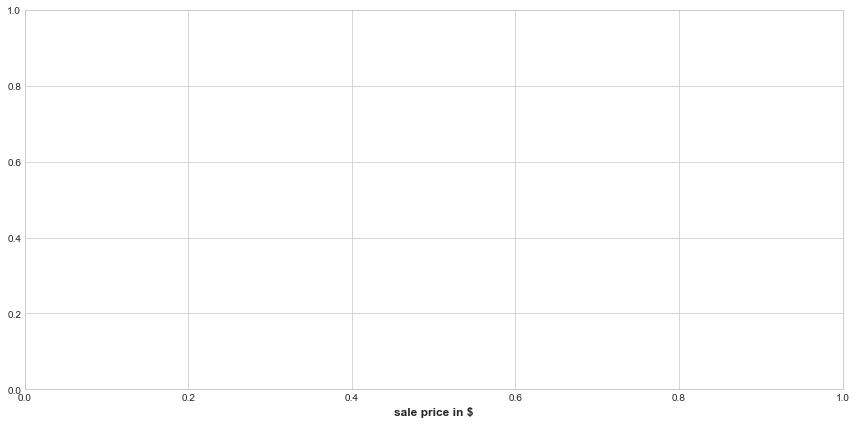

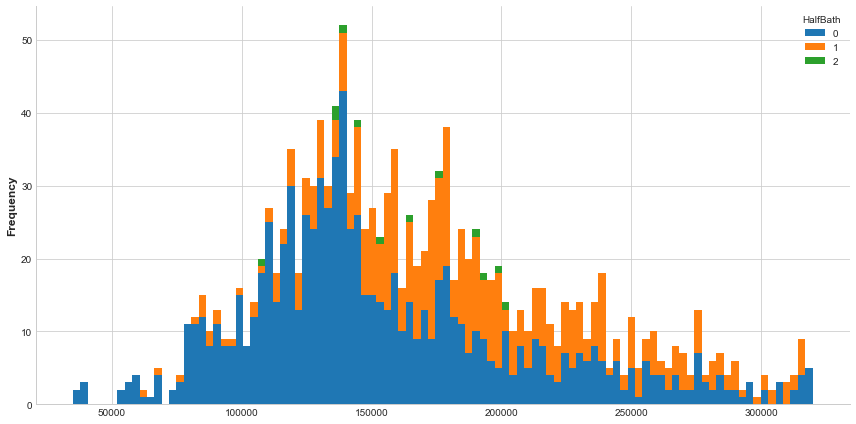



BedroomAbvGr


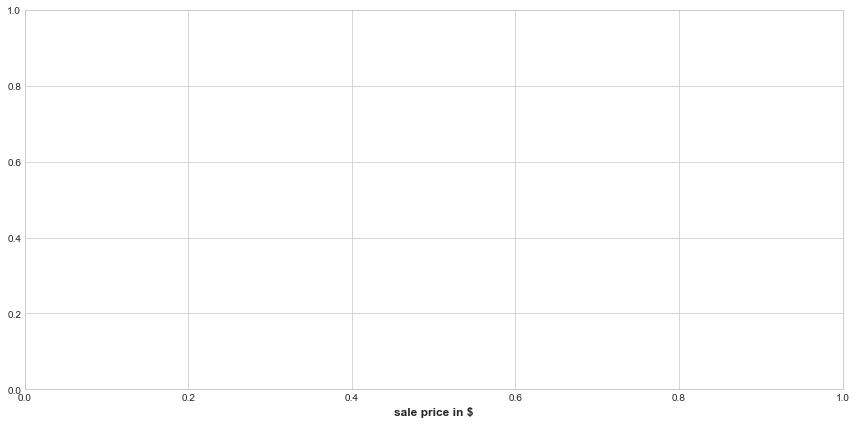

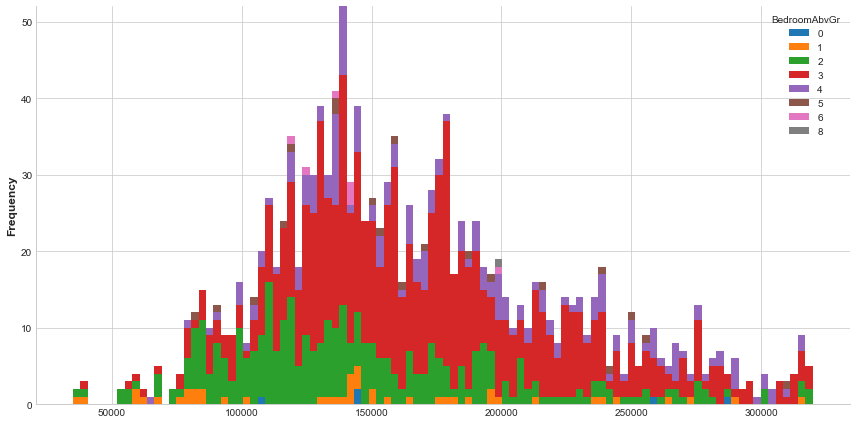



KitchenAbvGr


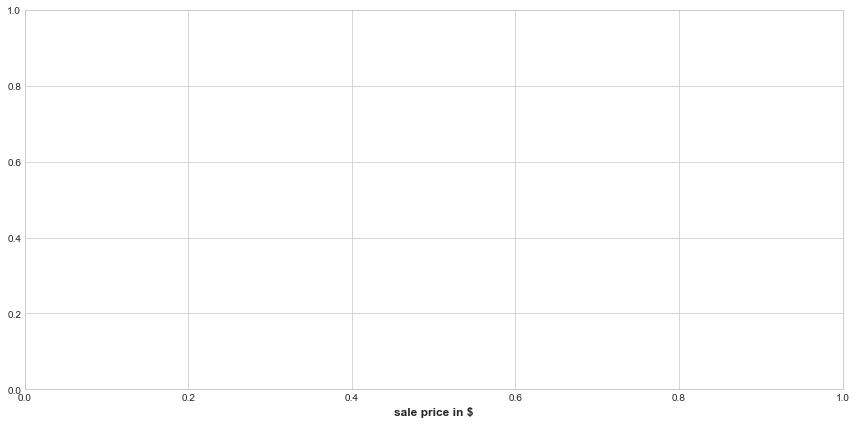

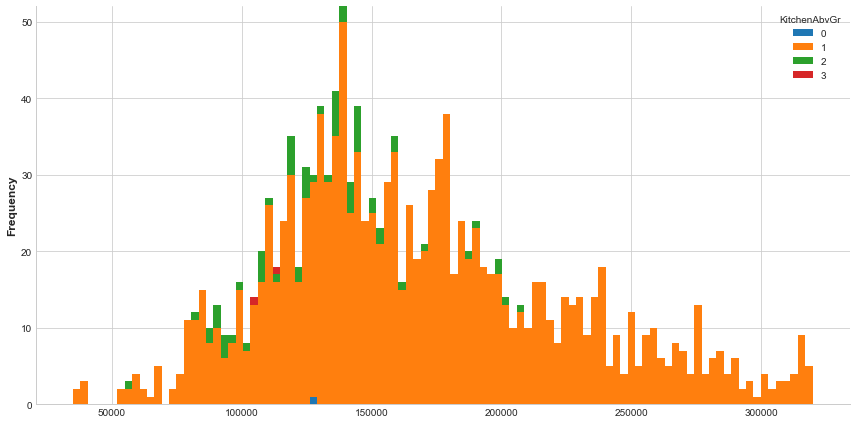



TotRmsAbvGrd


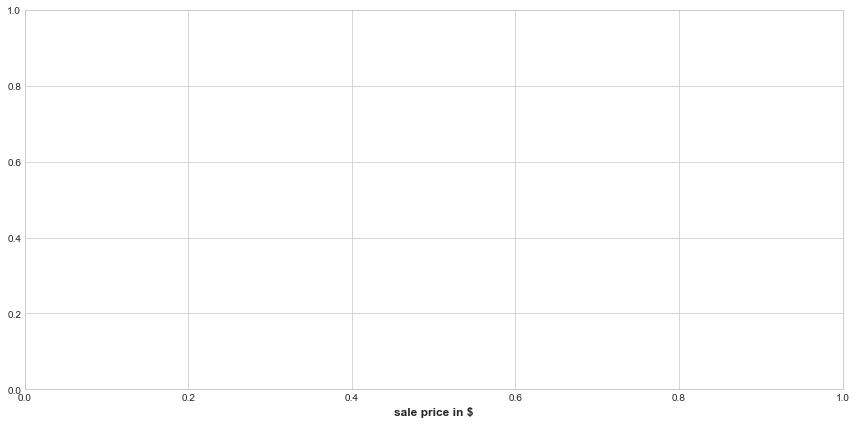

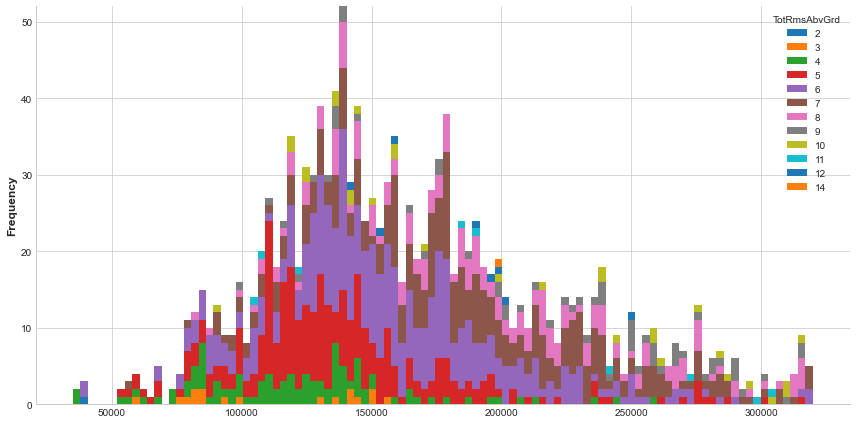



Fireplaces


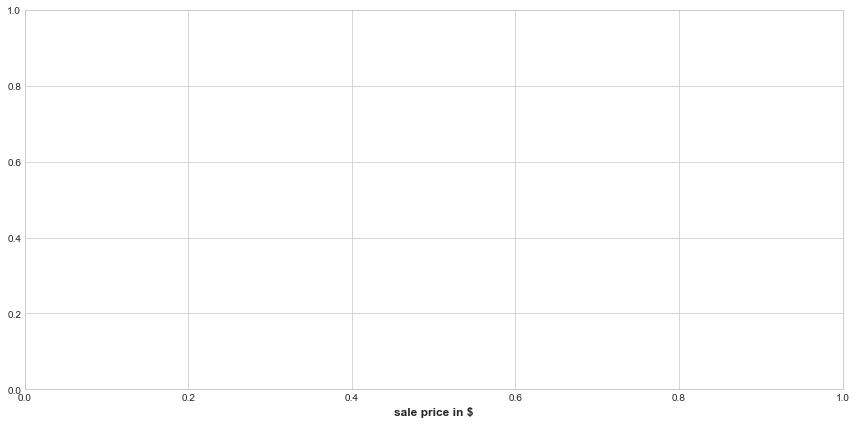

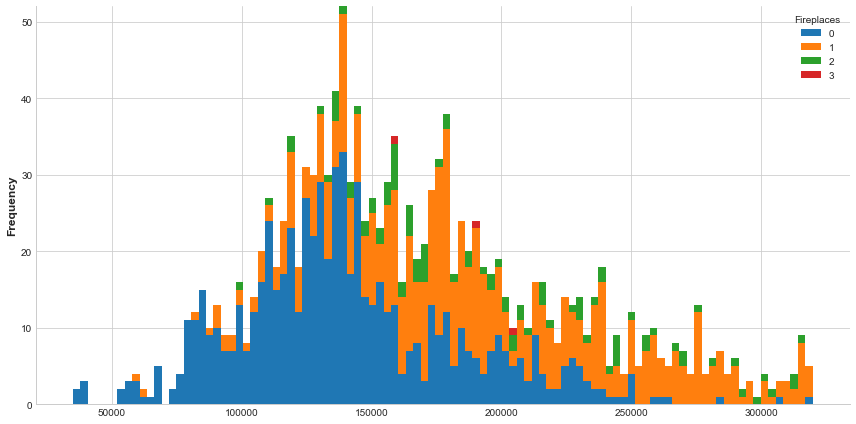



GarageCars


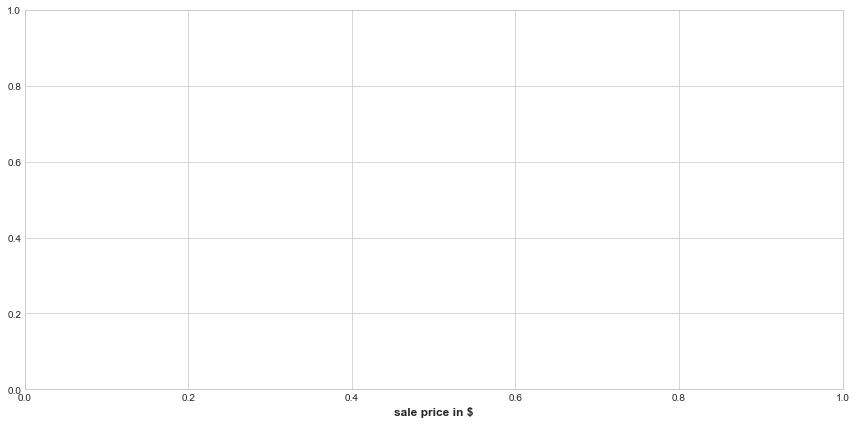

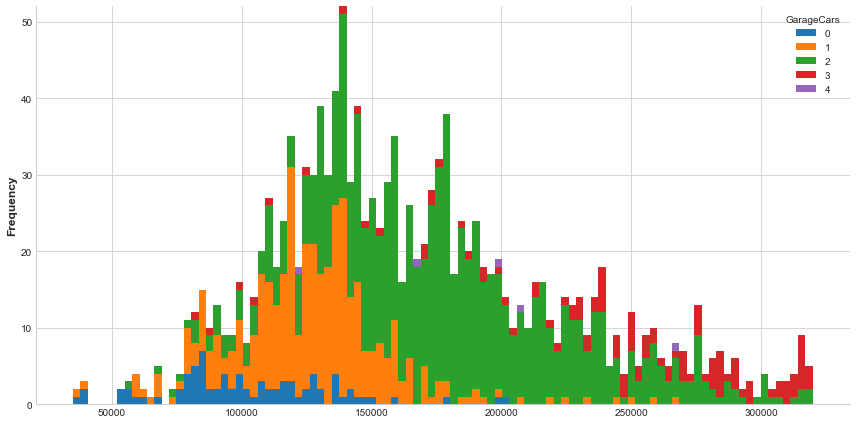



MoSold


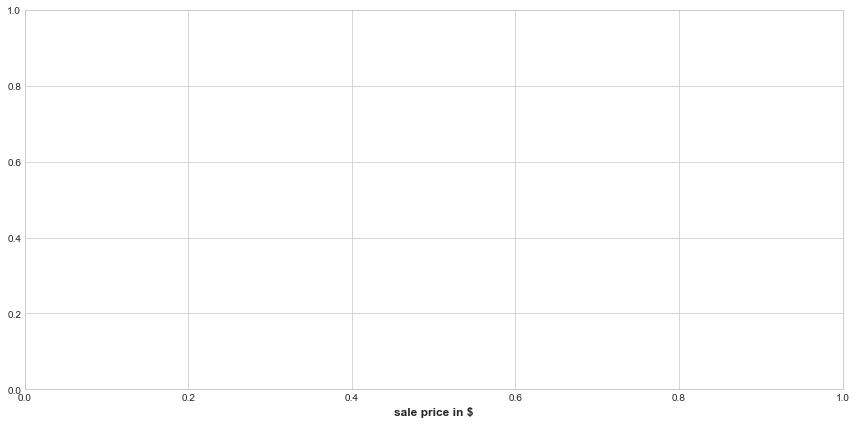

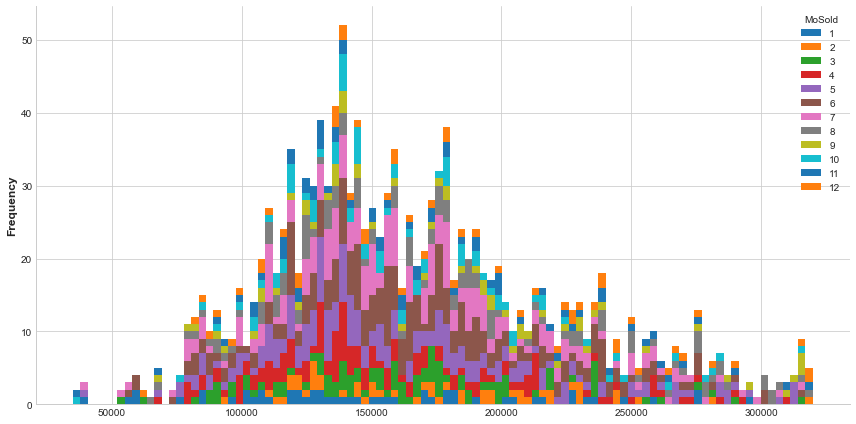



YrSold


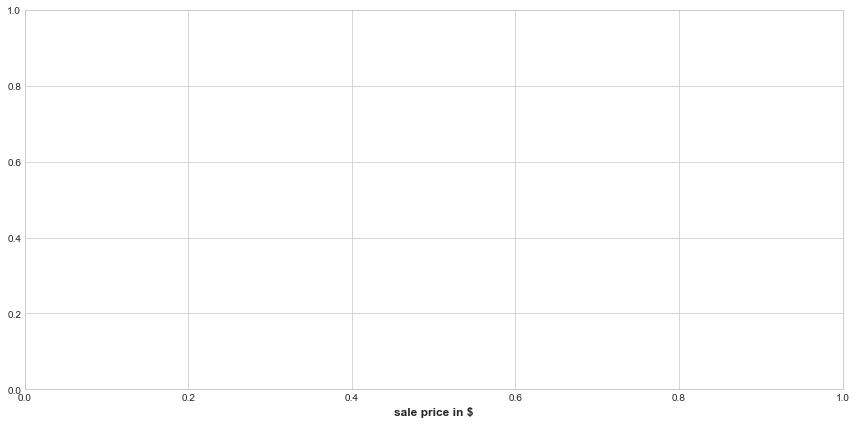

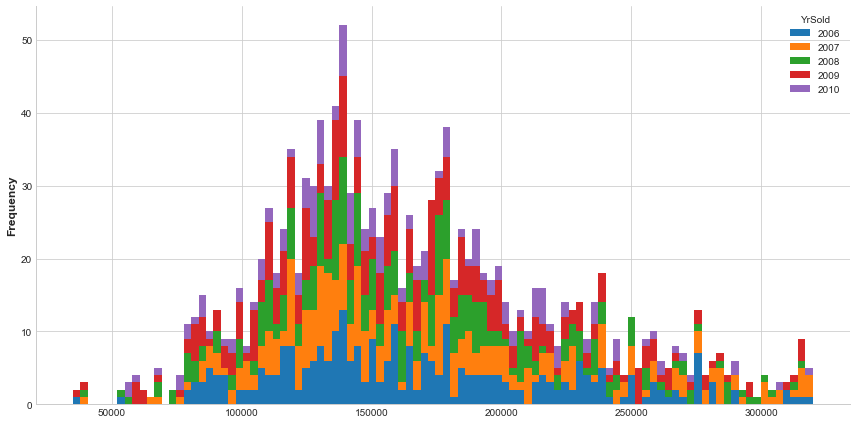



SalePrice


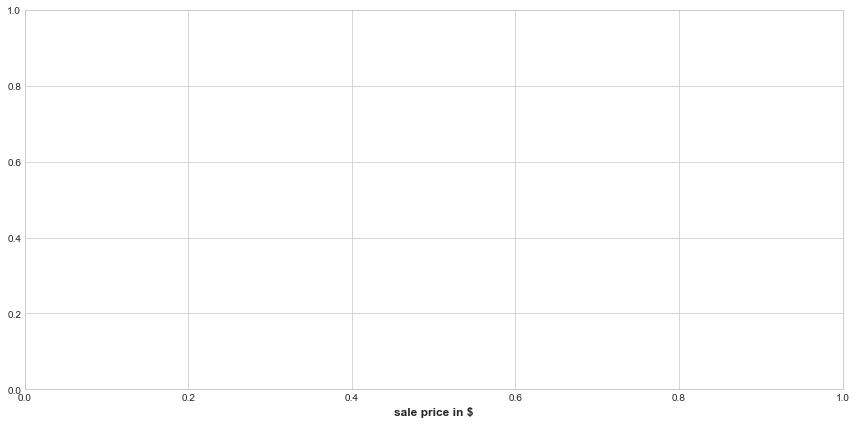

C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  fig.canvas.print_figure(bytes_io, **kw)


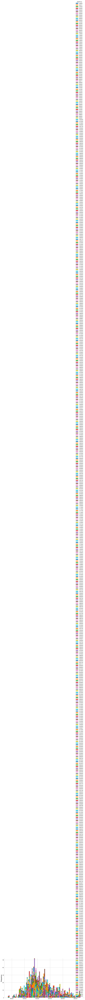

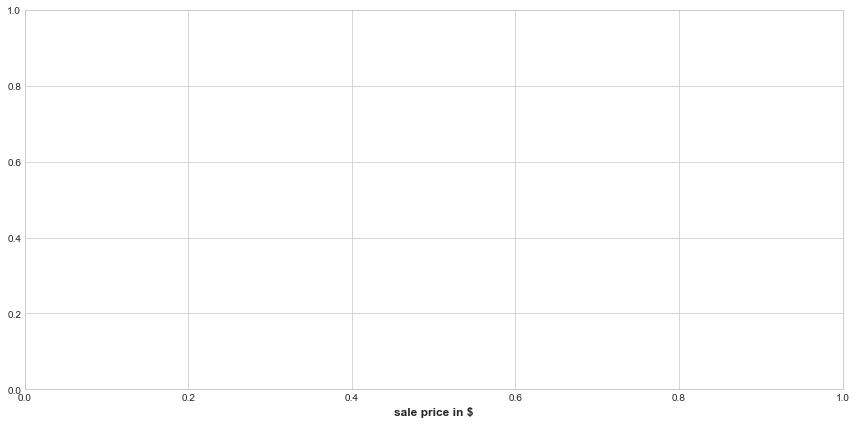

In [150]:
plot_distribution_of_cats_with_target(df=train,thresh=320000,categorical=num_cat,target_col='SalePrice')

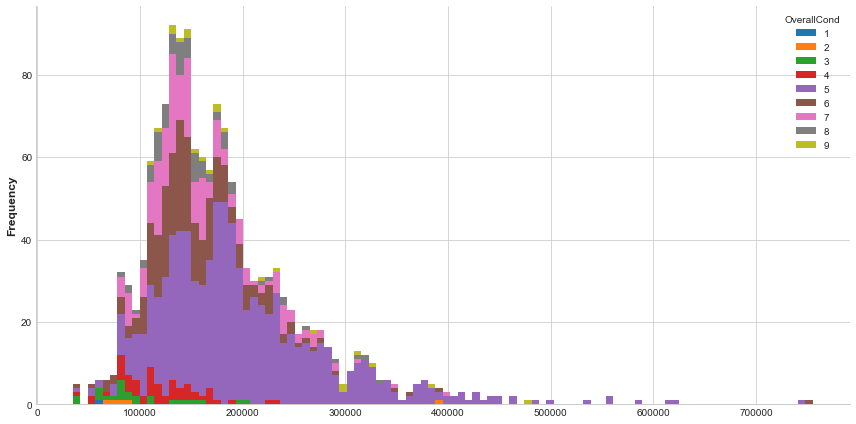

In [151]:
#plt.figure(figsize=(12,6))
plt.rc("figure",figsize=(12,6))
train.pivot(columns = 'OverallCond' ,values = 'SalePrice' ).plot.hist(stacked = True,bins=100)
sns.despine()
#ax = plt.gca()

### Vast majority homes are in average overall condition

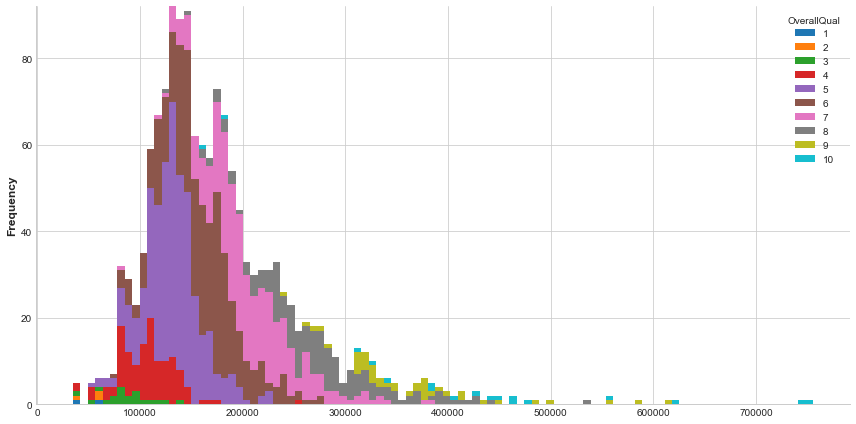

In [139]:
#plt.figure(figsize=(12,6))
plt.rc("figure",figsize=(12,6))
train.pivot(columns = 'OverallQual' ,values = 'SalePrice' ).plot.hist(stacked = True,bins=100)
sns.despine()
#ax = plt.gca()

### the overall quality of most homes are above average

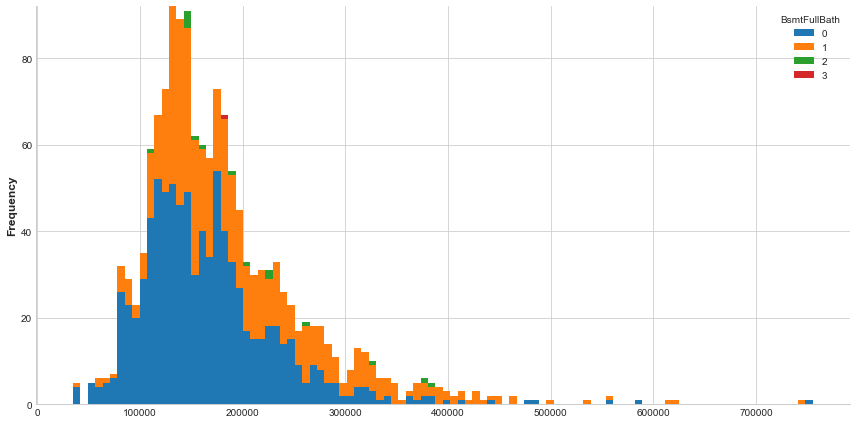

In [152]:
#plt.figure(figsize=(12,6))
plt.rc("figure",figsize=(12,6))
train.pivot(columns = 'BsmtFullBath' ,values = 'SalePrice' ).plot.hist(stacked = True,bins=100)
sns.despine()
#ax = plt.gca()

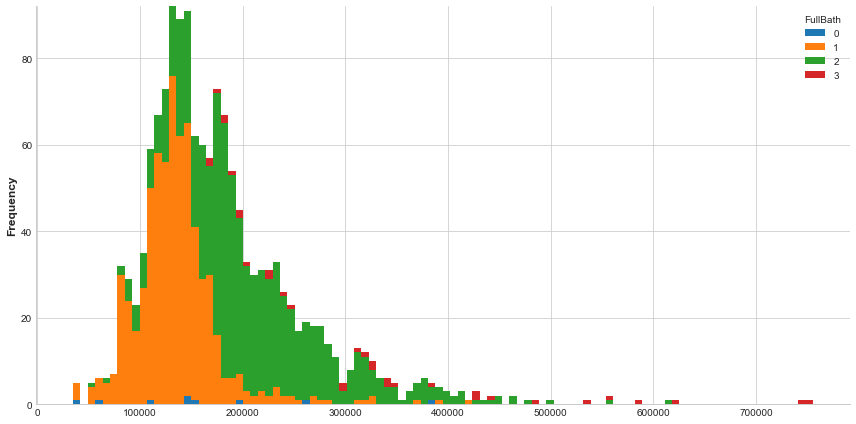

In [153]:
#FullBath
#plt.figure(figsize=(12,6))
plt.rc("figure",figsize=(12,6))
train.pivot(columns = 'FullBath' ,values = 'SalePrice' ).plot.hist(stacked = True,bins=100)
sns.despine()
#ax = plt.gca()

In [ ]:
#### most homes have 2 full bath 

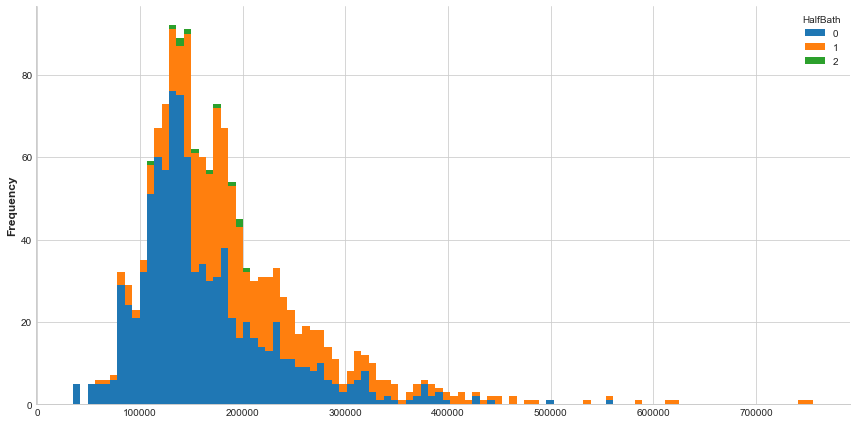

In [154]:
#HalfBath
#plt.figure(figsize=(12,6))
plt.rc("figure",figsize=(12,6))
train.pivot(columns = 'HalfBath' ,values = 'SalePrice' ).plot.hist(stacked = True,bins=100)
sns.despine()
#ax = plt.gca()

In [ ]:
### most homes have no halfbath 

### correlation with continous features

In [161]:
nums_train

Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [170]:
len(nums_train)/2

19.0

In [177]:
nums_train[:19].to_list() + ['SalePrice']

['Id',
 'MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'SalePrice']

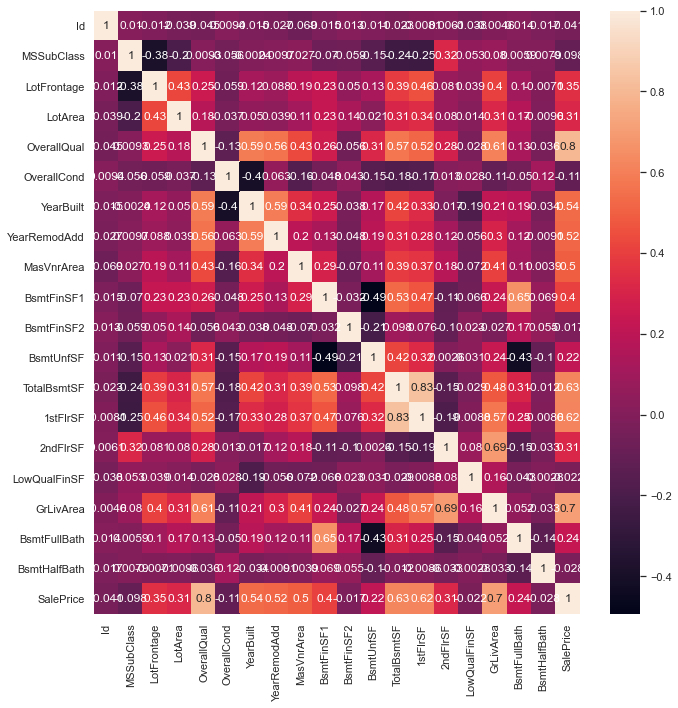

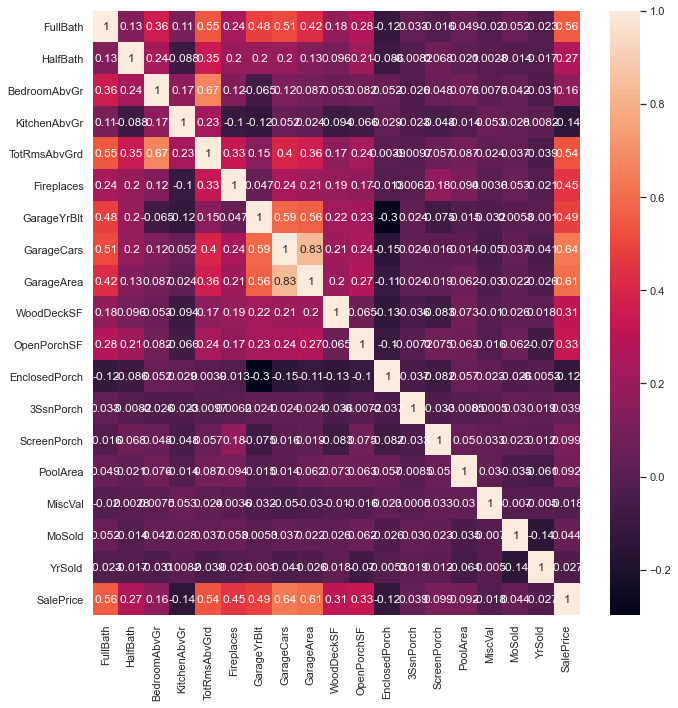

In [178]:
half_nums = int(len(nums_train)/2)
first_corr = nums_train[:half_nums].to_list() + ['SalePrice']
second_corr = nums_train[half_nums:]
corr1 = train[first_corr].dropna().corr()
plt.rc("figure",figsize=(10,10))
sns.set(font_scale=1)
sns.heatmap(corr1, cbar = True, annot = True)
plt.show();
corr2 = train[second_corr].dropna().corr()
plt.rc("figure",figsize=(10,10))
sns.set(font_scale=1)
sns.heatmap(corr2, cbar = True, annot = True)
plt.show();

#### from the correlation plot..the relationship between the price of the house and the overquality is very strong

In [180]:
train[nums_train].corrwith(train.SalePrice).sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
GarageYrBlt      0.486362
MasVnrArea       0.477493
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.351799
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
Id              -0.021917
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchenAbvGr    -0.135907
dtype: float

### lets look at another metric i.e mutual info score

In [187]:
num_cat

['MSSubClass',
 'OverallQual',
 'OverallCond',
 'BsmtFullBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'MoSold',
 'YrSold']

MoSold          1.422846
MSSubClass      1.281812
OverallQual     1.175989
TotRmsAbvGrd    1.166100
YrSold          0.847030
GarageCars      0.755562
OverallCond     0.742182
BedroomAbvGr    0.685355
FullBath        0.549952
Fireplaces      0.543726
HalfBath        0.379421
BsmtFullBath    0.354872
KitchenAbvGr    0.119028
dtype: float64

### mi score shows which features helps when predicting the target variable

## Categorical features

In [192]:
cats_train

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

In [55]:
def plot_categorical_and_median(df,thresh,categorical,target_col):
    #thresh value is for outlier check
    df_def = df.copy()
    #features = categorical.append(target_col)
    #df_def= df_def[features]
    df_def = df_def[df_def[target_col]<thresh]# outlier removal
    df_def.fillna(0,inplace=True)
    global_mean = df_def[target_col].mean()
    global_median = df_def[target_col].median()
    global_count = df_def.shape[0]
    for c in categorical:
        print(c)
        print("Number of unique values : ",df_def[c].nunique())
        df_group = pd.DataFrame(df_def.groupby(c)['SalePrice'].agg(['mean','median','count']).sort_values(by='median',ascending=False))
        df_group['mean_dif'] = df_group['mean'] - global_mean
        df_group['mean_dif_%'] = (1-(df_group['mean'] / global_mean))*100
        df_group['median_dif'] = df_group['median'] - global_median
        df_group['median_dif_%'] = (1-(df_group['median'] / global_median))*100
        df_group['count_dif'] = df_group['count'] - global_count
        df_group['count_%'] = (df_group['count'] / global_count)*100
        display(df_group[['mean','median','mean_dif_%','median_dif_%','count','count_%']].head())
        print()
        sort_target = df_def.groupby(c)[target_col].median().sort_values(ascending=False).index
        sns.boxplot(y=target_col, x=c, data= df_def, order= sort_target)
        ax = plt.gca()
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
        plt.show()
        plt.xlabel('sale price in $');
        print()
        sns.barplot(x=np.arange(df_group.shape[0]),y =df_group['count'])
        labels = df_group.index
        plt.xticks(np.arange(df_group.shape[0]),labels)
        plt.show()
        #plt.bar(x=np.arange(df_group.shape[0]),height =df_group['count'] )
        #plt.show()
        print()
        print()

MSZoning
Number of unique values :  5


,mean,median,mean_dif_%,median_dif_%,count,count_%
MSZoning,,,,,,
FV,205432.557377,197000,-22.676665,-24.683544,61,4.436364
RL,175703.010252,168500,-4.923287,-6.645570,1073,78.036364
RH,131558.375000,136500,21.438243,13.607595,16,1.163636
RM,122532.879070,120000,26.827933,24.050633,215,15.636364
C (all),74528.000000,74700,55.494657,52.721519,10,0.727273


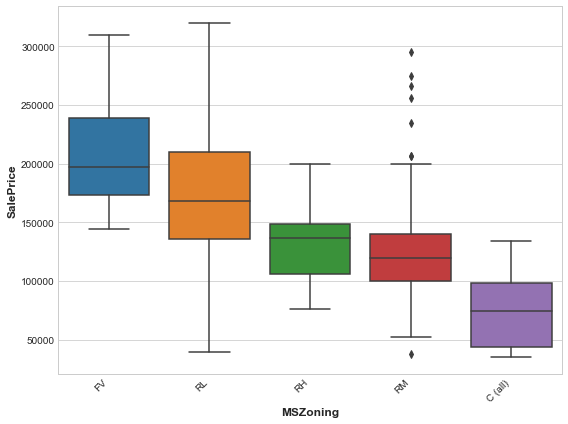

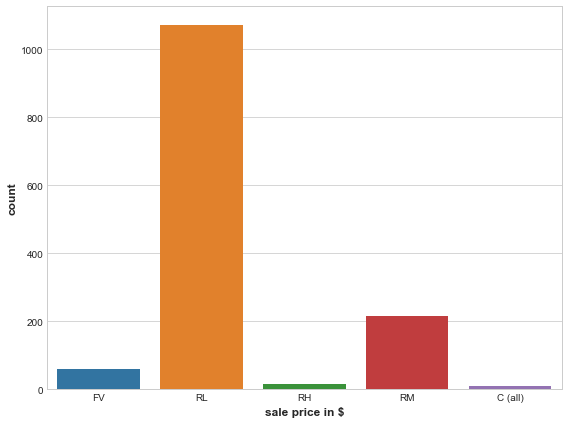



Street
Number of unique values :  2


,mean,median,mean_dif_%,median_dif_%,count,count_%
Street,,,,,,
Pave,167621.881665,158000,-0.097539,0.000000,1369,99.563636
Grvl,130190.500000,114250,22.255087,27.689873,6,0.436364


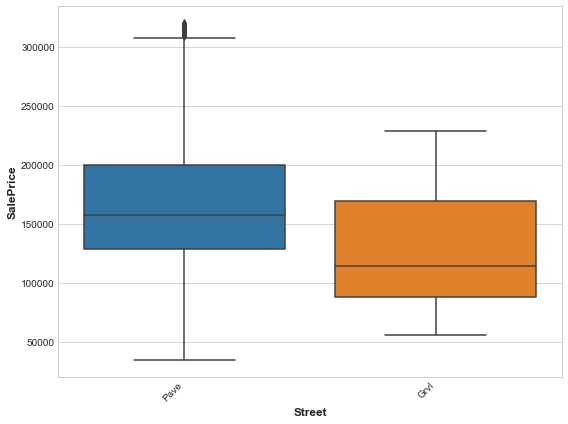

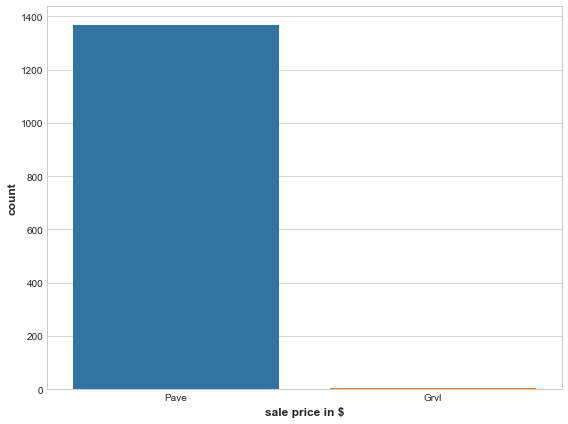



Alley
Number of unique values :  3


,mean,median,mean_dif_%,median_dif_%,count,count_%
Alley,,,,,,
Pave,168000.585366,172500.0,-0.323686,-9.177215,41,2.981818
0,169202.897975,159697.5,-1.041663,-1.074367,1284,93.381818
Grvl,122219.080000,119500.0,27.015322,24.367089,50,3.636364


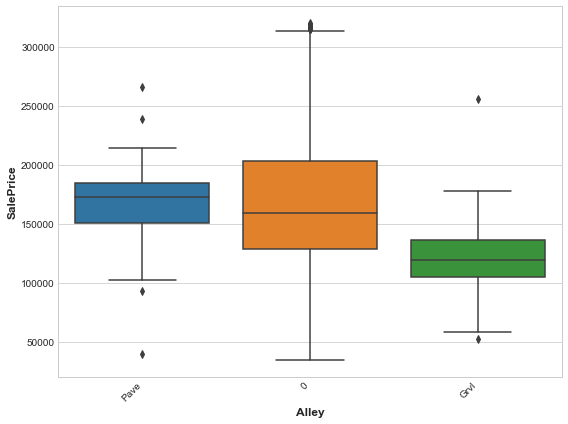

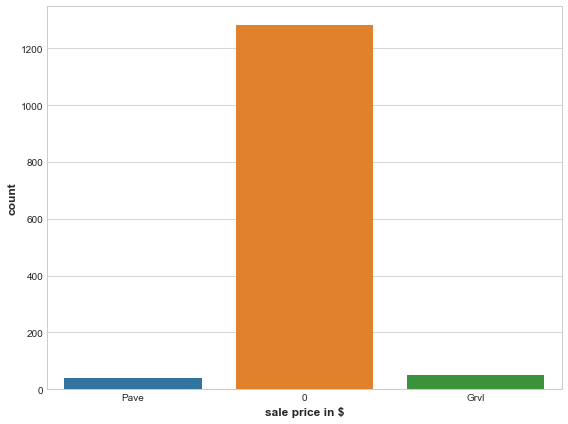



LotShape
Number of unique values :  4


,mean,median,mean_dif_%,median_dif_%,count,count_%
LotShape,,,,,,
IR2,203406.685714,195000,-21.466890,-23.417722,35,2.545455
IR3,198373.888889,192140,-18.461491,-21.607595,9,0.654545
IR1,187078.265306,183000,-11.716166,-15.822785,441,32.072727
Reg,156010.544944,144076,6.836319,8.812658,890,64.727273


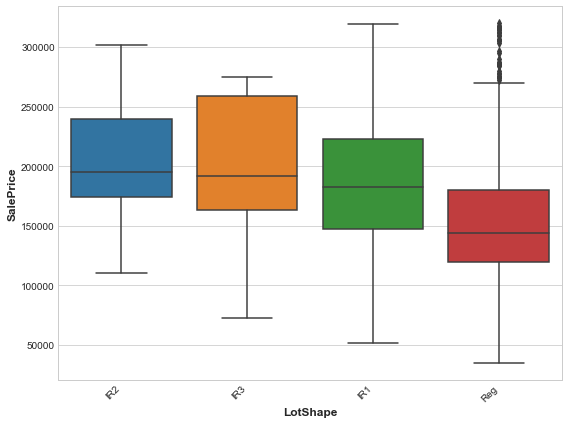

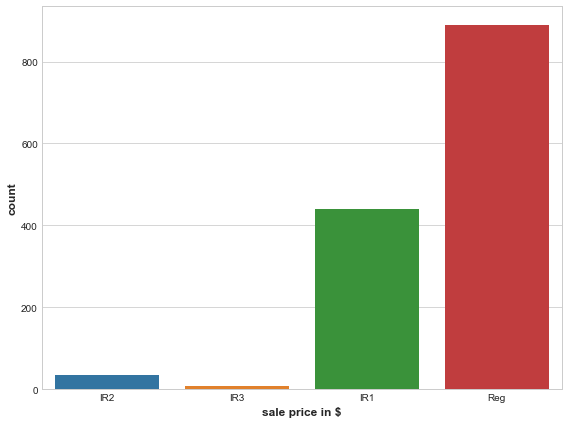



LandContour
Number of unique values :  4


,mean,median,mean_dif_%,median_dif_%,count,count_%
LandContour,,,,,,
Low,193288.235294,188750,-15.424528,-19.462025,34,2.472727
HLS,190722.275000,186850,-13.892232,-18.259494,40,2.909091
Lvl,167236.874798,157700,0.132373,0.189873,1238,90.036364
Bnk,143104.079365,139400,14.543579,11.772152,63,4.581818


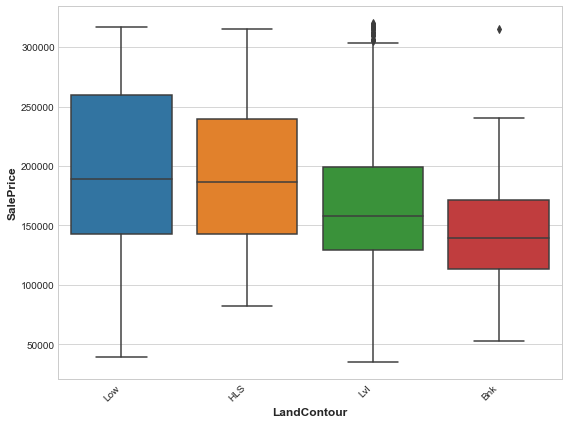

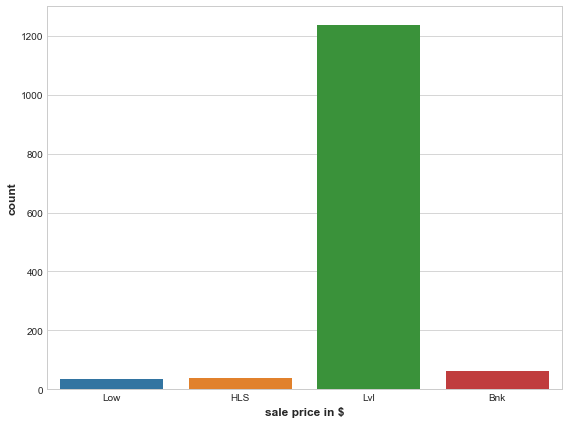



Utilities
Number of unique values :  2


,mean,median,mean_dif_%,median_dif_%,count,count_%
Utilities,,,,,,
AllPub,167480.348617,158000,-0.013020,0.000000,1374,99.927273
NoSeWa,137500.000000,137500,17.890126,12.974684,1,0.072727


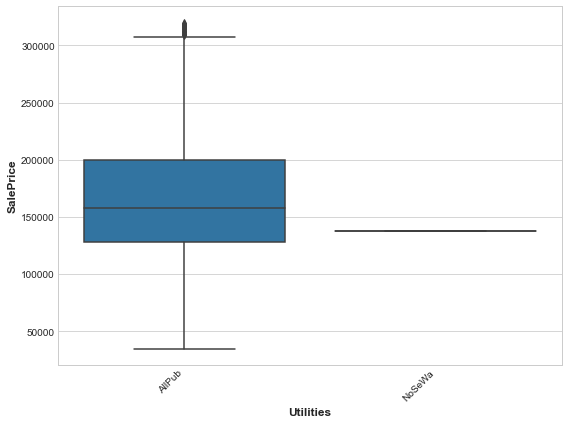

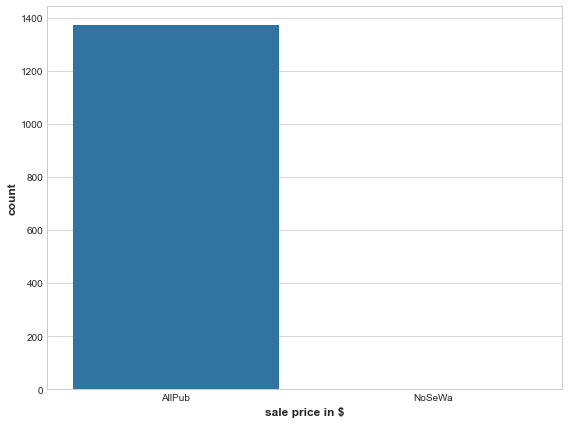



LotConfig
Number of unique values :  5


,mean,median,mean_dif_%,median_dif_%,count,count_%
LotConfig,,,,,,
FR3,208475.000000,195450,-24.493498,-23.702532,4,0.290909
CulDSac,198491.869048,190500,-18.531944,-20.569620,84,6.109091
FR2,166018.363636,163000,0.860022,-3.164557,44,3.200000
Corner,166641.252033,157500,0.488057,0.316456,246,17.890909
Inside,164944.559679,155000,1.501258,1.898734,997,72.509091


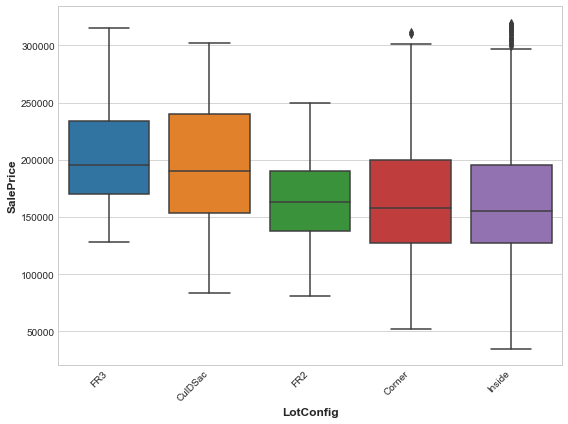

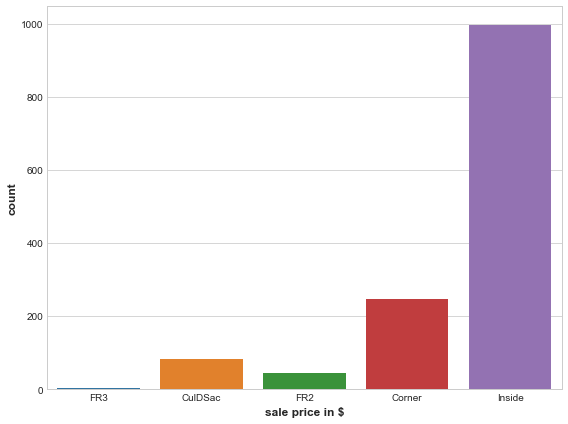



LandSlope
Number of unique values :  3


,mean,median,mean_dif_%,median_dif_%,count,count_%
LandSlope,,,,,,
Sev,190160.833333,182500,-13.556960,-15.506329,12,0.872727
Mod,177188.457627,170000,-5.810341,-7.594937,59,4.290909
Gtl,166809.394172,157000,0.387649,0.632911,1304,94.836364


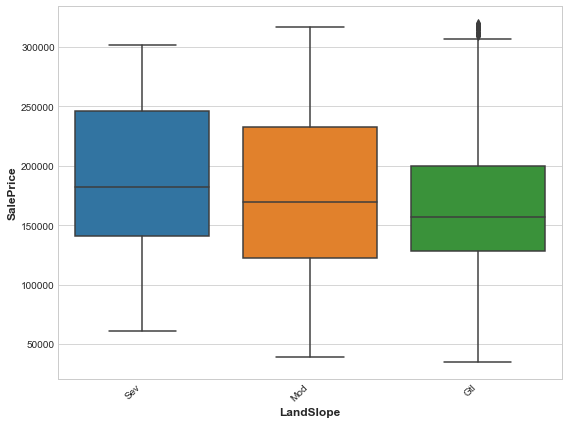

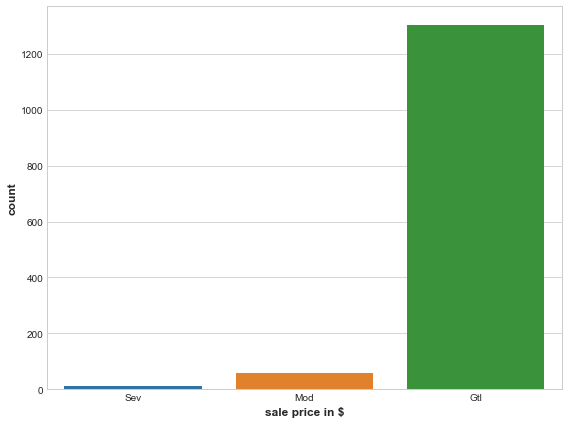



Neighborhood
Number of unique values :  25


,mean,median,mean_dif_%,median_dif_%,count,count_%
Neighborhood,,,,,,
NoRidge,272017.600000,269790,-62.438770,-70.753165,25,1.818182
NridgHt,251031.863636,255900,-49.906870,-61.962025,44,3.200000
StoneBr,233600.000000,236500,-39.497211,-49.683544,15,1.090909
Timber,227853.029412,222250,-36.065335,-40.664557,34,2.472727
Somerst,215751.725000,215600,-28.838887,-36.455696,80,5.818182


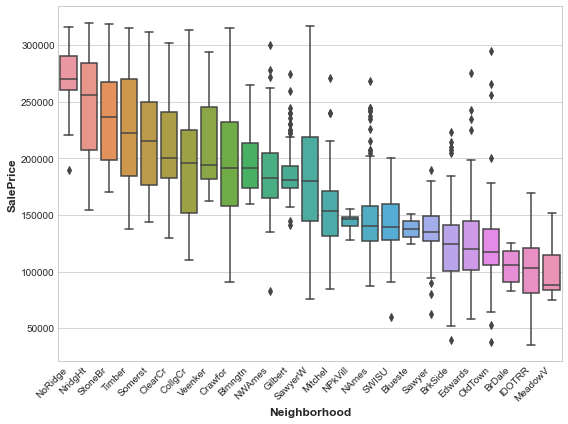

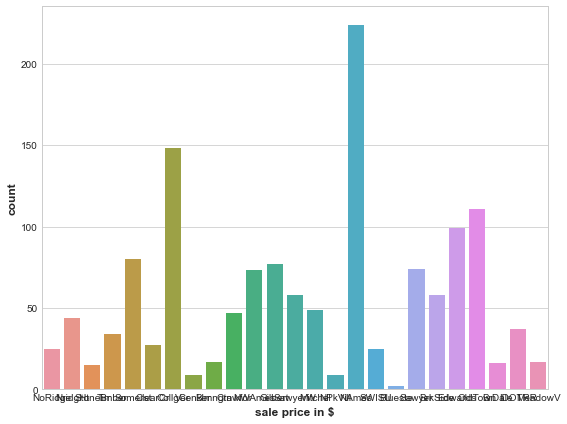



Condition1
Number of unique values :  9


,mean,median,mean_dif_%,median_dif_%,count,count_%
Condition1,,,,,,
PosN,205750.000000,198750,-22.866230,-25.791139,18,1.309091
RRNe,190750.000000,190750,-13.908789,-20.727848,2,0.145455
PosA,210285.714286,190000,-25.574789,-20.253165,7,0.509091
RRNn,185500.000000,171000,-10.773684,-8.227848,4,0.290909
RRAn,174852.480000,169990,-4.415382,-7.588608,25,1.818182


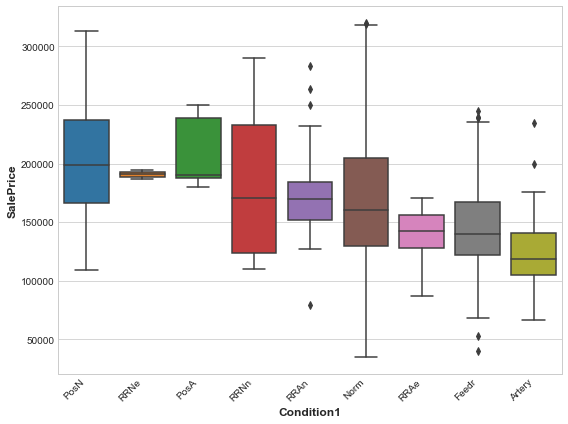

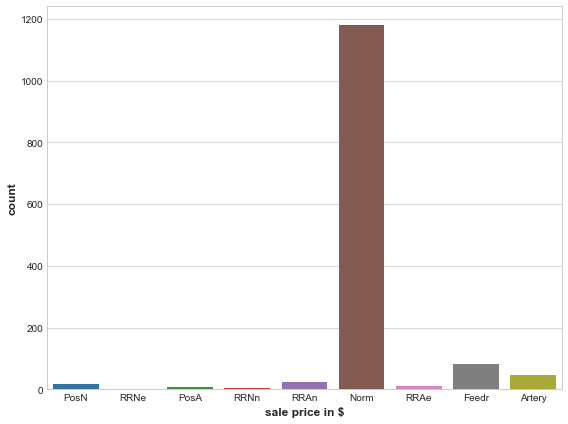



Condition2
Number of unique values :  7


,mean,median,mean_dif_%,median_dif_%,count,count_%
Condition2,,,,,,
RRAe,190000.000000,190000,-13.460917,-20.253165,1,0.072727
PosN,184750.000000,184750,-10.325812,-16.930380,1,0.072727
Norm,167849.004405,158250,-0.233168,-0.158228,1362,99.054545
RRAn,136905.000000,136905,18.245438,13.351266,1,0.072727
Feedr,121166.666667,127500,27.643784,19.303797,6,0.436364


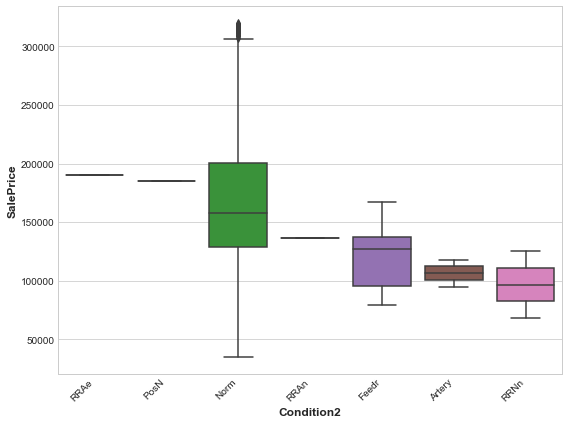

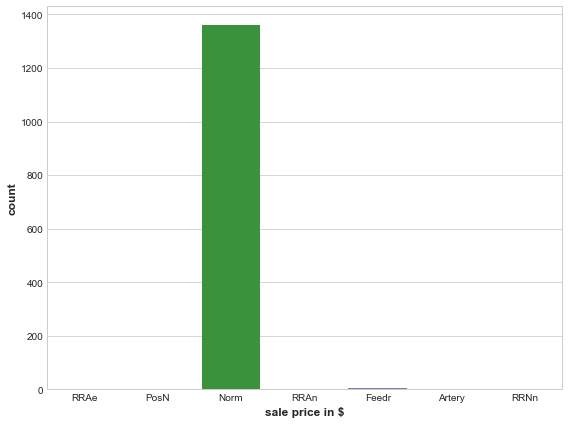



BldgType
Number of unique values :  5


,mean,median,mean_dif_%,median_dif_%,count,count_%
BldgType,,,,,,
TwnhsE,175733.372727,170875,-4.941419,-8.148734,110,8.000000
1Fam,170461.011414,161750,-1.792961,-2.373418,1139,82.836364
Twnhs,135911.627907,137500,18.838643,12.974684,43,3.127273
Duplex,133541.076923,135980,20.254247,13.936709,52,3.781818
2fmCon,128432.258065,127500,23.305043,19.303797,31,2.254545


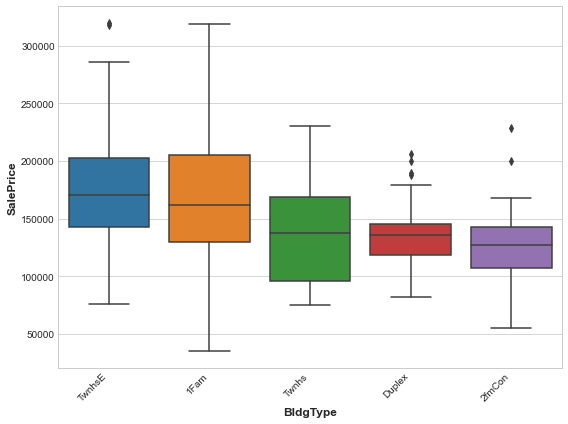

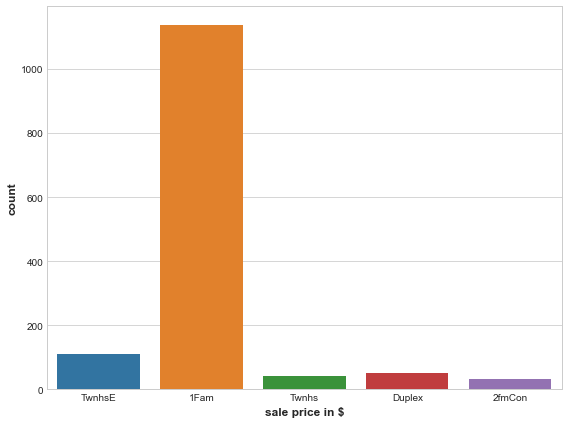



HouseStyle
Number of unique values :  8


,mean,median,mean_dif_%,median_dif_%,count,count_%
HouseStyle,,,,,,
2.5Fin,183571.428571,191000,-9.622014,-20.886076,7,0.509091
2Story,190130.029703,185000,-13.538566,-17.088608,404,29.381818
SLvl,163917.500000,164200,2.114580,-3.924051,64,4.654545
1Story,163715.448326,150000,2.235238,5.063291,687,49.963636
SFoyer,135074.486486,135960,19.338552,13.949367,37,2.690909


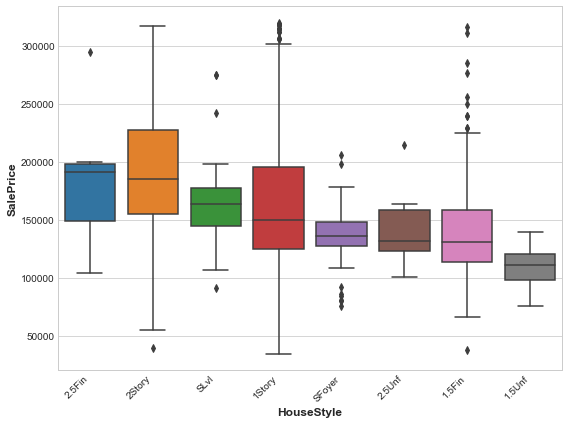

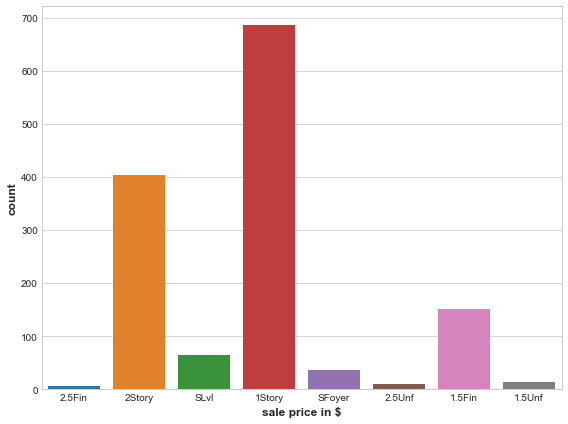



RoofStyle
Number of unique values :  6


,mean,median,mean_dif_%,median_dif_%,count,count_%
RoofStyle,,,,,,
Shed,225000.000000,225000,-34.361612,-42.405063,2,0.145455
Flat,194690.000000,185000,-16.261610,-17.088608,13,0.945455
Mansard,180568.428571,175000,-7.828734,-10.759494,7,0.509091
Hip,179566.962185,159500,-7.230695,-0.949367,238,17.309091
Gable,164525.011775,157000,1.751797,0.632911,1104,80.290909


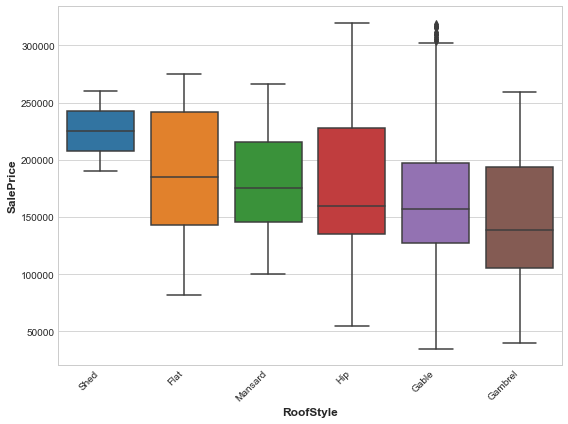

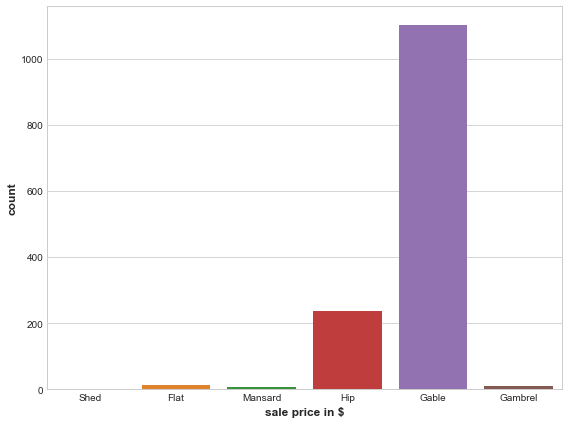



RoofMatl
Number of unique values :  8


,mean,median,mean_dif_%,median_dif_%,count,count_%
RoofMatl,,,,,,
WdShngl,242166.666667,278000,-44.612905,-75.949367,3,0.218182
WdShake,241400.000000,242000,-44.155081,-53.164557,5,0.363636
Membran,241500.000000,241500,-44.214797,-52.848101,1,0.072727
Metal,180000.000000,180000,-7.489290,-13.924051,1,0.072727
Tar&Grv,185406.363636,167000,-10.717768,-5.696203,11,0.800000


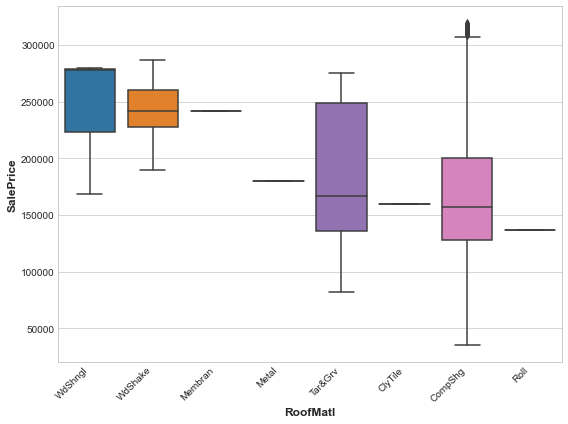

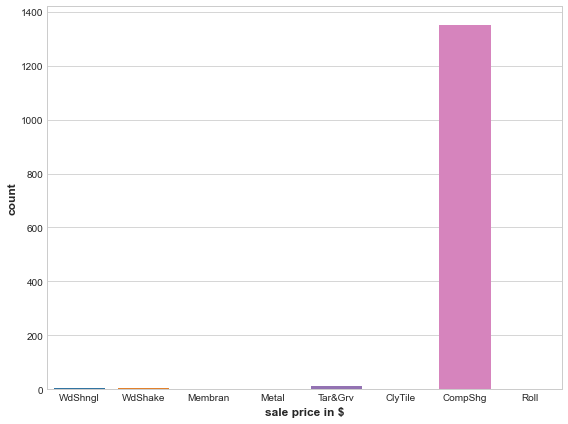



Exterior1st
Number of unique values :  15


,mean,median,mean_dif_%,median_dif_%,count,count_%
Exterior1st,,,,,,
ImStucc,262000.000000,262000,-56.456633,-65.822785,1,0.072727
Stone,258500.000000,258500,-54.366563,-63.607595,2,0.145455
VinylSd,194850.886266,192070,-16.357685,-21.563291,466,33.890909
CemntBd,187457.306122,184750,-11.942515,-16.930380,49,3.563636
Plywood,172988.462264,166250,-3.302261,-5.221519,106,7.709091


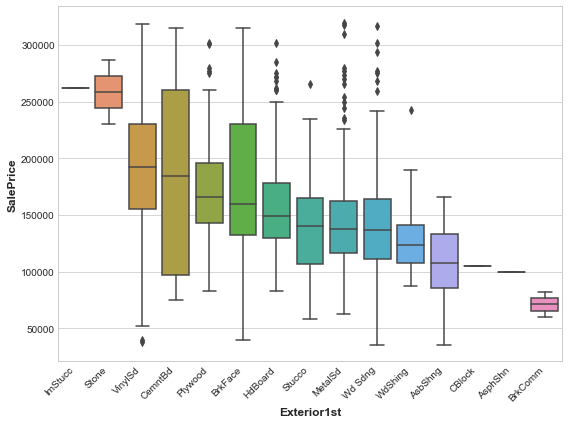

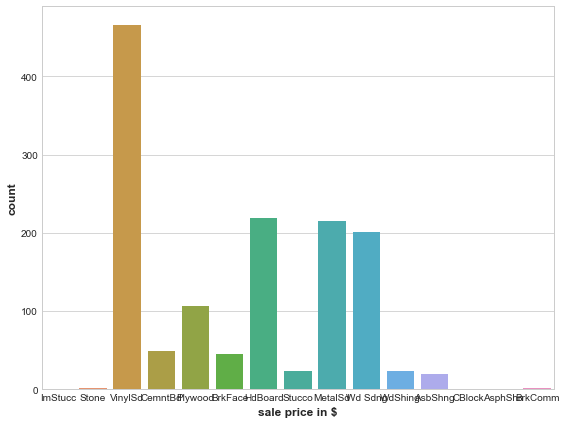



Exterior2nd
Number of unique values :  16


,mean,median,mean_dif_%,median_dif_%,count,count_%
Exterior2nd,,,,,,
Other,319000.000000,319000,-90.494908,-101.898734,1,0.072727
CmentBd,187862.666667,195350,-12.184581,-23.639241,48,3.490909
VinylSd,195443.046053,193000,-16.711301,-22.151899,456,33.163636
Stone,158224.800000,177000,5.514048,-12.025316,5,0.363636
Plywood,167035.170213,159500,0.252823,-0.949367,141,10.254545


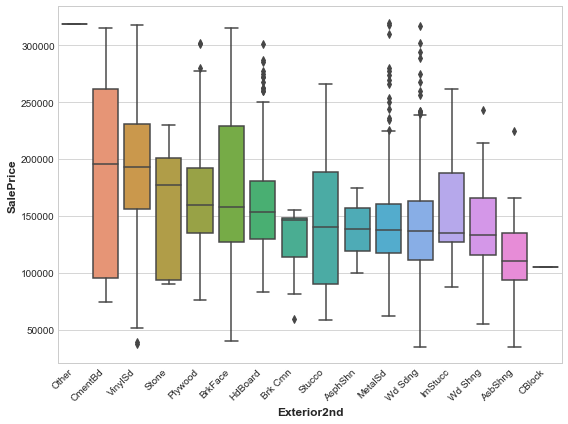

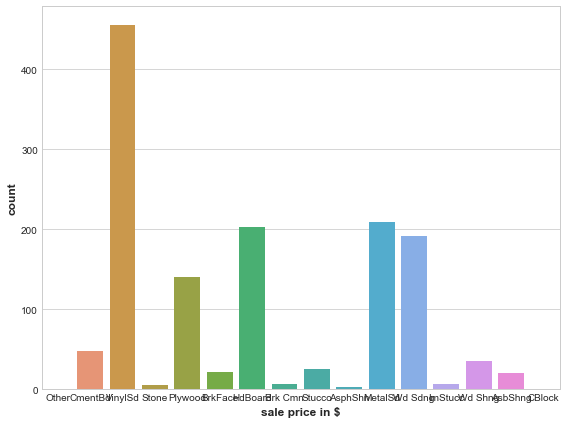



MasVnrType
Number of unique values :  5


,mean,median,mean_dif_%,median_dif_%,count,count_%
MasVnrType,,,,,,
Stone,222251.846939,223000,-32.720517,-41.139241,98,7.127273
0,203839.142857,200624,-21.725137,-26.977215,7,0.509091
BrkFace,187039.457002,177000,-11.692991,-12.025316,407,29.600000
None,151802.021226,141750,9.349492,10.284810,848,61.672727
BrkCmn,146318.066667,139000,12.624305,12.025316,15,1.090909


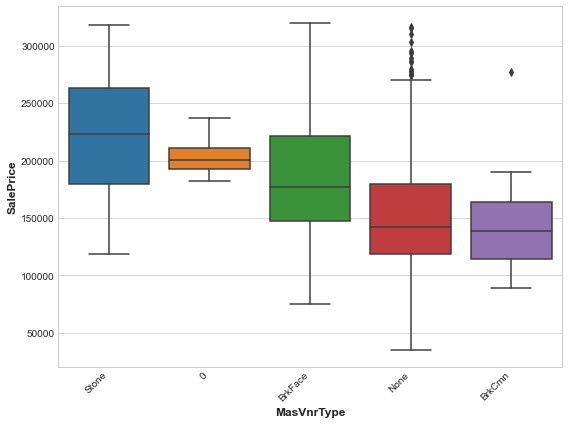

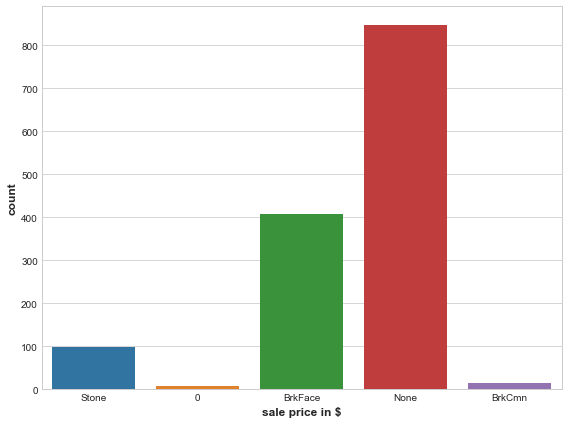



ExterQual
Number of unique values :  4


,mean,median,mean_dif_%,median_dif_%,count,count_%
ExterQual,,,,,,
Ex,260599.421053,274000,-55.620259,-73.417722,19,1.381818
Gd,215593.718821,213250,-28.744531,-34.968354,441,32.072727
TA,143169.241953,139000,14.504666,12.025316,901,65.527273
Fa,87985.214286,82250,47.458510,47.943038,14,1.018182


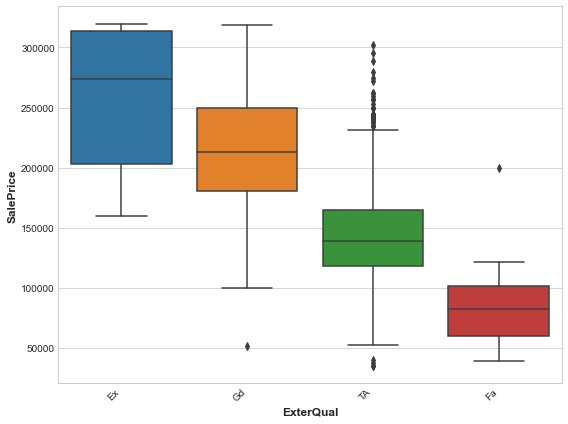

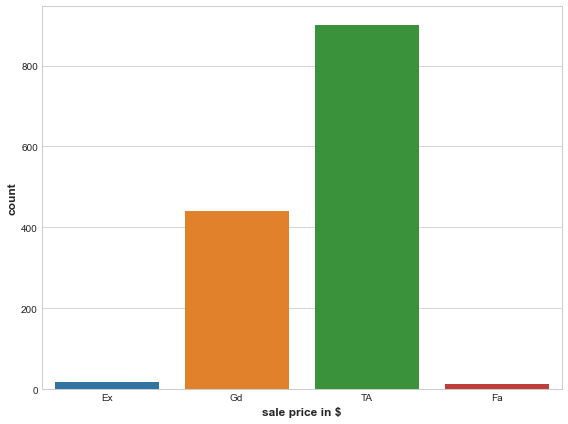



ExterCond
Number of unique values :  5


,mean,median,mean_dif_%,median_dif_%,count,count_%
ExterCond,,,,,,
TA,170020.191189,160200,-1.529720,-1.392405,1203,87.490909
Gd,159525.141844,147000,4.737532,6.962025,141,10.254545
Ex,139500.000000,139500,16.695801,11.708861,2,0.145455
Fa,102595.142857,95750,38.734005,39.398734,28,2.036364
Po,76500.000000,76500,54.317052,51.582278,1,0.072727


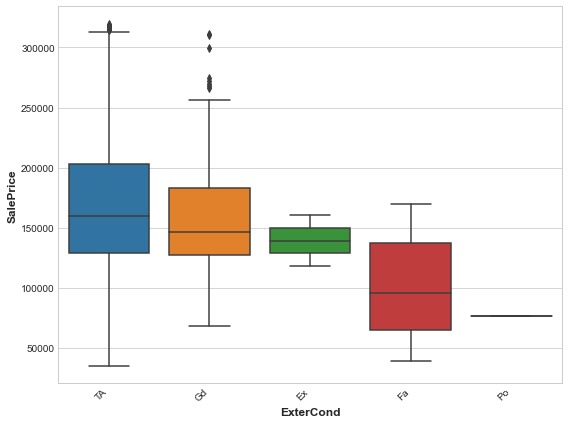

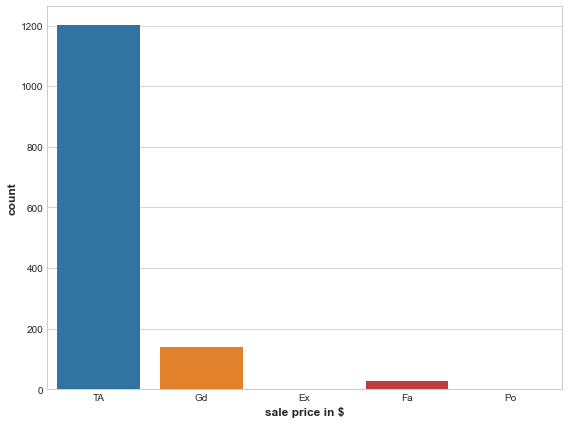



Foundation
Number of unique values :  6


,mean,median,mean_dif_%,median_dif_%,count,count_%
Foundation,,,,,,
PConc,201271.546573,194500,-20.191864,-23.101266,569,41.381818
Wood,185666.666667,164000,-10.873212,-3.797468,3,0.218182
CBlock,147993.580286,141000,11.623751,10.759494,629,45.745455
Stone,165959.166667,126500,0.895373,19.936709,6,0.436364
BrkTil,128572.895833,124950,23.221060,20.917722,144,10.472727


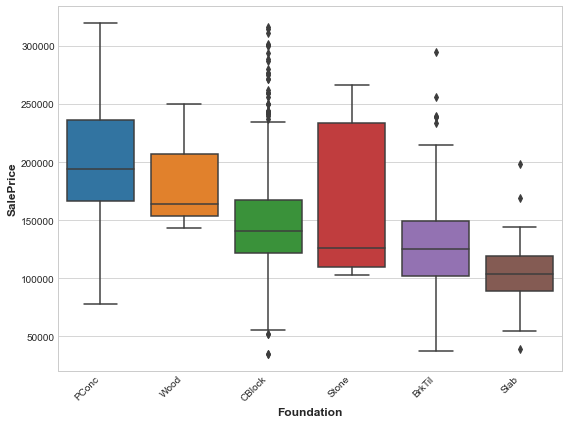

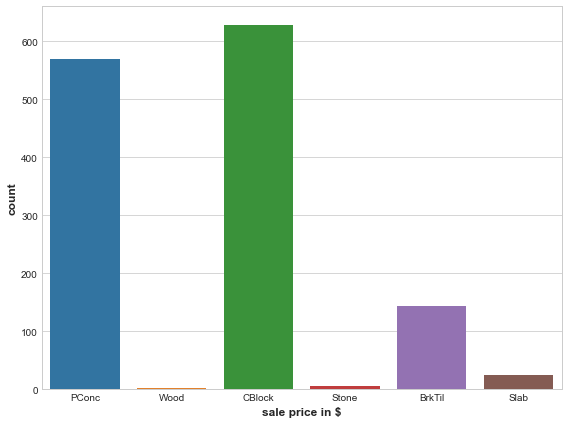



BsmtQual
Number of unique values :  5


,mean,median,mean_dif_%,median_dif_%,count,count_%
BsmtQual,,,,,,
Ex,249637.296875,263000,-49.074087,-66.455696,64,4.654545
Gd,195865.450253,190000,-16.963545,-20.253165,593,43.127273
TA,139585.328173,135250,16.644846,14.398734,646,46.981818
Fa,115692.028571,112000,30.913034,29.113924,35,2.545455
0,105652.891892,101800,36.908032,35.569620,37,2.690909


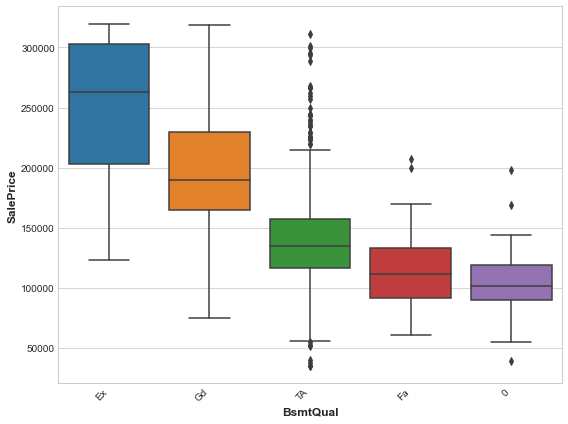

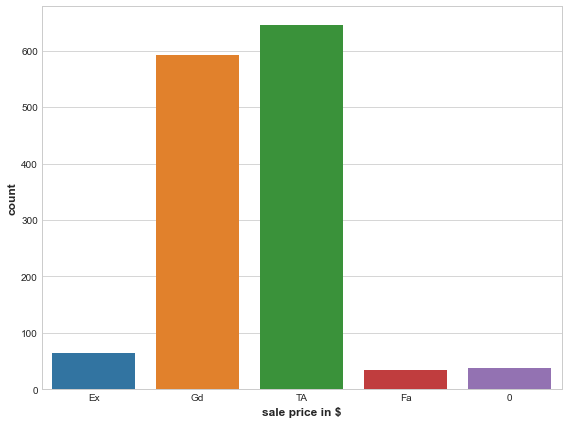



BsmtCond
Number of unique values :  5


,mean,median,mean_dif_%,median_dif_%,count,count_%
BsmtCond,,,,,,
Gd,197753.084746,187750,-18.090770,-18.829114,59,4.290909
TA,169699.254058,160000,-1.338068,-1.265823,1232,89.600000
Fa,121809.533333,118500,27.259888,25.000000,45,3.272727
0,105652.891892,101800,36.908032,35.569620,37,2.690909
Po,64000.000000,64000,61.781586,59.493671,2,0.145455


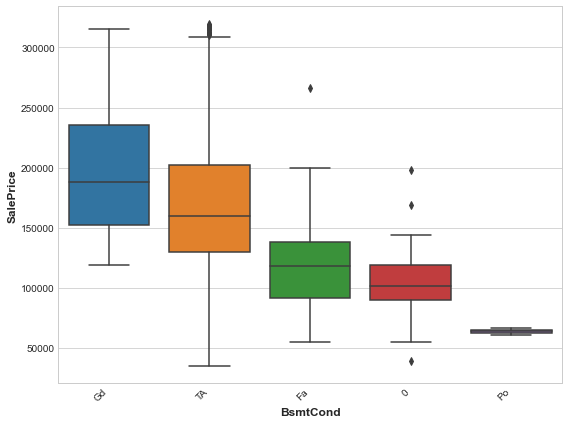

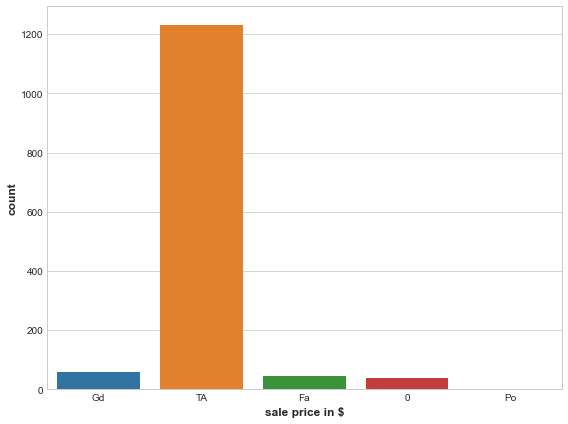



BsmtExposure
Number of unique values :  5


,mean,median,mean_dif_%,median_dif_%,count,count_%
BsmtExposure,,,,,,
Gd,205151.647059,195000,-22.508916,-23.417722,102,7.418182
Av,186029.000000,178200,-11.089584,-12.784810,200,14.545455
Mn,175764.836538,164000,-4.960208,-3.797468,104,7.563636
No,160841.064447,152000,3.951713,3.797468,931,67.709091
0,107938.342105,104025,35.543246,34.161392,38,2.763636


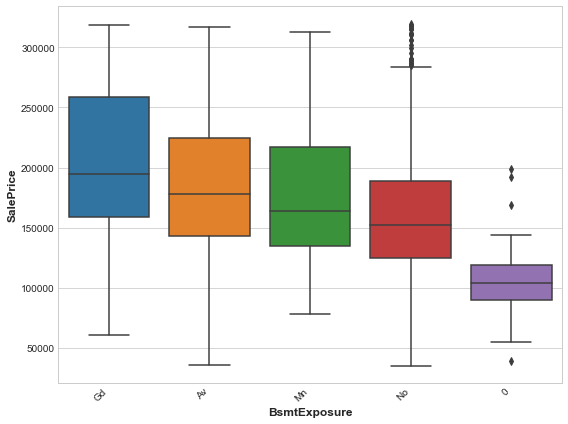

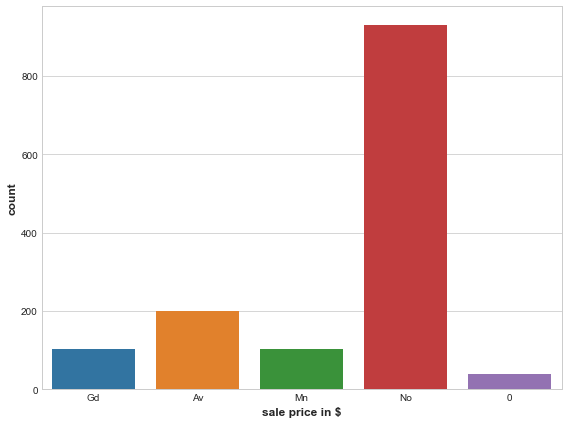



BsmtFinType1
Number of unique values :  7


,mean,median,mean_dif_%,median_dif_%,count,count_%
BsmtFinType1,,,,,,
GLQ,205544.149718,199950,-22.743303,-26.550633,354,25.745455
Unf,161724.714286,158000,3.424030,0.000000,413,30.036364
ALQ,158867.316514,148750,5.130361,5.854430,218,15.854545
Rec,145115.681818,141500,13.342325,10.443038,132,9.600000
LwQ,151852.702703,139000,9.319227,12.025316,74,5.381818


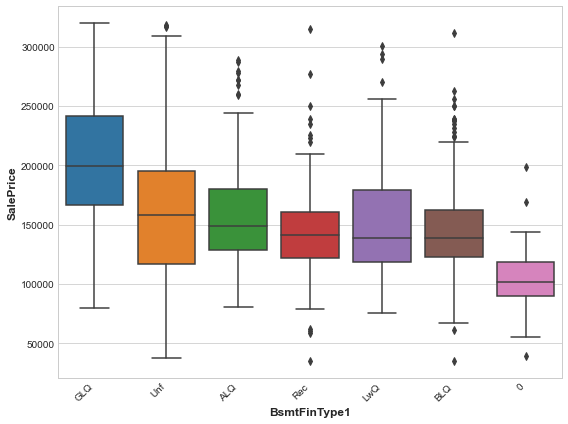

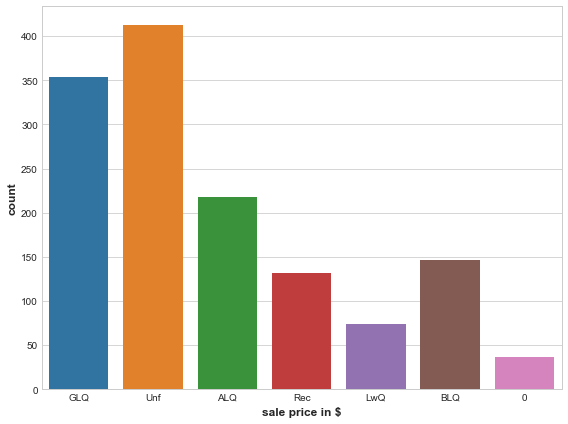



BsmtFinType2
Number of unique values :  7


,mean,median,mean_dif_%,median_dif_%,count,count_%
BsmtFinType2,,,,,,
GLQ,180982.142857,203125,-8.075789,-28.560127,14,1.018182
ALQ,190772.222222,169700,-13.922059,-7.405063,18,1.309091
Unf,169862.933560,160600,-1.435811,-1.645570,1174,85.381818
LwQ,164364.130435,154000,1.847869,2.531646,46,3.345455
Rec,156317.788462,145500,6.652844,7.911392,52,3.781818


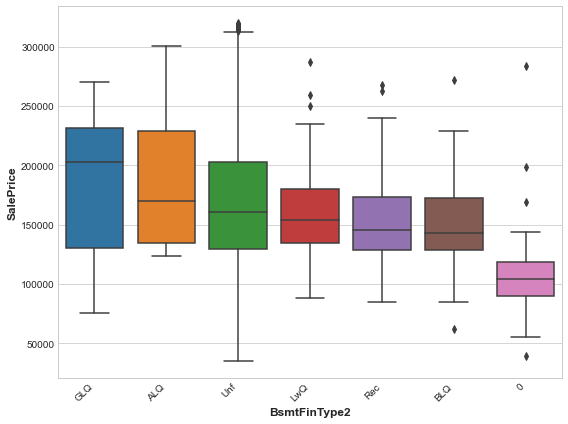

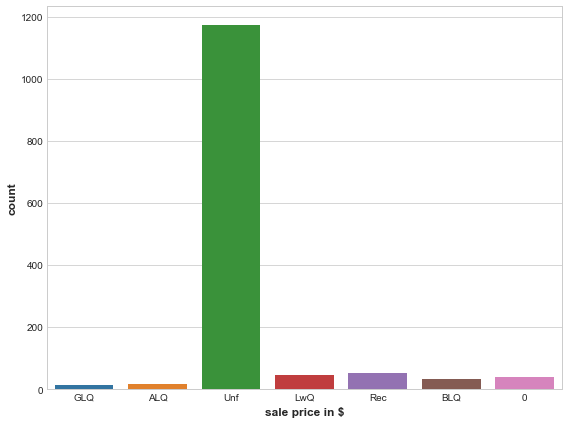



Heating
Number of unique values :  6


,mean,median,mean_dif_%,median_dif_%,count,count_%
Heating,,,,,,
GasA,168461.175595,159217,-0.598734,-0.770253,1344,97.745455
GasW,154375.235294,133900,7.812865,15.253165,17,1.236364
OthW,125750.000000,125750,24.906788,20.411392,2,0.145455
Wall,92100.000000,91450,45.001314,42.120253,4,0.290909
Grav,75271.428571,79000,55.050709,50.000000,7,0.509091


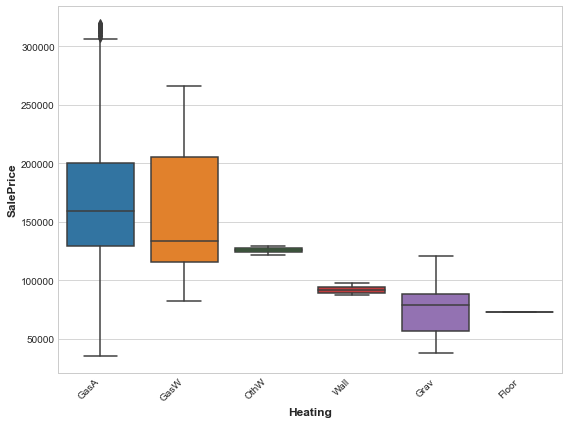

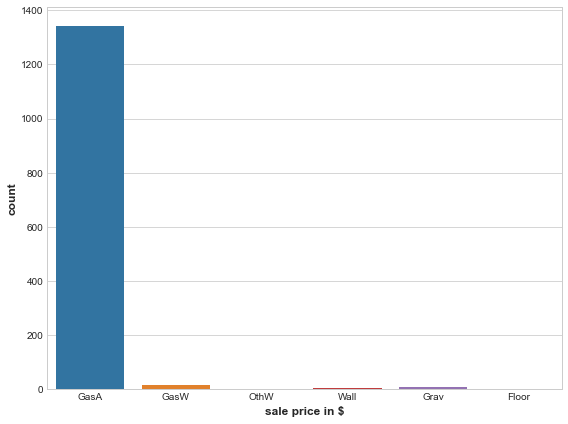



HeatingQC
Number of unique values :  5


,mean,median,mean_dif_%,median_dif_%,count,count_%
HeatingQC,,,,,,
Ex,193074.164157,187500,-15.296693,-18.670886,664,48.290909
Gd,152682.152542,150875,8.823911,4.509494,236,17.163636
TA,140852.261176,135000,15.888281,14.556962,425,30.909091
Fa,123919.489796,123500,25.999900,21.835443,49,3.563636
Po,87000.000000,87000,48.046843,44.936709,1,0.072727


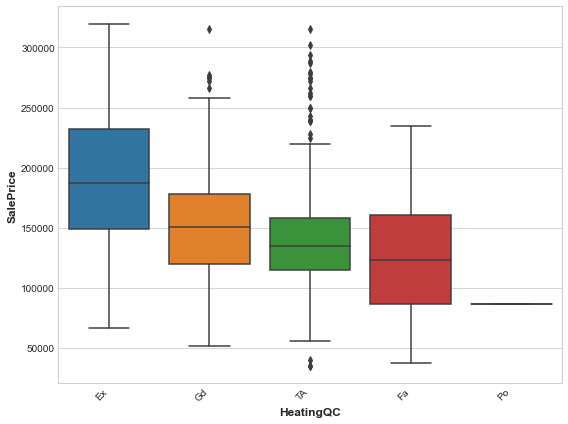

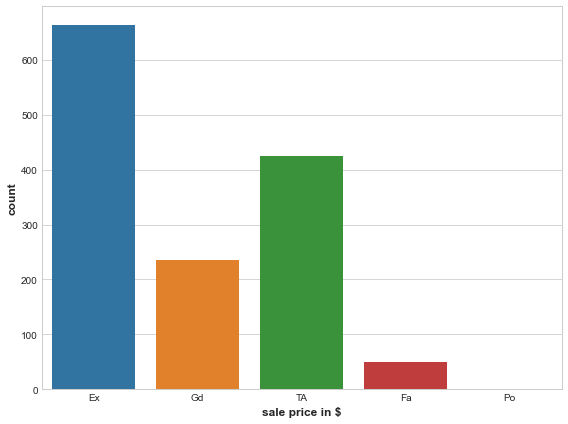



CentralAir
Number of unique values :  2


,mean,median,mean_dif_%,median_dif_%,count,count_%
CentralAir,,,,,,
Y,172074.540625,162950,-2.756501,-3.132911,1280,93.090909
N,105264.073684,98000,37.140219,37.974684,95,6.909091


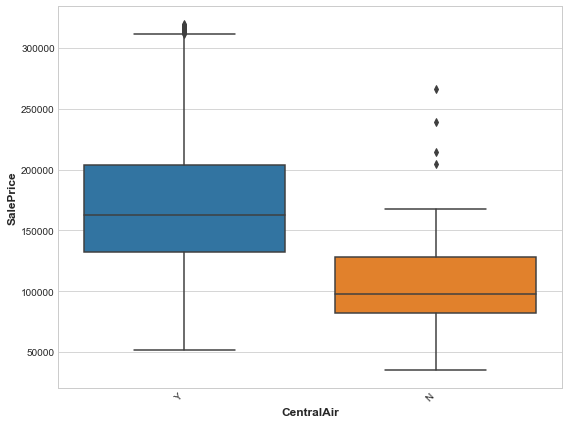

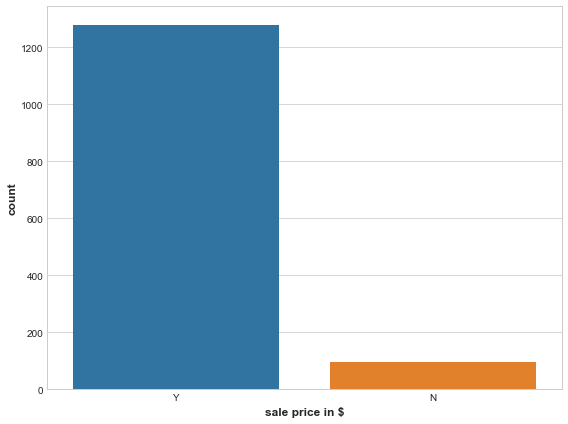



Electrical
Number of unique values :  6


,mean,median,mean_dif_%,median_dif_%,count,count_%
Electrical,,,,,,
0,167500.000000,167500,-0.024756,-6.012658,1,0.072727
SBrkr,172406.128102,164500,-2.954512,-4.113924,1249,90.836364
FuseA,122196.893617,121250,27.028571,23.259494,94,6.836364
FuseF,107675.444444,115000,35.700239,27.215190,27,1.963636
FuseP,97333.333333,82000,41.876162,48.101266,3,0.218182


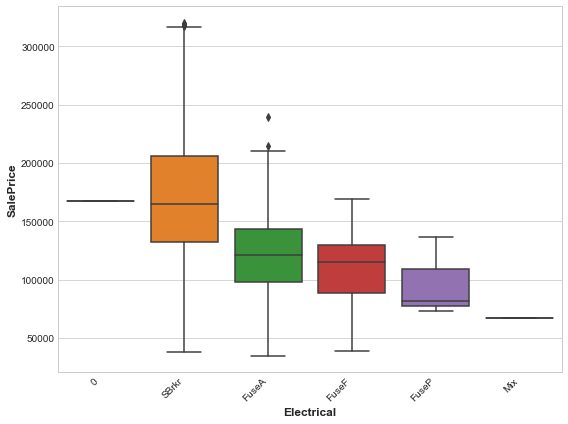

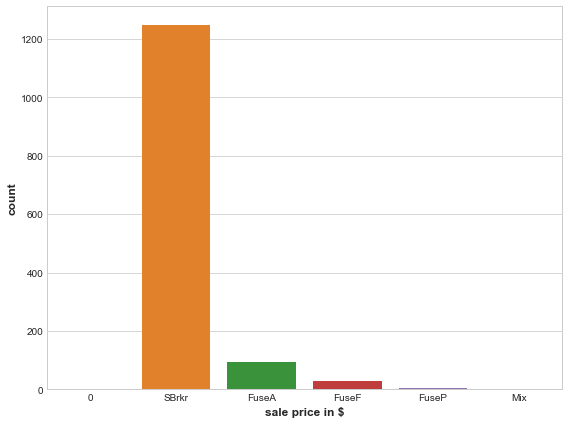



KitchenQual
Number of unique values :  4


,mean,median,mean_dif_%,median_dif_%,count,count_%
KitchenQual,,,,,,
Ex,245047.339623,264561,-46.333136,-67.443671,53,3.854545
Gd,201841.092727,197000,-20.531976,-24.683544,550,40.000000
TA,139342.900409,136905,16.789615,13.351266,733,53.309091
Fa,105565.205128,115000,36.960395,27.215190,39,2.836364


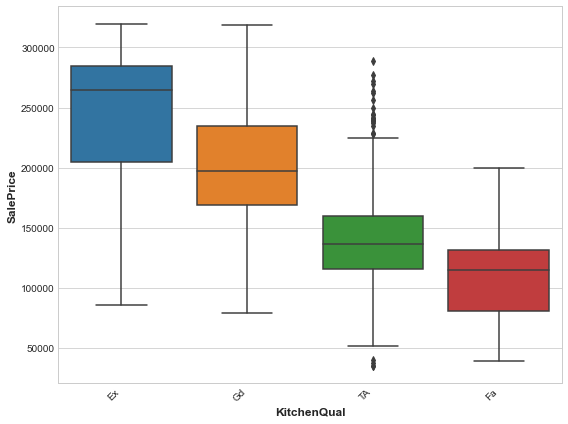

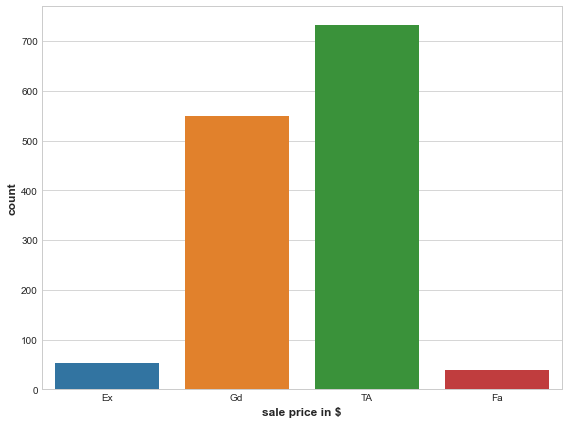



Functional
Number of unique values :  7


,mean,median,mean_dif_%,median_dif_%,count,count_%
Functional,,,,,,
Typ,169366.922414,160000,-1.139612,-1.265823,1276,92.800000
Maj1,153948.142857,140750,8.067908,10.917722,14,1.018182
Min2,144240.647059,140000,13.864863,11.392405,34,2.472727
Min1,146385.483871,139000,12.584046,12.025316,31,2.254545
Mod,141992.857143,130950,15.207159,17.120253,14,1.018182


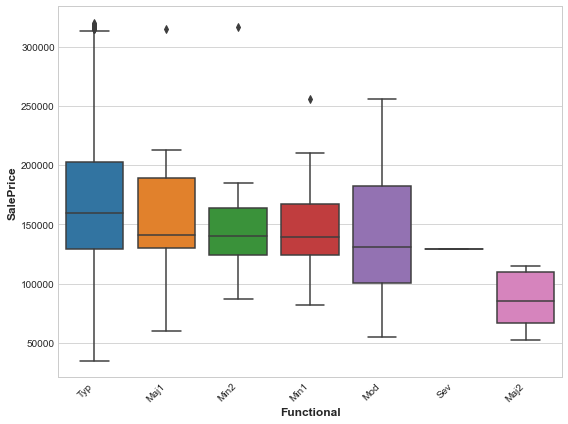

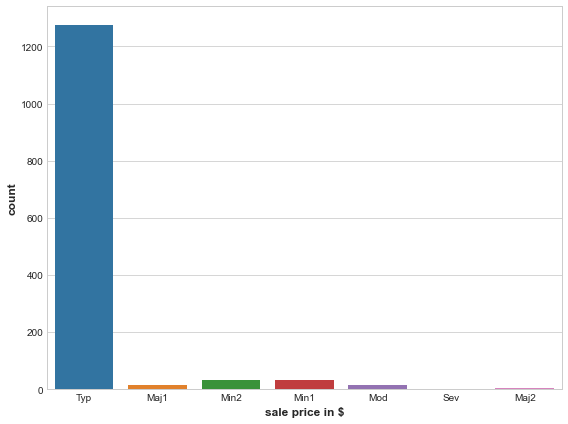



FireplaceQu
Number of unique values :  6


,mean,median,mean_dif_%,median_dif_%,count,count_%
FireplaceQu,,,,,,
Ex,256382.000000,266000,-53.101772,-68.354430,13,0.945455
Gd,197980.941538,189000,-18.226837,-19.620253,325,23.636364
TA,194643.628378,184550,-16.233918,-16.803797,296,21.527273
Fa,167298.484848,158000,0.095582,0.000000,33,2.400000
0,140767.558140,135000,15.938862,14.556962,688,50.036364


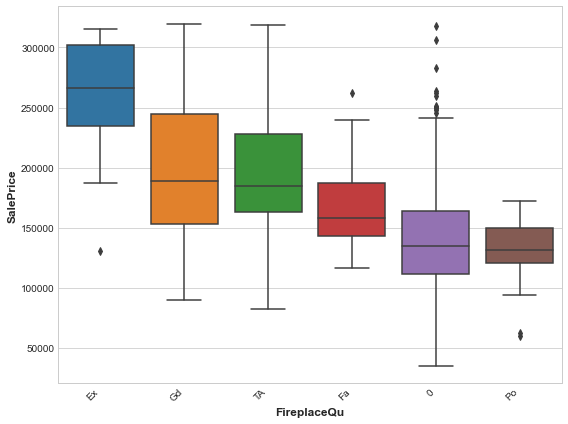

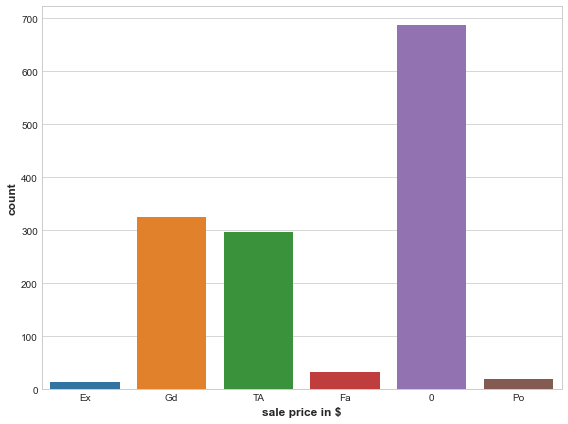



GarageType
Number of unique values :  7


,mean,median,mean_dif_%,median_dif_%,count,count_%
GarageType,,,,,,
BuiltIn,213031.171429,214450,-27.214274,-35.727848,70,5.090909
Attchd,187707.487593,180000,-12.091914,-13.924051,806,58.618182
2Types,151283.333333,159000,9.659233,-0.632911,6,0.436364
Basment,149541.277778,146500,10.699524,7.278481,18,1.309091
Detchd,132709.818182,129500,20.750644,18.037975,385,28.000000


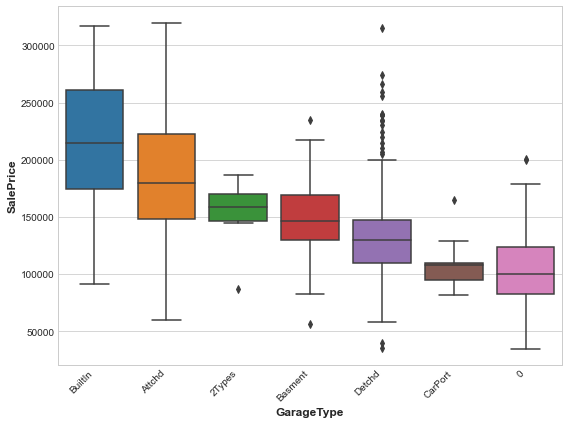

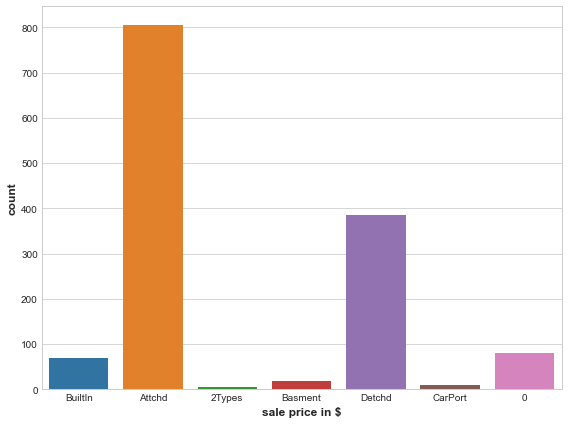



GarageFinish
Number of unique values :  4


,mean,median,mean_dif_%,median_dif_%,count,count_%
GarageFinish,,,,,,
Fin,206064.034247,192320,-23.053759,-21.721519,292,21.236364
RFn,192964.092040,187300,-15.230962,-18.544304,402,29.236364
Unf,140240.893333,135000,16.253367,14.556962,600,43.636364
0,103317.283951,100000,38.302770,36.708861,81,5.890909


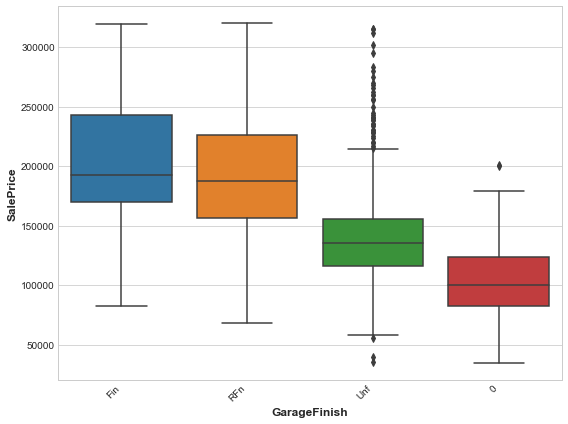

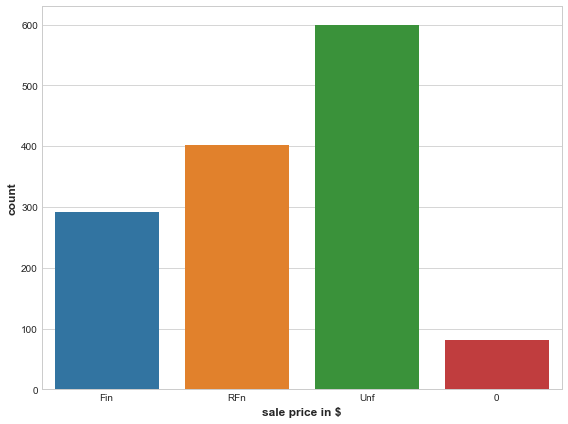



GarageQual
Number of unique values :  6


,mean,median,mean_dif_%,median_dif_%,count,count_%
GarageQual,,,,,,
Gd,207465.384615,185000,-23.890593,-17.088608,13,0.945455
TA,173216.390879,164945,-3.438371,-4.395570,1228,89.309091
Ex,124000.000000,124000,25.951823,21.518987,2,0.145455
Fa,123573.354167,115000,26.206600,27.215190,48,3.490909
0,103317.283951,100000,38.302770,36.708861,81,5.890909


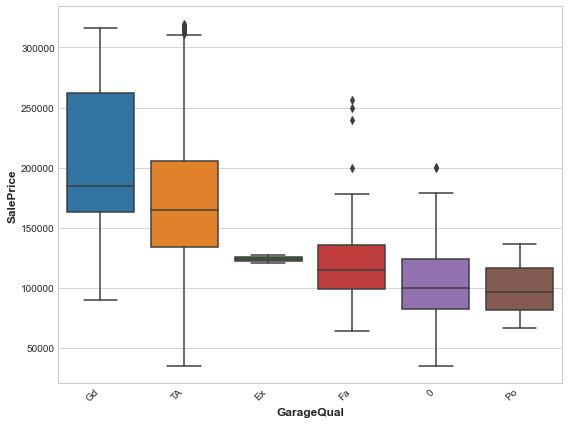

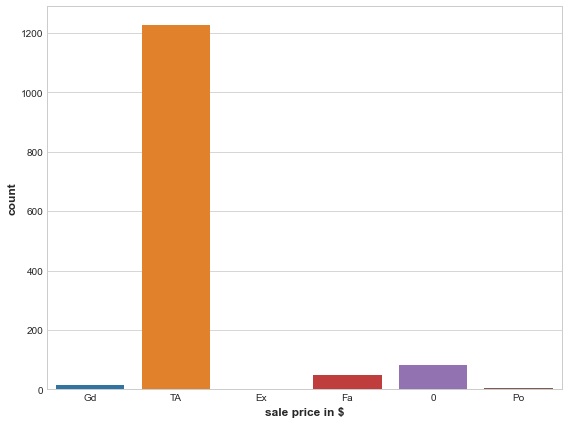



GarageCond
Number of unique values :  6


,mean,median,mean_dif_%,median_dif_%,count,count_%
GarageCond,,,,,,
TA,173446.444803,165000,-3.575751,-4.430380,1241,90.254545
Gd,179930.000000,148000,-7.447488,6.329114,9,0.654545
Ex,124000.000000,124000,25.951823,21.518987,2,0.145455
Fa,114654.028571,114504,31.532888,27.529114,35,2.545455
Po,108500.000000,108000,35.207845,31.645570,7,0.509091


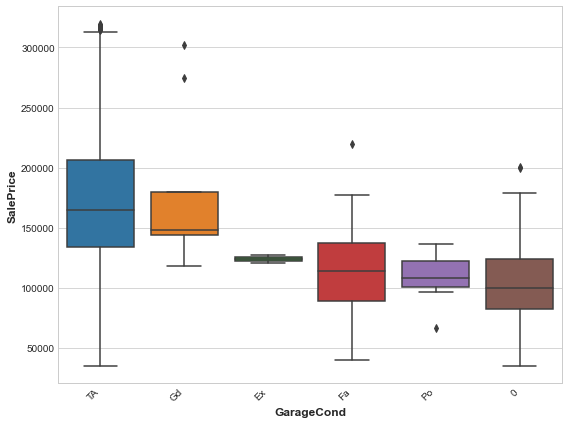

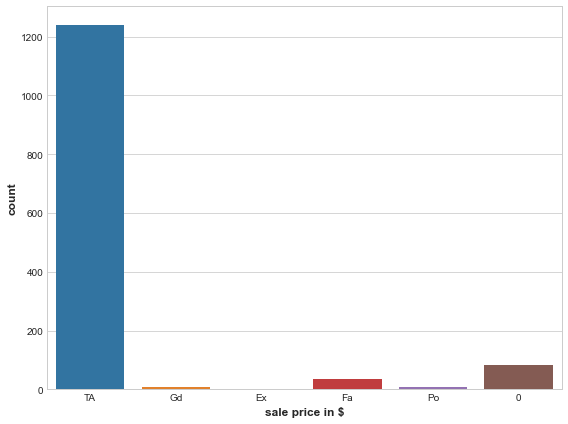



PavedDrive
Number of unique values :  3


,mean,median,mean_dif_%,median_dif_%,count,count_%
PavedDrive,,,,,,
Y,172057.432669,163500,-2.746284,-3.481013,1255,91.272727
P,132330.000000,132250,20.977457,16.297468,30,2.181818
N,115039.122222,111000,31.302925,29.746835,90,6.545455


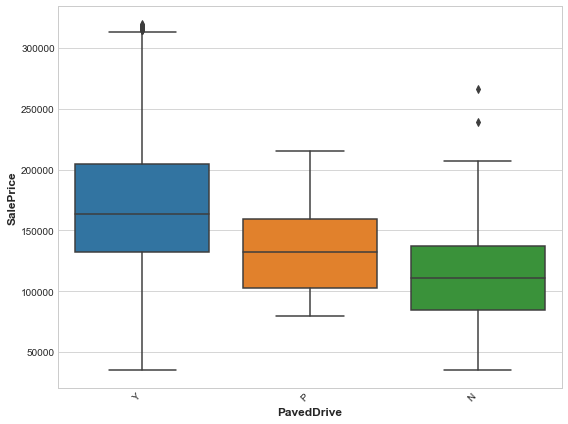

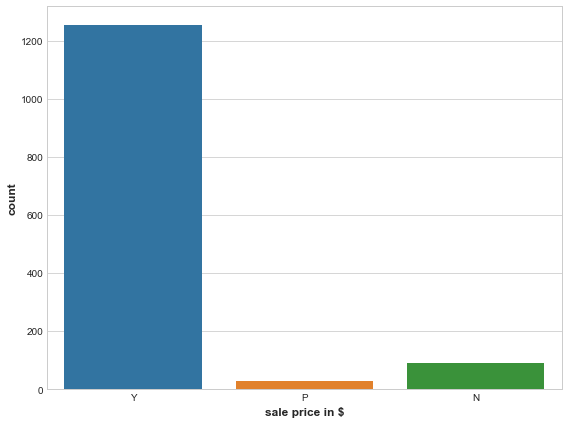



PoolQC
Number of unique values :  4


,mean,median,mean_dif_%,median_dif_%,count,count_%
PoolQC,,,,,,
Ex,235000.000000,235000,-40.333239,-48.734177,1,0.072727
Fa,215500.000000,215500,-28.688566,-36.392405,2,0.145455
Gd,201990.000000,171000,-20.620898,-8.227848,3,0.218182
0,167263.352082,157900,0.116562,0.063291,1369,99.563636


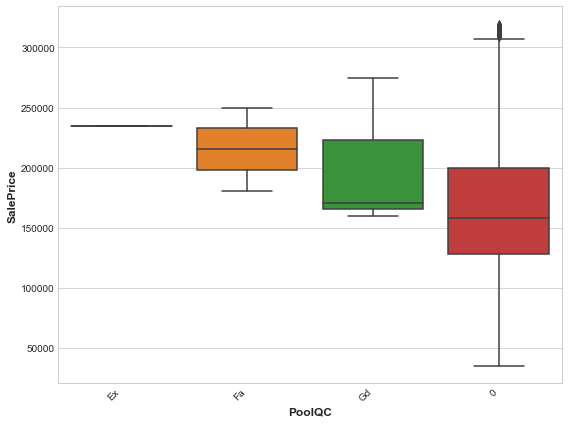

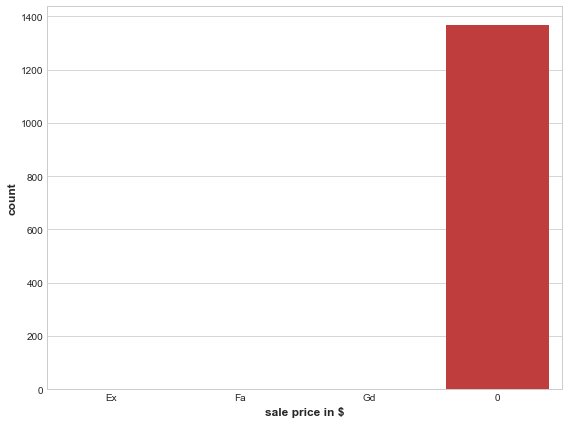



Fence
Number of unique values :  5


,mean,median,mean_dif_%,median_dif_%,count,count_%
Fence,,,,,,
0,172343.556466,166500,-2.917147,-5.379747,1098,79.854545
GdPrv,173822.758621,166250,-3.800471,-5.221519,58,4.218182
GdWo,135839.301887,138500,18.881833,12.341772,53,3.854545
MnPrv,143638.200000,137000,14.224622,13.291139,155,11.272727
MnWw,134286.363636,130000,19.809190,17.721519,11,0.800000


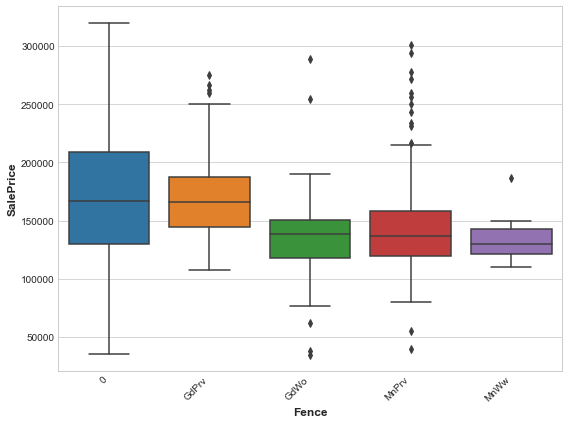

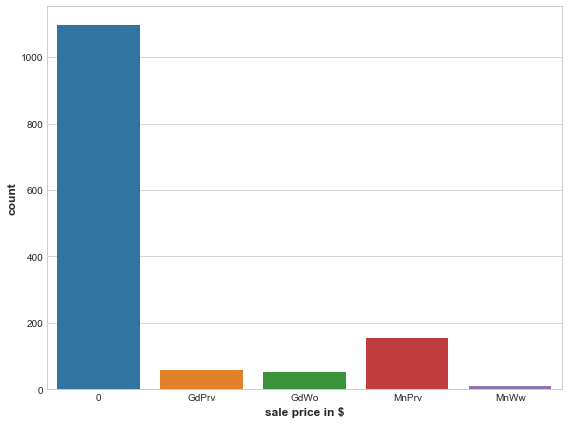



MiscFeature
Number of unique values :  5


,mean,median,mean_dif_%,median_dif_%,count,count_%
MiscFeature,,,,,,
TenC,250000.000000,250000,-49.290680,-58.227848,1,0.072727
Gar2,170750.000000,170750,-1.965534,-8.069620,2,0.145455
0,168105.833460,158900,-0.386537,-0.569620,1321,96.072727
Shed,151187.612245,144000,9.716394,8.860759,49,3.563636
Othr,94000.000000,94000,43.866704,40.506329,2,0.145455


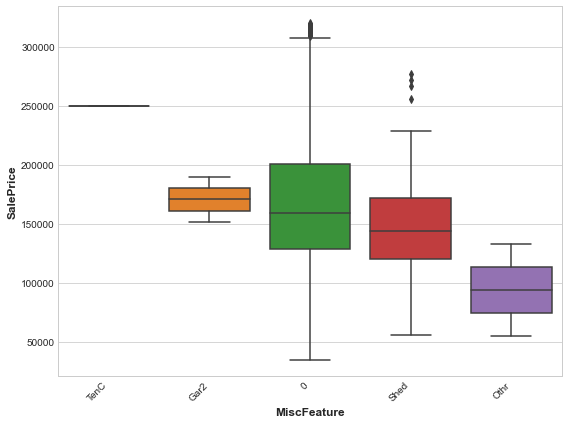

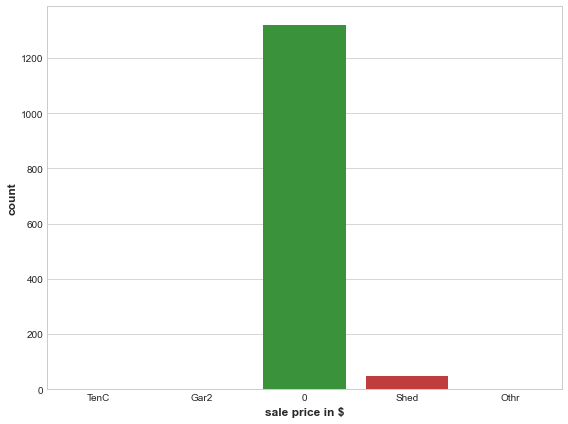



SaleType
Number of unique values :  9


,mean,median,mean_dif_%,median_dif_%,count,count_%
SaleType,,,,,,
New,220002.160920,219210,-31.377089,-38.740506,87,6.327273
Con,215200.000000,215200,-28.509417,-36.202532,1,0.072727
CWD,171166.666667,158000,-2.214352,0.000000,3,0.218182
WD,165015.313934,155000,1.459006,1.898734,1220,88.727273
ConLw,143700.000000,144000,14.187717,8.860759,5,0.363636


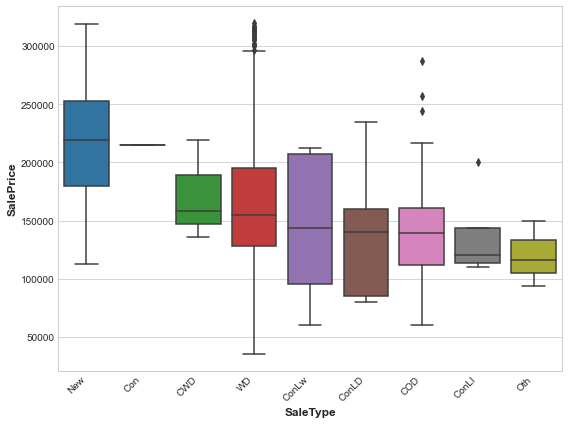

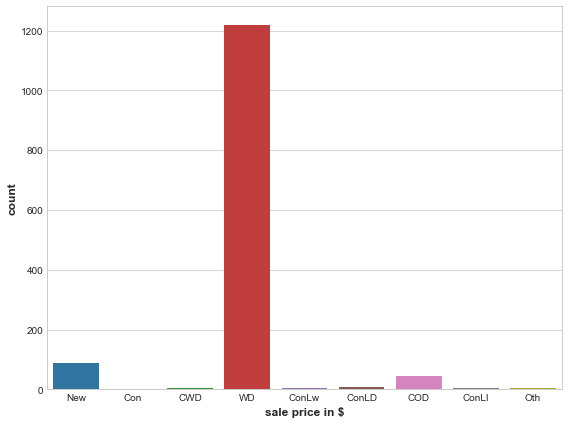



SaleCondition
Number of unique values :  6


,mean,median,mean_dif_%,median_dif_%,count,count_%
SaleCondition,,,,,,
Partial,218147.955556,216055,-30.269826,-36.743671,90,6.545455
Normal,166671.559513,157000,0.469958,0.632911,1151,83.709091
Alloca,149948.090909,142953,10.456590,9.523418,11,0.800000
Family,149600.000000,140500,10.664457,11.075949,20,1.454545
Abnorml,138639.282828,130000,17.209789,17.721519,99,7.200000


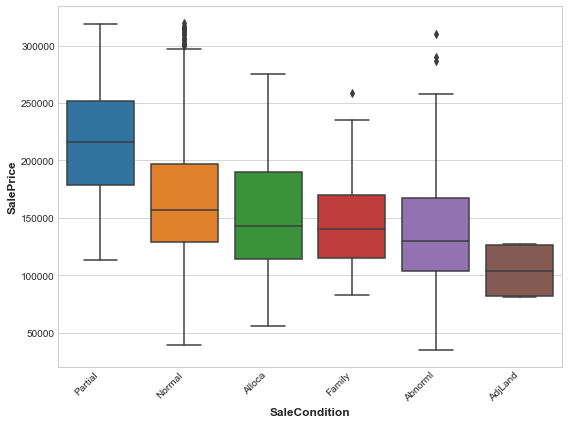

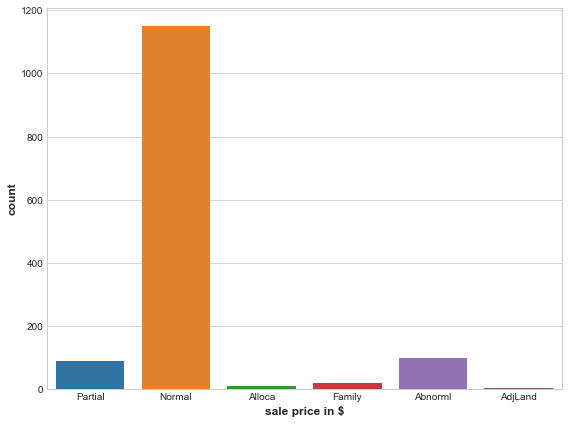

In [56]:
#320000
#outlier removal
plot_categorical_and_median(df=train,thresh=320000,categorical=cats_train,target_col='SalePrice')

## Chart Summary

* MSZoning : Identifies the general zoning classification of the sale.
    * 78% RL(Residential Low Density),15% RM (Residential Medium Density) and Others ...3  Rare Values 
    * Distinct variation in median prices
    
* Street

    * 99% Pave ...Very Imbalanced
    * Distinct variation in median prices
    
* Alley
    * 93% 0  and Others ...2  Rare Values
    * Distinct variation in median prices
    
* LotShape : General shape of property
    * 64% reg(Regular),32% IR1(Slightly irregular) ....2 Rare Values(Irregular)
    * Distinct variation in median prices i.e only Reg and IRs

* LandContour : Flatness of the property
    * 90% Lvl(Level surface) ...3 rare values
    * Distinct variation in median prices i.e Level and Not Level
    
* Utilities

    * 99%  ...Very Imbalanced
    *  No Distinct variation in median prices
    
* LotConfig : Lot configuration
    
    * 72% Inside,17% Corner ...3 rare values i.e >7%
    *  No Distinct variation in median prices i.e Inside and Corner similar price

* LandSlope: Slope of property
    
    * 94% Gtl(Gentle slope)....2 Rare Values
    * Distinct variation in median prices gentle or not
    
* we are gonna comeback to the neigbourhoods

* Condition1: Proximity to various conditions
    
    * 86% Norm(Normal)...8 Rare values
    * Distinct variation in median prices Normal or not

* Condition1: Proximity to various conditions ((if more than one is present))
    
    * 86% Norm(Normal)...6 Rare values
    * Distinct variation in median prices Normal or not
    
* BldgType: Type of dwelling
    
    * 83% 1Fam(Single-family Detached),8% TwnhsE(Townhouse End Unit) ,3 rare values
    * Distinct variation in median prices Single_Family or not
    
* HouseStyle : Style of dwelling
    
    * 49% 1Story(One story) ,30% 2Story(Two story) ,10% 1.5Fin(), 5 rare values
    * Distinct variation in median prices (2.5F>2>SLvl) and (SFoyer>2.5Uf>1.5F>1.5Uf) and (1Story)

* RoofStyle: Type of roof
    
    * 80% Gable, Hip 17%  ,..4 Rare values
    * Distinct variation in median prices (Hip>Gable) and others
    
* RoofMatl: Roof material
    
    * 98 CompShg(Standard (Composite) Shingle) ...Very Imbalanced
    * Distinct variation in median prices
    
* Exterior1st : Exterior covering on house
    
    * 35% VinylSd(Vinyl Siding), 15% [HdBoard(Hard Board) > MetalSd(Metal Siding) > Wd Sdng(Wood Siding)] ,4% Plywood....10 rare values
    * Distinct variation in median prices [Stucco>MetalSd>Wd Sdng] and [ImStucc,Stone>VinylSd >CemntBd] and [Plywood>BrkFace>HdBoard]
    
* Exterior2nd: Exterior covering on house (if more than one material)
    
    * 35% VinylSd(Vinyl Siding), 15% [MetalSd(Metal Siding)>HdBoard(Hard Board)>Wd Sdng(Wood Siding)] ,9% Plywood....10 rare values
    * Distinct variation in median prices [Other(I count), >CemntBd>VinylSd>Stone] and [Plywood>BrkFace>HdBoard>Wd Shng]
      [MetalSd>Wd Sdng>Wd Shng]   
        
* MasVnrType: Masonry veneer type
    
    * 65% None , 30% BrkFace, 7% Stone
    * Distinct variation in median prices [Stone > BrkFace] and others
    
* ExterQual: Evaluates the quality of the material on the exterior
    
    * 65% TA(Average/Typical),32% Gd(Good) , and 2 rare values
    * Distinct variation in median prices [Ex>Gd>TA>Fa]
    * Avg,Upper,Lower
    
* ExterCond: Evaluates the present condition of the material on the exterior
    
    * 87% TA, 10%Gd ,3 rare values
    * Slight Distinct variation in median prices [TA>=Gd]
    * Concat with ExterQual to check both quality of material and present condition
    
* Foundation: Type of foundation
    
    * 45% Cblock(Cinder Block) ,41%  PConc(Poured Contrete) , 10% BrkTil(Brick & Tile) , 6 rare values
    * Distinct variation in median prices [PConc>>CBlock>>]
    
* BsmtQual: Evaluates the height of the basement
    
    * 46% TA(Average/Typical) ,43% Gd(Good)
    * Distinct variation in median prices [Ex>Gd>TA>Fa]
    * Avg,Upper,Lower
    
* BsmtCond: Evaluates the general condition of the basement
    
    * 90% TA, 3%Gd ,3 rare values
    * Slight Distinct variation in median prices [Gd>TA]
    * Concat with BsmtQual to check both quality of material and present condition
    
* BsmtExposure: Refers to walkout or garden level walls
    
    * 67% No , 14% Av(Average) , 7%[Mn(Minimum) ,Gd(Good)] 
    * Distinct variation in median prices [Gd>Av>No]
    * Yes,No OR Good,BAd
    * Concat with [BsmtQual,BsmtCond] to check both quality of material and present condition

* BsmtFinType1: Rating of basement finished area
    
    * Unf(Unfinished) 29.452055%,GLQ(Good Living Quaters) 28.630137% ,ALQ(Average LQ) 15.068493%, 
        [BLQ(Fair LQ),Rec(Average)] 10.136986% ,LwQ(Low Quality) 5.068493%
    * Distinct variation in median prices GLQ and [Unf>ALQ>Rec>LwQ>BLQ] and 0
    * Good , Unfinished , average/low
    * Concat with [BsmtQual,BsmtCond,BsmtExposure] to check both quality of material and present condition
    
* BsmtFinType2: Rating of basement finished area (if multiple types)
    
    * Unf(Unfinished) 85.452055%,GLQ(Good Living Quaters) 1% ,ALQ(Average LQ) 1% and 4 Rare values
    * Distinct variation in median prices GLQ and [Unf>ALQ>Rec>LwQ>BLQ] and 0
    * Good , Unfinished , average/low
    * Concat with [BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1] to check both quality of material and present condition
    
* Heating: Type of heating
    
    * 98% GasA(Gas forced warm air furnace)
    *  No Distinct variation in median prices

*  HeatingQC: Heating quality and condition
    
    * Ex 50.753425% ,TA 29.315068%,Gd 16.506849% ..2 rare values
    * Distinct variation in median prices [Ex>Gd>TA>Fa]
    * Excellent , Good or Average heating
    
* CentralAir: Central air conditioning
    
    * 93% Y and 7% N
    * Distinct variation in median prices i.e Y>N but we cant ascertain due to small N values
    
* Electrical: Electrical system
    
    * 90% SBrkr(Standard Circuit Breakers & Romex) and 4 rare values
    * Distinct variation in median prices i.e SBrkr or Not ... but we cant ascertain due to small  values
    * concat with [CentralAir,Electrical] i.e addition
    
* KitchenQual: Kitchen quality
    
    * TA 50.342466%,Gd 40.136986%,Ex 6.849315%,Fa 2.671233%
    * Distinct variation in median prices [Ex>Gd>TA>Fa]
    * Good or Average

* Functional: Home functionality (Assume typical unless deductions are warranted)
    
    * 93% Typ(Typical Functionality),6 rare values
    * Distinct variation in median prices typ > others
    * Typical or extra deductions (1,0)
    * concat with [CentralAir,Electrical,Functional] i.e addition
    
* FireplaceQu: Fireplace quality
    
    * 50% Po(Poor) ,26% Gd, 22% TA
    * Distinct variation in median prices [Ex,Gd,TA] > others
    * above average or below average
    
* GarageType: Garage location  
    
    * Attchd(Attached to home) 59.589041%,Detchd(Detached from home) 26.506849%,BuiltIn 6.027397%(BuiltIn	Built-In (Garage part of house - typically has room above garage))
    * Distinct variation in median prices [BuiltIn ,Attchd,Basment,2Types] > others

* GarageFinish: Interior finish of the garage
    
    * Unf 41.438356%,RFn 28.904110%,Fin 24.109589%
    * Distinct variation in median prices [Fin,RFn] > Unf
    * concat with [GarageType,GarageFinish] i.e addition
    
* GarageQual: Garage quality
    
    * 89% TA
    * Distinct variation in median prices [Gd,TA,Ex] > others
    * concat with [GarageType,GarageFinish,GarageQual] i.e addition
    
* GarageCond : Garage condition
    
    * 90% TA
    * No distict variation in median price
    * [Ex,Gd,TA] > others for concat with [GarageType,GarageFinish,GarageQual,GarageCond] i.e addition
    
* PavedDrive: Paved driveway
    
    * 91% Y
    * Distinct variation in median prices i.e [Y,P(Partial)] or Not ... but we cant ascertain due to small  values
    
* PooLQC 

    * 90% null

* Fence 

    * 80% 0(No Fence)
    * No distint variation
    * 0 or others for concat with [CentralAir,Electrical,Functional,Fence] i.e addition
    
* MiscFeature: Miscellaneous feature not covered in other categories
    
    * 96 % 0(No misc Feature)
    * No distint variation
    * 0 or others for concat with [CentralAir,Electrical,Functional,Fence,MiscFeature] i.e addition
    
* SaleType: Type of sale
    
    * 88% WD(Warranty Deed Conventional) ,8% New(Home just constructed and sold)
    * two seperate columns: 
        'New' (1,0)i.e 'is it a new house' and ['WD','CWD'(WarrantyDeedCash),'VWD'(WarrantyDeed-VALoan)](1,0) i.e'any warranty'
    *  'New' or not for concat with [CentralAir,Electrical,Functional,Fence,MiscFeature,'New'] i.e addition 
    
* SaleCondition: Condition of sale
    
    * 82% Normal(Normal Sale), 8.6% Partial(Home was not completed when last assessed (associated with New Homes)),
      6% Abnorml(Abnormal Sale -  trade, foreclosure, short sale) and 3 rare values
    * two seperate columns: 
        'Partial' (1,0)i.e 'is it a new house' and ['Normal','Partial'](1,0) i.e'normal or not'
    *  'Partial' or not for concat with [CentralAir,Electrical,Functional,Fence,MiscFeature,'New','Partial','FirePlaces_grouped'] i.e addition 
    

    
    
    
    

In [67]:
(train['SaleCondition'].value_counts()/train.shape[0])*100

Normal     82.054795
Partial     8.561644
Abnorml     6.917808
Family      1.369863
Alloca      0.821918
AdjLand     0.273973
Name: SaleCondition, dtype: float64

In [59]:
(train['Exterior1st'].value_counts()/train.shape[0])*100

VinylSd    35.273973
HdBoard    15.205479
MetalSd    15.068493
Wd Sdng    14.109589
Plywood     7.397260
CemntBd     4.178082
BrkFace     3.424658
WdShing     1.780822
Stucco      1.712329
AsbShng     1.369863
Stone       0.136986
BrkComm     0.136986
AsphShn     0.068493
ImStucc     0.068493
CBlock      0.068493
Name: Exterior1st, dtype: float64

In [48]:
1362/train.shape[0]

0.9328767123287671

In [202]:
sns.barplot(data=train,y='Street')

TypeError: unsupported operand type(s) for /: 'str' and 'int'

In [40]:
## correlation
correlation = train[nums_train].corr()

In [43]:
correlation.SalePrice.sort_values(ascending =False)

SalePrice        1.000000
OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
GarageYrBlt      0.486362
MasVnrArea       0.477493
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.351799
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
Id              -0.021917
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchenAbvGr    -0.135907
Name: SalePr

In [1]:
# top k correlated features
k=25
top_k_corr = correlation.SalePrice.sort_values(ascending =False).index.to_list()[:k]
top_k_corr

NameError: name 'correlation' is not defined